# this is RNAseq analysis of MNX1 or MNX1 fusion gene expression in FL or ABM cells

In [ ]:
# time 

# FL ABM
# ME: fusion
# M&E
# MNX1 
# Ctrl ME M&E MNX1




- Fl specific functions:
  - MNX1 distinct function in FL from ABM
  - How immune related genes in FL activated, but not ABM
  - Only immune compromised recipients develop leukemia with MNX1 OE
- function gene itself is not function
- the competing effect MNX1 vs ETV6


- basic knowledge about TARGET case #
- Why not included in NG paper


# import packages and data 

In [4]:
library(DESeq2)
library(data.table)
library(dplyr)
library(ChIPseeker)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(EnsDb.Hsapiens.v75)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(IRdisplay)
library(ChIPpeakAnno)
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(kableExtra)
library(tidyverse)
library(fgsea)
library(msigdbr)
library(ggrepel)
library(ComplexHeatmap)
library(ggVennDiagram)
library(ggvenn)
library(clusterProfiler)
library(tidyverse)
library(maSigPro)
library(ggfortify)
library(venneuler)
library(eulerr)
library(pheatmap)

txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene


In [5]:
setwd('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_BisiMiao/')


In [6]:
save.image('data/nb_rnaseq_mar25.rdata')

In [11]:
source('~/script/utils.r')

In [12]:
system('rm data/data_nb_rnaseq_mar20.tsv')
base_dirs = c('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/BisiMiao/RNA-seq/mouse_HSPC_ABM_FL_MNX1_rep1_Run6', 
              '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/BisiMiao/RNA-seq/mouse_HSPC_ABM_FL_MNX1_rep2_Run38')
cmd = paste0('find ', base_dirs, ' -name "STAR_genes.readcount.txt" >> data/data_nb_rnaseq_mar20.tsv')
system(cmd[1])
system(cmd[2])


In [13]:
dsn = fread('data/data_nb_rnaseq_mar20.tsv', header = F)
setnames(dsn, 1, 'count_file')
dsn[, count_file2 := sub('DD3', 'D3', count_file)]
dsn[, rep := 'rep1']
dsn[grep('rep2', count_file2), rep := 'rep2']
dsn[, info := sub('.*mm10/', '', count_file2)]
dsn[, info := sub('_S.*', '', info)]
dsn[, info := sub('_rep2.*', '', info)]
dsn[, group_day := sub('(..)_(.*)_(.*)', '\\1', info)]
dsn[, info := sub('.._', '', info)]
dsn[, group_cell_type := sub('_.*', '', info)]
dsn[, group_genotype := str_extract(info, '_(.*)', group = 1)]
dsn[, sampleName := paste0(group_day, '_', group_cell_type, '_', group_genotype, '_', rep)]
dsn[, fileName := count_file]
dsn[, condition := paste0(group_day, '_', group_cell_type, '_', group_genotype)]
dsn[, tag := paste0(group_cell_type, group_day, group_genotype)]

dsn[, group_cell_type := factor(group_cell_type, levels = c('FL', 'ABM'))]
dsn[, group_genotype := factor(group_genotype, levels = c('Ctrl', 'MX', 'MX_ME', 'ME'))]
dsn[, group_day := factor(group_day, levels = c('D1', 'D3', 'D8'))]
dsn[, rep := factor(rep, levels = c('rep1', 'rep2'))]


In [14]:
dsn = dsn[grep('DD3', count_file, invert = T), ]
nrow(dsn)

# D3_ABM_Ctrl_rep2

[1] 48

In [15]:
dsn[, group_cell_type := factor(group_cell_type, levels = c('FL', 'ABM'))]
dsn[, group_genotype := factor(group_genotype, levels = c('Ctrl', 'MX', 'MX_ME', 'ME'))]
dsn[, group_day := factor(group_day, levels = c('D1', 'D3', 'D8'))]
dsn[, rep := factor(rep, levels = c('rep1', 'rep2'))]


In [16]:
saveRDS(dsn, file = 'nb_rnaseq_mar25_dsn.rdsd')

In [17]:
table(dsn$group_genotype)


 Ctrl    MX MX_ME    ME 
   12    12    12    12 

In [18]:
deg = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/RNA-seq/Mouse_HSPC_BM_FL_MNX1_Bisi/DEgenes_STAR_DESeq/DEgenes_D1_FL_MX_vs_Ctrl.txt')
deg = deg[order(pval), ]
head(deg)

id,baseMean,baseMeanA,baseMeanB,foldChange,log2FoldChange,pval,padj,D1_FL_Ctrl_S21,D1_FL_MX_S22
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Mnx1,9737.1312,0.0000,19474.26235,Inf,Inf,4.901738e-128,7.966795e-124,0.0000,19474.26235
Timp3,1030.7361,1964.1218,97.35038,0.04956433,-4.334554,8.688867e-24,7.061008e-20,1964.1218,97.35038
Csf2rb2,2851.6628,836.8535,4866.47203,5.81520208,2.539829,9.882283e-15,5.353892e-11,836.8535,4866.47203
Mmrn1,493.6881,904.6806,82.69548,0.09140848,-3.451528,7.269924e-12,2.953952e-08,904.6806,82.69548
Thbs1,10815.5059,17270.1336,4360.87814,0.25250981,-1.985589,1.110451e-11,3.609634e-08,17270.1336,4360.87814
Hap1,119.3327,0.0000,238.66544,Inf,Inf,7.348279e-11,1.990526e-07,0.0000,238.66544


In [19]:
tmp = dsn[, .(sampleName, fileName, condition)]
dds_all <- DESeqDataSetFromHTSeqCount(sampleTable = tmp, directory = '/', design= ~ condition)
nrow(dds_all)
dds_all <- DESeq(dds_all)

saveRDS(dds_all, file = 'data/nb_rnaseq_mar25_dds_all.rds')


Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 24062

estimating size factors

estimating dispersions

gene-wise dispersion estimates



In [ ]:
tmp = dsn[, .(sampleName, fileName, condition)]
dds <- DESeqDataSetFromHTSeqCount(sampleTable = tmp, directory = '/', design= ~ condition)
nrow(dds_all)

smallestGroupSize <- 15
keep <- rowSums(counts(dds) >= 10) >= smallestGroupSize
dds <- dds[keep,]
nrow(dds)

dds <- DESeq(dds)

saveRDS(dds_all, file = 'data/nb_rnaseq_mar22_dds_filtered.rds')


In [20]:
dds_all = readRDS('data/nb_rnaseq_mar25_dds_all.rds')
dds = readRDS('data/nb_rnaseq_mar25_dds.rds')


# check on QC

[1] 4747   48

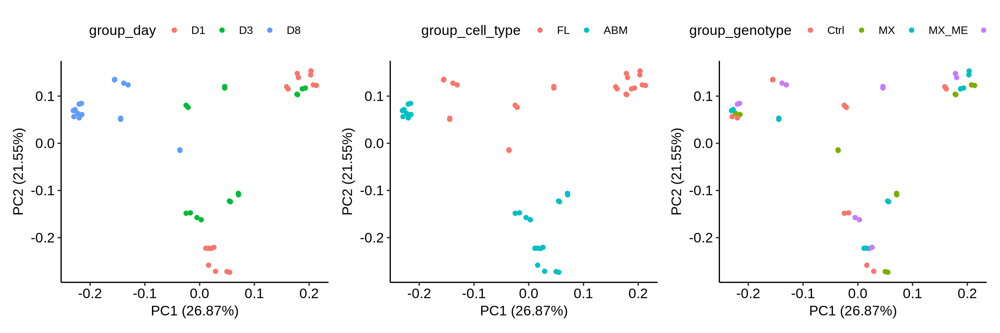

In [69]:
mtx = counts(dds_all, normalized = T)
mtx = log2(mtx)

smallestGroupSize <- 15
keep <- rowSums(mtx >= log2(10)) >= smallestGroupSize
mtx = mtx[keep, ]

# filter low variance
keep = rowVars(mtx) 
keep = keep[keep > 0.2]
keep = keep[!is.na(keep)]
keep = names(keep) 
mtx = mtx[keep, ]
dim(mtx)

df = t(mtx)
pca_res <- prcomp(df, scale = TRUE)

options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 200)
autoplot(pca_res, data = dsn, color = 'group_day') + theme_pubr() |
autoplot(pca_res, data = dsn, color = 'group_cell_type') + theme_pubr()  |
autoplot(pca_res, data = dsn, color = 'group_genotype') + theme_pubr() 


# compare each condition vs control

## DEGs

In [70]:
mtx = counts(dds, normalize = T)
mtx_all = counts(dds_all, normalize = T)
head(mtx)

,D8_ABM_MX_ME_rep1,D8_ABM_Ctrl_rep1,D8_FL_MX_ME_rep1,D3_FL_MX_rep1,D1_ABM_MX_rep1,D1_FL_MX_ME_rep1,D3_FL_Ctrl_rep1,D1_ABM_Ctrl_rep1,D8_ABM_ME_rep1,D1_FL_Ctrl_rep1,⋯,D1_FL_Ctrl_rep2,D8_FL_MX_ME_rep2,D3_FL_MX_rep2,D1_ABM_Ctrl_rep2,D8_ABM_ME_rep2,D1_FL_MX_rep2,D3_ABM_MX_rep2,D3_FL_MX_ME_rep2,D3_ABM_ME_rep2,D8_FL_MX_rep2
0610005C13Rik,4.149125,2.284768,6.074606,6.883525,18.00036,15.965762,14.19999,20.689849,2.231784,3.320694,⋯,5.269944,3.185809,9.262981,18.14634,5.609575,9.559176,10.14969,10.97596,10.53430,12.20188
0610007P14Rik,362.011113,364.420455,223.747974,326.279093,514.01014,464.147523,253.01807,581.196674,351.505937,560.090312,⋯,528.970636,270.156614,303.362623,348.40969,319.745753,344.865672,302.92913,368.79228,415.69968,433.84462
0610009B22Rik,80.907928,102.814549,47.584411,97.746058,26.00051,61.582227,54.21816,101.568351,76.996539,59.772484,⋯,58.628128,86.654008,74.103847,44.76097,93.960375,60.296344,49.96769,83.41730,44.56819,119.98515
0610009L18Rik,22.820185,30.844365,25.310857,31.664216,36.00071,7.982881,21.94545,3.761791,40.172107,14.389672,⋯,15.151089,23.574988,24.701282,43.55121,26.645479,16.177068,28.88757,26.34231,51.05084,20.33647
0610009O20Rik,650.375267,668.294566,476.856543,578.216115,458.00904,597.575681,641.58154,543.578767,624.899443,820.211307,⋯,698.926332,412.880863,635.286104,529.87307,605.834058,708.114376,530.12597,791.00091,486.19845,550.44037
0610010F05Rik,970.895135,995.016353,1006.359668,697.989453,1050.02072,1060.582793,1204.41766,1139.822604,1017.693379,1220.908328,⋯,1228.555711,980.592051,661.531216,1157.73637,1022.344973,919.151578,678.46756,734.65764,851.65763,933.44382


In [16]:
res_d1_FL_me_ctrl = results(dds, contrast = c('condition', 'D1_FL_ME', 'D1_FL_Ctrl'))
res_d3_FL_me_ctrl = results(dds, contrast = c('condition', 'D3_FL_ME', 'D3_FL_Ctrl'))
res_d8_FL_me_ctrl = results(dds, contrast = c('condition', 'D8_FL_ME', 'D8_FL_Ctrl'))

res_d1_FL_mx_ctrl = results(dds, contrast = c('condition', 'D1_FL_MX', 'D1_FL_Ctrl'))
res_d3_FL_mx_ctrl = results(dds, contrast = c('condition', 'D3_FL_MX', 'D3_FL_Ctrl'))
res_d8_FL_mx_ctrl = results(dds, contrast = c('condition', 'D8_FL_MX', 'D8_FL_Ctrl'))

res_d1_FL_mxme_ctrl = results(dds, contrast = c('condition', 'D1_FL_MX_ME', 'D1_FL_Ctrl'))
res_d3_FL_mxme_ctrl = results(dds, contrast = c('condition', 'D3_FL_MX_ME', 'D3_FL_Ctrl'))
res_d8_FL_mxme_ctrl = results(dds, contrast = c('condition', 'D8_FL_MX_ME', 'D8_FL_Ctrl'))


In [17]:
res_d1_ABM_me_ctrl = results(dds, contrast = c('condition', 'D1_ABM_ME', 'D1_ABM_Ctrl'))
res_d3_ABM_me_ctrl = results(dds, contrast = c('condition', 'D3_ABM_ME', 'D3_ABM_Ctrl'))
res_d8_ABM_me_ctrl = results(dds, contrast = c('condition', 'D8_ABM_ME', 'D8_ABM_Ctrl'))

res_d1_ABM_mx_ctrl = results(dds, contrast = c('condition', 'D1_ABM_MX', 'D1_ABM_Ctrl'))
res_d3_ABM_mx_ctrl = results(dds, contrast = c('condition', 'D3_ABM_MX', 'D3_ABM_Ctrl'))
res_d8_ABM_mx_ctrl = results(dds, contrast = c('condition', 'D8_ABM_MX', 'D8_ABM_Ctrl'))

res_d1_ABM_mxme_ctrl = results(dds, contrast = c('condition', 'D1_ABM_MX_ME', 'D1_ABM_Ctrl'))
res_d3_ABM_mxme_ctrl = results(dds, contrast = c('condition', 'D3_ABM_MX_ME', 'D3_ABM_Ctrl'))
res_d8_ABM_mxme_ctrl = results(dds, contrast = c('condition', 'D8_ABM_MX_ME', 'D8_ABM_Ctrl'))


In [18]:
vs_ctrl_list = list(res_d1_FL_me_ctrl, res_d3_FL_me_ctrl, res_d8_FL_me_ctrl, res_d1_FL_mx_ctrl, res_d3_FL_mx_ctrl, res_d8_FL_mx_ctrl, res_d1_FL_mxme_ctrl, 
                    res_d3_FL_mxme_ctrl, res_d8_FL_mxme_ctrl, res_d1_ABM_me_ctrl, res_d3_ABM_me_ctrl, res_d8_ABM_me_ctrl, res_d1_ABM_mx_ctrl, 
                    res_d3_ABM_mx_ctrl, res_d8_ABM_mx_ctrl, res_d1_ABM_mxme_ctrl, res_d3_ABM_mxme_ctrl, res_d8_ABM_mxme_ctrl) 

vs_ctrl_list = lapply(vs_ctrl_list, function(xx){as.data.table(xx, keep.rownames = T)})

names(vs_ctrl_list) = c('res_d1_FL_me_ctrl',    'res_d3_FL_me_ctrl',    'res_d8_FL_me_ctrl',    'res_d1_FL_mx_ctrl',    'res_d3_FL_mx_ctrl',   
                        'res_d8_FL_mx_ctrl',    'res_d1_FL_mxme_ctrl',  'res_d3_FL_mxme_ctrl',  'res_d8_FL_mxme_ctrl',  'res_d1_ABM_me_ctrl',    
                        'res_d3_ABM_me_ctrl',   'res_d8_ABM_me_ctrl',   'res_d1_ABM_mx_ctrl',   'res_d3_ABM_mx_ctrl',   'res_d8_ABM_mx_ctrl',   
                        'res_d1_ABM_mxme_ctrl', 'res_d3_ABM_mxme_ctrl', 'res_d8_ABM_mxme_ctrl')

vs_ctrl_dt = rbindlist(vs_ctrl_list, idcol = T)



Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message in .local(x, row.names, optional, ...):
"Argument

In [19]:
vs_ctrl_dt[, day := 'd1']
vs_ctrl_dt[grep('d3', .id), day := 'd3']
vs_ctrl_dt[grep('d8', .id), day := 'd8']

vs_ctrl_dt[, cell_type := 'FL']
vs_ctrl_dt[grep('ABM', .id), cell_type := 'ABM']

vs_ctrl_dt[, genotype := 'me']
vs_ctrl_dt[grep('_mx_ctrl', .id), genotype := 'mx']
vs_ctrl_dt[grep('_me_ctrl', .id), genotype := 'me']
vs_ctrl_dt[grep('_mx_me_ctrl', .id), genotype := 'mx_me']
    

In [9]:
#save(vs_ctrl_dt, file = 'data/vs_ctrl_dt.rds')
load('data/vs_ctrl_dt.rds')

## individual cell type heatmap 

[1] 2349    8

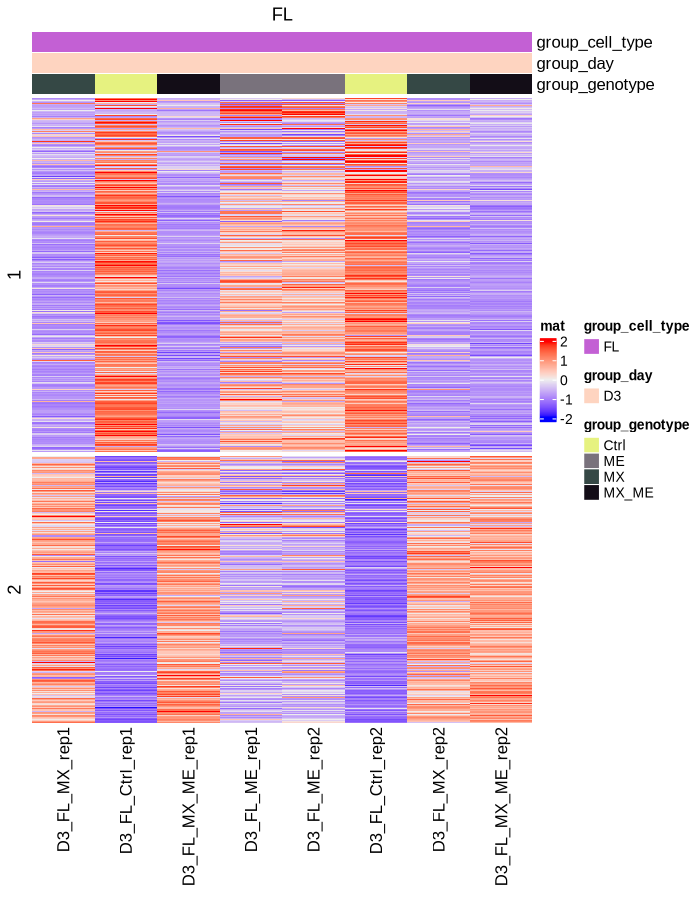

In [22]:
# how ME genes looks like in other samples 
gene_sel = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & day == 'd3' & genotype == 'me' & cell_type == 'FL', rn]

dsn_sel = dsn[group_cell_type == 'FL' & group_day == 'D3', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = F, km = 2)


[1] 4277    8

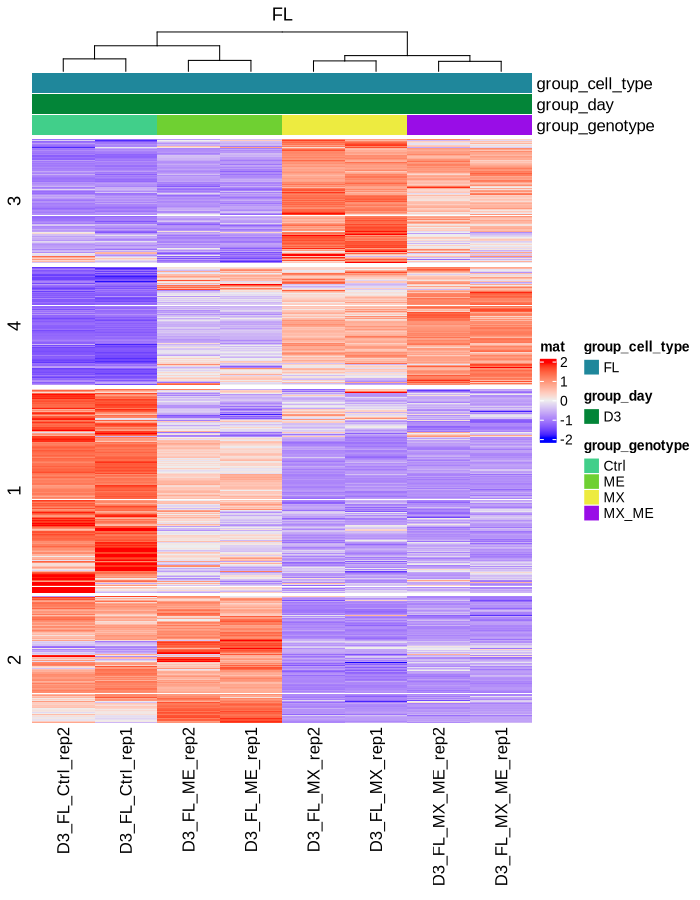

In [23]:
# how ME genes looks like in other samples 
gene_sel = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & day == 'd3' & cell_type == 'FL', rn]
# & genotype == 'me'

dsn_sel = dsn[group_cell_type == 'FL' & group_day == 'D3', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = T, cluster_rows = T, km = 4)


[1] 86786467088 53752648490 29970747325 19383185974 15283184905 11898828453
 [7]  9942174980  8227767098  7445215228  6161379419  5435444253  4976646847
[13]  3868580126  3653435073  3362173663

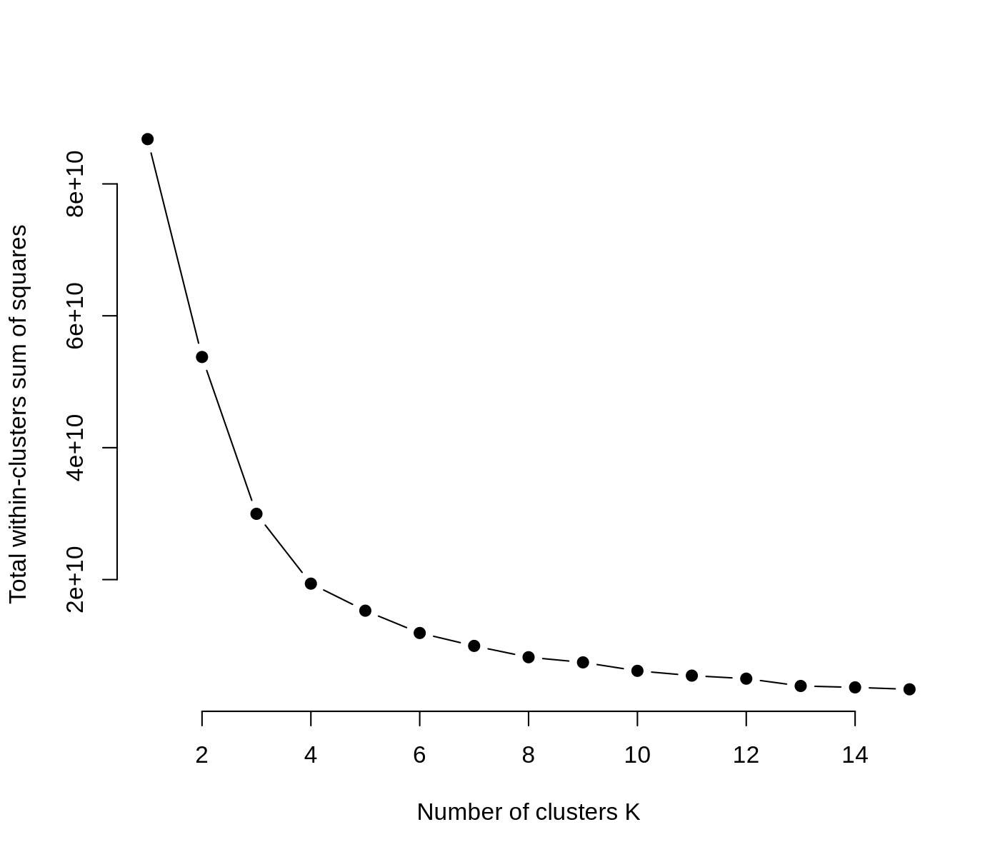

In [598]:
#Elbow Method for finding the optimal number of clusters
set.seed(123)
# Compute and plot wss for k = 2 to k = 15.
k.max <- 15
data <- mtx_norm_counts
wss <- sapply(1:k.max, 
              function(k){kmeans(data, k, nstart=50,iter.max = 15 )$tot.withinss})
wss
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
plot(1:k.max, wss, type="b", pch = 19, frame = FALSE, 
     xlab="Number of clusters K", ylab="Total within-clusters sum of squares")


[1] 2494    8

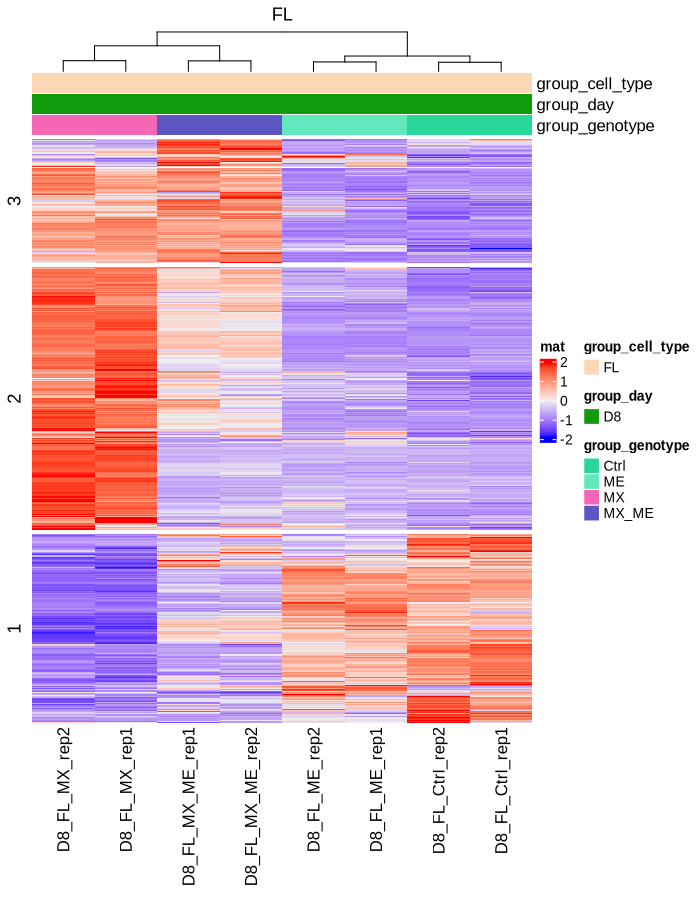

In [601]:
# how ME genes looks like in other samples 
gene_sel = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & day == 'd8' & cell_type == 'FL', rn]
# & genotype == 'me'

dsn_sel = dsn[group_cell_type == 'FL' & group_day == 'D8', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = T, cluster_rows = T, km = 3)


[1] 1550    8

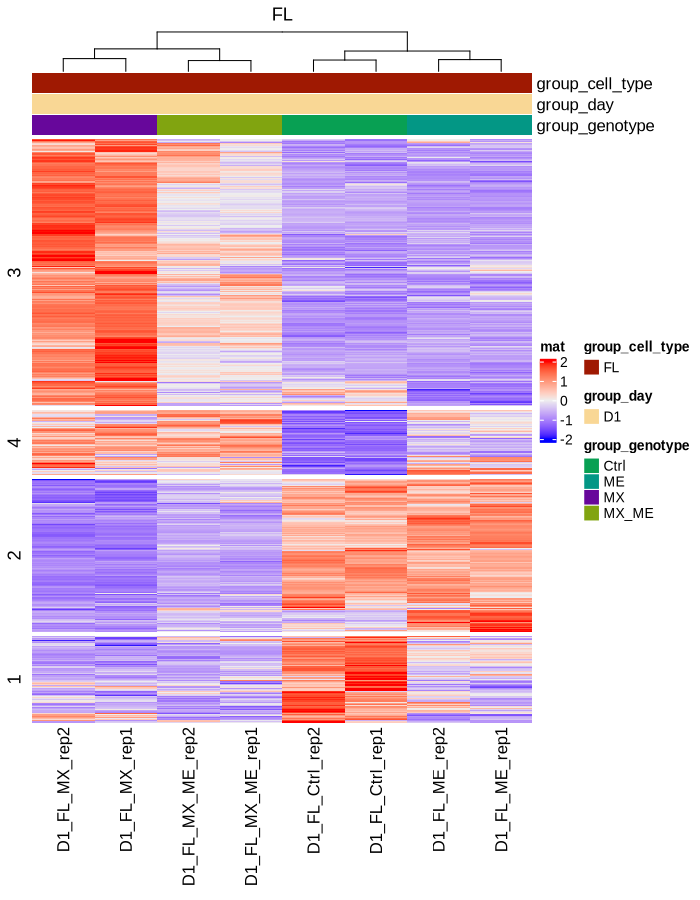

In [604]:
# how ME genes looks like in other samples 
gene_sel = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & day == 'd1' & cell_type == 'FL', rn]
# & genotype == 'me'

dsn_sel = dsn[group_cell_type == 'FL' & group_day == 'D1', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = T, cluster_rows = T, km = 4)


[1] 8321   24

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



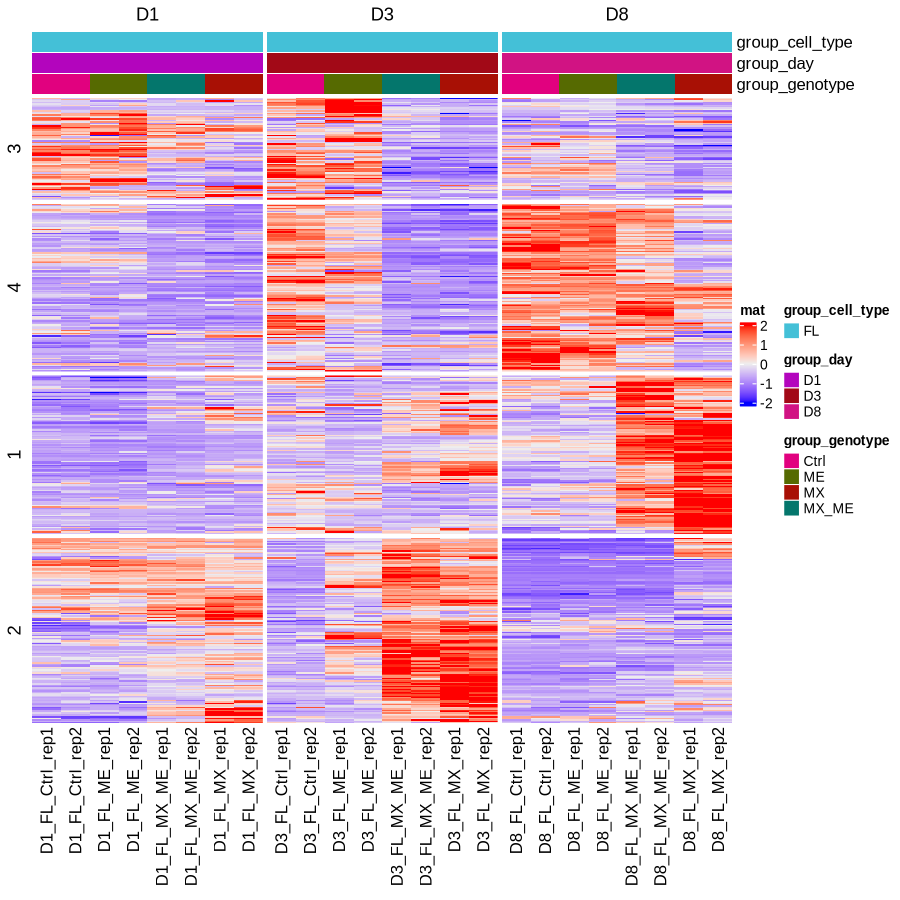

In [609]:
# how ME genes looks like in other samples 
gene_sel = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'FL', rn]
# & genotype == 'me'

dsn_sel = dsn[group_cell_type == 'FL', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 9, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_day)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)


[1] 2864   24

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



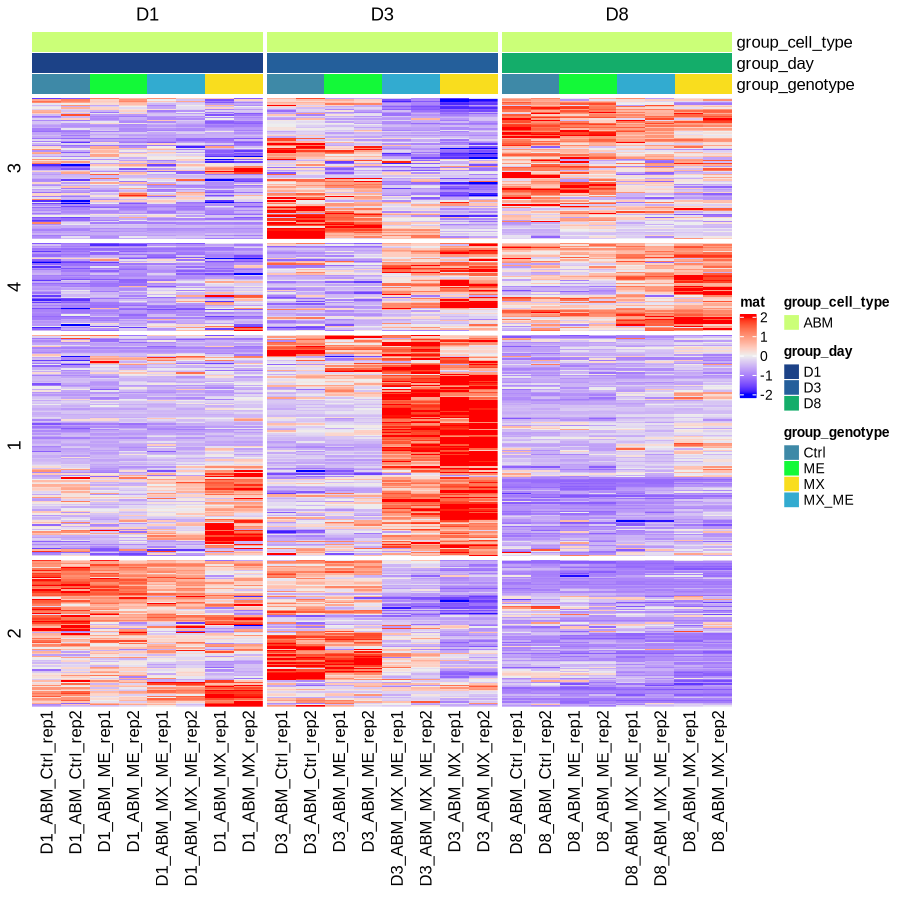

In [610]:
# how ME genes looks like in other samples 
gene_sel = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM', rn]
# & genotype == 'me'

dsn_sel = dsn[group_cell_type == 'ABM', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 9, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_day)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)


## both cell type

[1] 3996   32

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



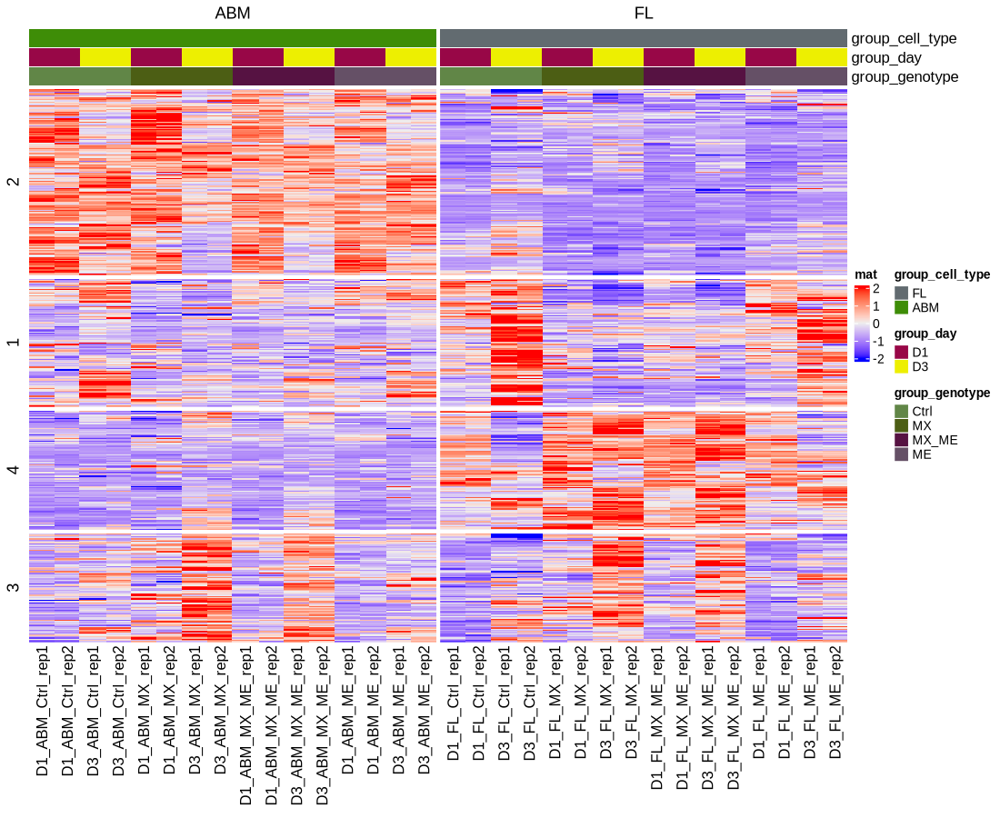

In [52]:
# how ME genes looks like in other samples 
gene_sel = unique(vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1, rn])

dsn_sel = dsn[group_day %in% c('D1', 'D3'), .(group_cell_type, group_day, group_genotype, sampleName)]
keycol = c('group_cell_type', 'group_genotype', 'group_day')
dsn_sel = setorderv(dsn_sel, keycol)
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 11, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
tmp = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
tmp


In [59]:
col_split

[1] "FL"  "FL"  "FL"  "FL"  "FL"  "FL"  "FL"  "FL"  "ABM" "ABM" "ABM" "ABM"
[13] "ABM" "ABM" "ABM" "ABM"

## day 1, both cell type, all genotype 

[1] 1050   16

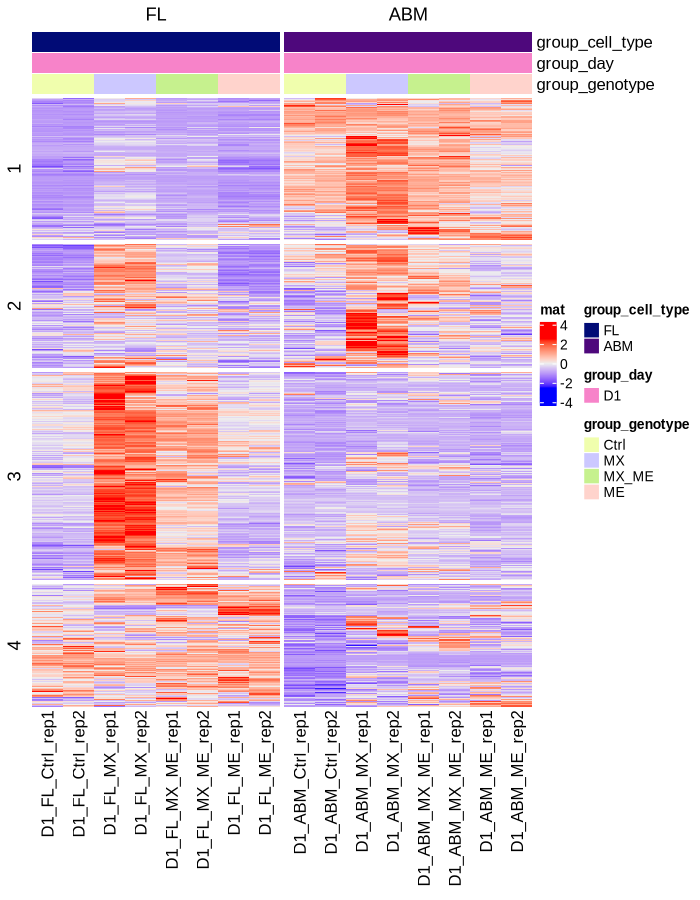

In [85]:
# how ME genes looks like in other samples 
gene_sel = unique(vs_ctrl_dt[padj < 0.1 & (log2FoldChange) > 1 & day == 'd1', rn])
# & genotype == 'me'
# gene_sel = intersect(vs_ctrl_dt$rn, bisi_list)
keycol = c('group_cell_type', 'group_genotype', 'group_day', 'rep')

dsn_sel = dsn[group_day %in% c('D1'), .(group_cell_type, group_day, group_genotype, sampleName)]
keycol = c('group_cell_type', 'group_genotype', 'group_day')
dsn_sel = setorderv(dsn_sel, keycol)
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts)
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 5] = 5
plotdat[plotdat < -5] = -5

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
ht_d1 = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = F, column_split = factor(col_split, levels = c('FL', 'ABM')), show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
ht_d1 = draw(ht_d1)


In [86]:
ro_ht_d1 = row_order(ht_d1)
gene_sel = rownames(plotdat)[ro_ht_d1[['3']]] 
length(gene_sel)


[1] 366

In [87]:
lapply(ro_ht_d1, length)

$`1`
[1] 250

$`2`
[1] 219

$`3`
[1] 366

$`4`
[1] 215

Path_class,Gene_NormRead_over10_n,Gene_in_Path_n,Significant_gene_n,Overlap_n,P_value,Percentage,padj,logPval
<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
Axon guidance,11569,299,322,23,1.027228e-05,0.07692308,0.04561920,4.988333
RAF/MAP kinase cascade,11569,128,322,14,1.256639e-05,0.10937500,0.05579477,4.900790
MAPK1/MAPK3 signaling,11569,134,322,14,2.125147e-05,0.10447761,0.09433525,4.672611
Pathways in cancer,11569,368,322,25,3.542402e-05,0.06793478,0.15721178,4.450702
MAPK family signaling cascades,11569,159,322,15,3.660293e-05,0.09433962,0.16240722,4.436484
Primary Focal Segmental Glomerulosclerosis FSGS,11569,54,322,8,1.125325e-04,0.14814815,0.49919404,3.948722


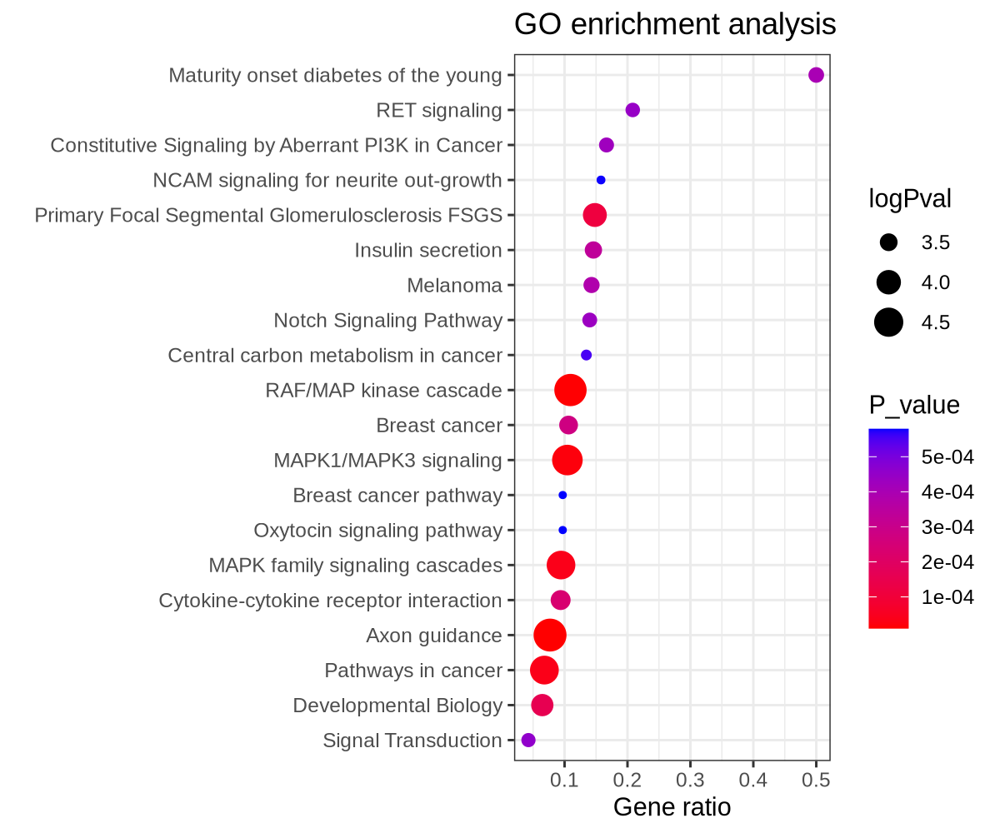

In [93]:
anno = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/RNA-seq/Erythroid_Metabolome/CPDB_gene2path.txt', header=T, sep="\t")
uni_path = unique(anno$path_id)
geneid = fread('~/workspace/mouse_to_human.csv')
setkey(geneid, `Gene name`)
gene_sel_hsa = geneid[`Gene name` %in% gene_sel, `Human gene name`]
sig_gene = gene_sel_hsa
sig_gene = sig_gene[!is.na(sig_gene)]
sig_gene = sig_gene[sig_gene != '']

gene_all_mmu = rownames(dds)
gene_all = geneid[`Gene name` %in% gene_all_mmu, `Human gene name`]
gene_all = gene_all[!is.na(gene_all)]
gene_all = gene_all[gene_all != '']

N = length(gene_all)
enrich_path = data.table(Path_class = uni_path)
k = NULL; n = NULL; M = NULL;
for (w in 1:nrow(enrich_path)){
    pathway_name = enrich_path[w, Path_class]
    gene_in_path = intersect(unique(anno[path_id == pathway_name, gene_id]), gene_all)
    M[w] = length(gene_in_path)
    gene_in_cluster = intersect(sig_gene, gene_all)
    n[w] = length(gene_in_cluster)
    k[w] = length(intersect(gene_in_path, gene_in_cluster))
}
p = 1-phyper(k-1, M, N-M, n)
ratio = k/M
enrich_path$Gene_NormRead_over10_n = N
enrich_path$Gene_in_Path_n = M
enrich_path$Significant_gene_n = n
enrich_path$Overlap_n = k
enrich_path$P_value = p
enrich_path$Percentage = ratio

enrich_path[, padj := p.adjust(P_value)] 
enrich_path[, logPval := -log(P_value, 10)]
enrich_path = enrich_path[order(P_value),]
head(enrich_path)

options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 200)
plotdat = enrich_path[1:20, ][order(Percentage), ]
plotdat[, Path_class := factor(Path_class, levels = plotdat$Path_class)] 
ggplot(data = plotdat, aes(y = Percentage, x = Path_class,  color = `P_value`, size = logPval)) +  geom_point() + coord_flip() +
scale_color_gradient(low = "red", high = "blue") + theme_bw() +  ylab("") +  xlab("") +  ggtitle("GO enrichment analysis") + ylab('Gene ratio')


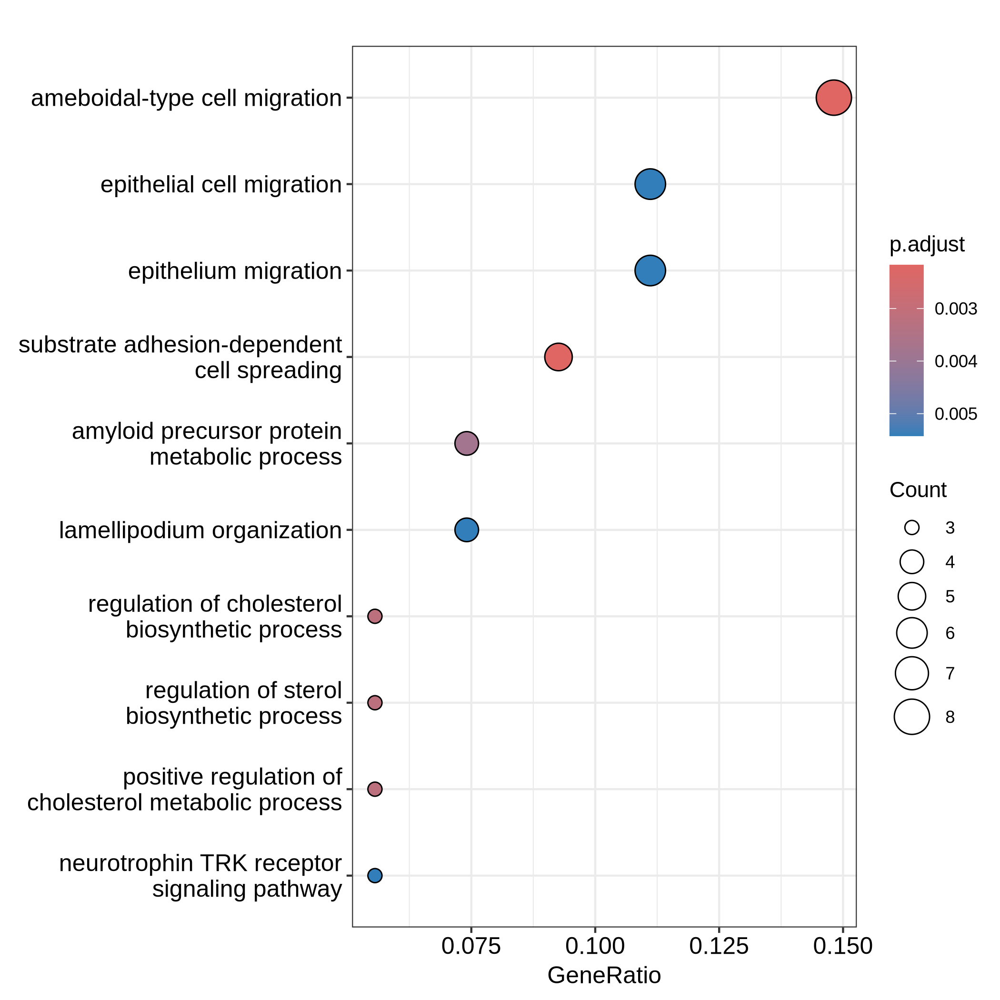

In [526]:
#david = enrichDAVID(gene = gene, idType="SYMBOL", annotation="KEGG_PATHWAY")
yy <- enrichGO(intersect(bisi_list, gene_sel), 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)


In [533]:
tmp = as.data.table(yy@result)
tmp[grep('necrosis', Description), ]


ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>


In [165]:
ro_ht_d1 = row_order(ht_d1)
lapply(ro_ht_d1, length)
tmp = rownames(plotdat)[ro_ht_d1[['1']]] #unique(vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & day == 'd1', rn])
write(tmp, file = 'data/FL_day1_MX_upregualted_cluster1.txt', sep = '\n')

Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


$`1`
[1] 280

$`2`
[1] 183

$`3`
[1] 151

$`4`
[1] 269

## Bisi gene list

In [167]:
d1_deg = fread('data/DEgenes_D1_ABM_FL_ALL_Combined_Heatmap.csv')
d1_deg = setDF(d1_deg[, 2:ncol(d1_deg)], rownames = d1_deg$V1)
mat = data.matrix(d1_deg)
#d1_deg = log2(d1_deg + 1)
#plotdat = t(scale(t(d1_deg)))
#plotdat = pheatmap:::scale_rows(plotdat)
#plotdat = scale_fun(d1_deg)
#logdat = t(scale(t(plotdat)))

#plotdat = plotdat[!is.na(plotdat[,1]), ]
#plotdat[plotdat > 5] = 5
#plotdat[plotdat < -5] = -5


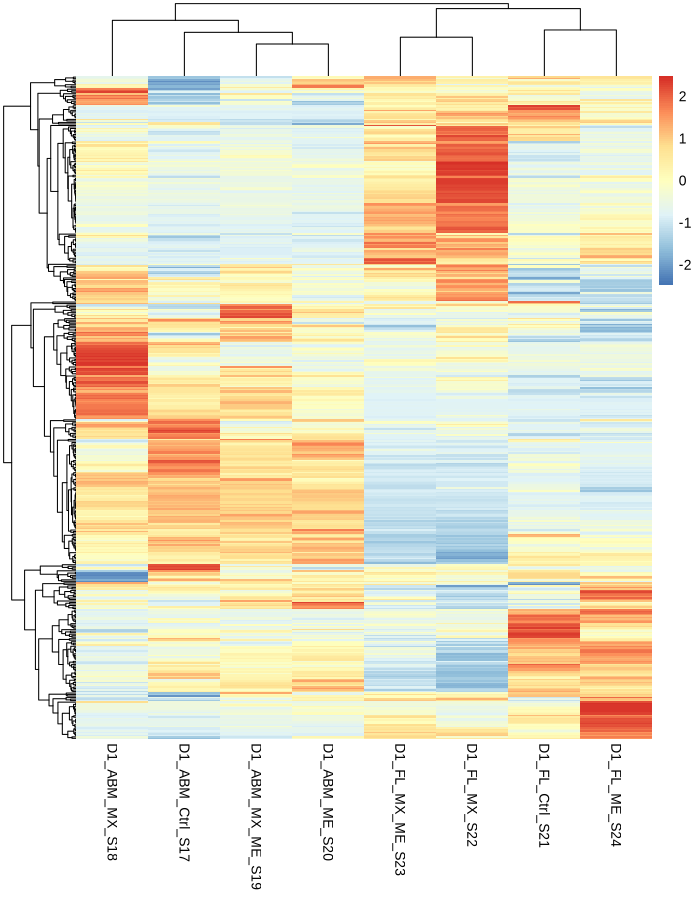

In [168]:
options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
#pdf('results/heatmap.pdf', width = 7, height = 60)
pheatmap(mat, scale = 'row', show_rownames = F, clustering_distance_rows = 'correlation', 
         clustering_method = 'average')
#dev.off()


In [169]:
dim(mat)

[1] 439   8

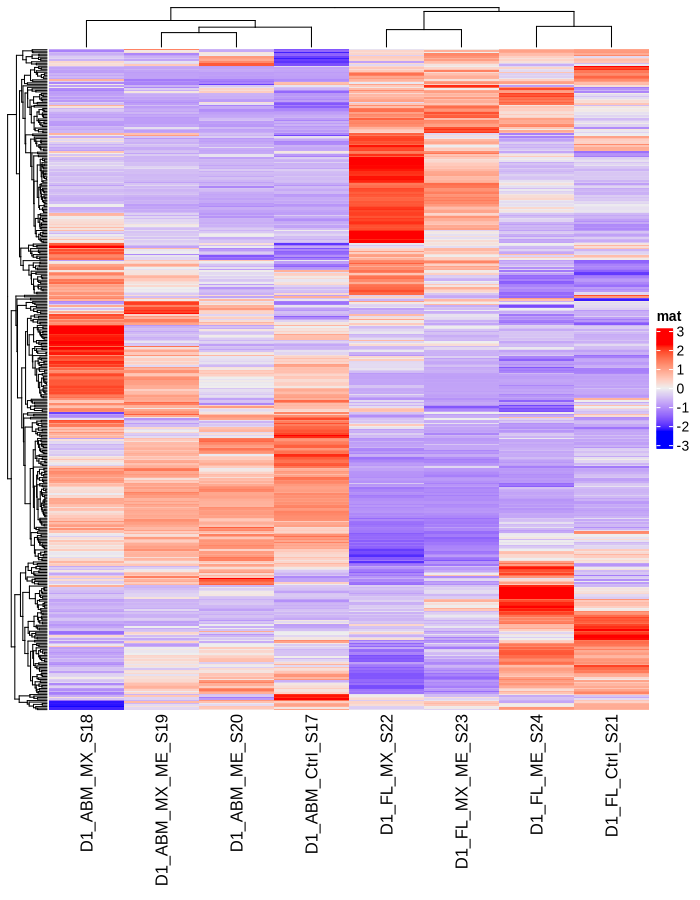

In [170]:
options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
plotdat = t(scale(t(mat))) 
ht = Heatmap(plotdat, name = "mat", row_dend_reorder = F, clustering_distance_rows = "euclidean", 
    clustering_method_rows = "average", show_row_dend = T, cluster_columns = T, cluster_rows = T, show_row_names = F)
ht = draw(ht); 
ht_d1 = row_order(ht)
# center=TRUE, scale=TRUE


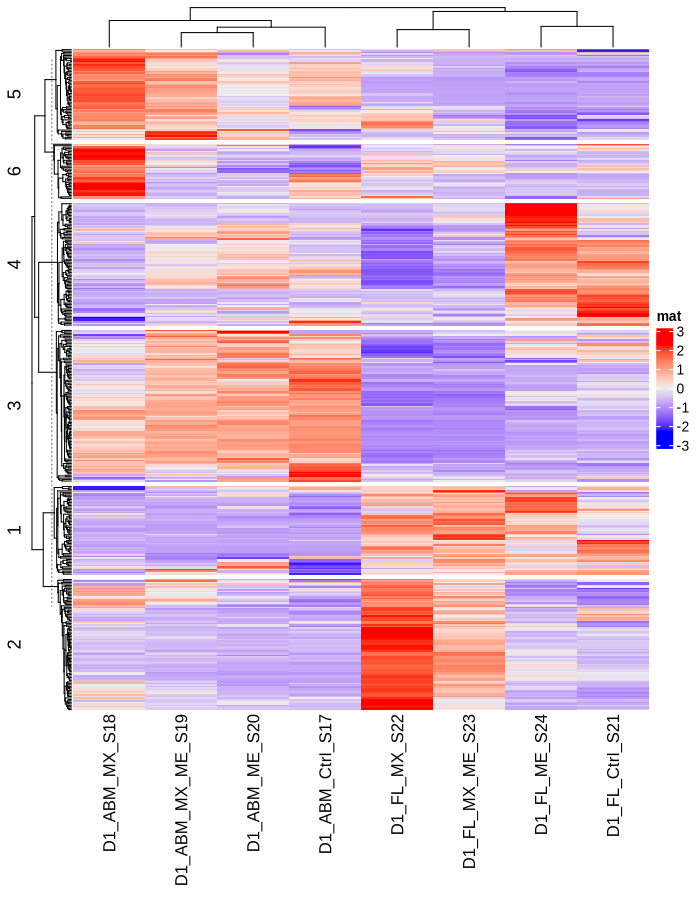

In [171]:
options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
set.seed(1234)
plotdat = t(scale(t(mat))) 
ht = Heatmap(plotdat, name = "mat", row_dend_reorder = F, clustering_distance_rows = "euclidean", km = 6,
    clustering_method_rows = "average", show_row_dend = T, cluster_columns = T, cluster_rows = T, show_row_names = F)
ht = draw(ht); 
ht_d1 = row_order(ht)
# center=TRUE, scale=TRUE


In [172]:
lapply(ht_d1, length)
tmp = rownames(plotdat)[ht_d1[['2']]] 


$`5`
[1] 62

$`6`
[1] 38

$`4`
[1] 84

$`3`
[1] 104

$`1`
[1] 61

$`2`
[1] 90

In [186]:
gene_sel = c('Cd59a', 'Ddah5', 'Kdr', 'Tlr15', 'Sla5', 'Ccnjl', 'Plvap', 'Bmp8a', 'Grap5', 'Mtss1l', 'Phldb1', 
             'Tmcc5', 'Dmwd', 'Cdc45bpg', 'Il15rb1', 'Chpf', 'A430105I19Rik', 'Ddit4', 'Mnx1', 'Cep170b', 
             'Slco5b1', 'Agrn', 'St3gal5', 'Rab11fip4', 'Hap1', 'Fbxo5', 'Nlrp6', 'Ak1', 'Tgm5', 'Dmpk', 
             'Cmklr1', 'Apoe', 'Tle6', 'Isg15', 'Glipr5', 'Smtnl5', 'Ckb', 'Pvrl5', 'Exoc3l4', 'Ptp4a3', 
             'Pald1', 'Cdkn1a', 'Slc9a3r5', 'Soat5', 'Chst1', 'Eya5', 'Tspan18', 'Lingo1', 'Epha5', 'Fgfr3', 
             'Matn1', 'Abcg1', 'Cd38', 'Map1a', 'C77080', 'Myl9', 'Myo15', 'R74865', 'Sec14l5', 'Src', 'Csf5rb2', 
             'Csf5rb', 'Htra3', '4933431E50Rik', 'Mn1', 'Lama5', 'Plekhg5', 'Slc5a1', 'Dmtn', 'Parvb', 'Micall5', 
             'Ovca5', 'Ltc4s', 'Tmem150b', 'P5rx1', 'Map3k6', 'Tfr5', 'Dpf3', 'Fam46c', 'Epn5', 'Slc6a4', 'F11r', 
             'Pard6b', 'Tspan9', 'Sardh', 'Adra5a', 'Tesc', 'Cnnm5', 'Atp8a5', 'Serpine1', 'Tubb3')
gene_sel
length(gene_sel)
length(intersect(tmp, gene_sel))


[1] "Cd59a"         "Ddah5"         "Kdr"           "Tlr15"        
 [5] "Sla5"          "Ccnjl"         "Plvap"         "Bmp8a"        
 [9] "Grap5"         "Mtss1l"        "Phldb1"        "Tmcc5"        
[13] "Dmwd"          "Cdc45bpg"      "Il15rb1"       "Chpf"         
[17] "A430105I19Rik" "Ddit4"         "Mnx1"          "Cep170b"      
[21] "Slco5b1"       "Agrn"          "St3gal5"       "Rab11fip4"    
[25] "Hap1"          "Fbxo5"         "Nlrp6"         "Ak1"          
[29] "Tgm5"          "Dmpk"          "Cmklr1"        "Apoe"         
[33] "Tle6"          "Isg15"         "Glipr5"        "Smtnl5"       
[37] "Ckb"           "Pvrl5"         "Exoc3l4"       "Ptp4a3"       
[41] "Pald1"         "Cdkn1a"        "Slc9a3r5"      "Soat5"        
[45] "Chst1"         "Eya5"          "Tspan18"       "Lingo1"       
[49] "Epha5"         "Fgfr3"         "Matn1"         "Abcg1"        
[53] "Cd38"          "Map1a"         "C77080"        "Myl9"         
[57] "Myo15"         "R74865"        "Sec14l5"       "Src"          
[61] "Csf5rb2"       "Csf5rb"        "Htra3"         "4933431E50Rik"
[65] "Mn1"           "Lama5"         "Plekhg5"       "Slc5a1"       
[69] "Dmtn"          "Parvb"         "Micall5"       "Ovca5"        
[73] "Ltc4s"         "Tmem150b"      "P5rx1"         "Map3k6"       
[77] "Tfr5"          "Dpf3"          "Fam46c"        "Epn5"         
[81] "Slc6a4"        "F11r"          "Pard6b"        "Tspan9"       
[85] "Sardh"         "Adra5a"        "Tesc"          "Cnnm5"        
[89] "Atp8a5"        "Serpine1"      "Tubb3"

[1] 91

[1] 47

In [59]:
head(uni_path)

[1] "Rosiglitazone Pharmacokinetic Pathway"                                                
[2] "&gamma;-linolenate biosynthesis"                                                      
[3] "Plasma lipoprotein assembly, remodeling, and clearance"                               
[4] "Signaling by Overexpressed Wild-Type EGFR in Cancer"                                  
[5] "Carbamazepine Pathway, Pharmacokinetics"                                              
[6] "RUNX1 regulates genes involved in megakaryocyte differentiation and platelet function"

In [69]:
enrich_path[1, Path_class]

[1] "ECM proteoglycans"

In [176]:
gene_sel = tmp

Path_class,Gene_NormRead_over10_n,Gene_in_Path_n,Significant_gene_n,Overlap_n,P_value,Percentage,padj,logPval
<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
ECM proteoglycans,11569,27,54,4,6.870402e-06,0.14814815,0.03051146,5.163018
HDL remodeling,11569,3,54,2,6.396365e-05,0.66666667,0.28399860,4.194067
Extracellular matrix organization,11569,157,54,6,8.561748e-05,0.03821656,0.38005600,4.067438
Signaling events mediated by PRL,11569,21,54,3,1.204725e-04,0.14285714,0.53465716,3.919112
Cell-Cell communication,11569,66,54,4,2.465902e-04,0.06060606,1.00000000,3.608024
Robo4 and VEGF Signaling Pathways Crosstalk,11569,6,54,2,3.169531e-04,0.33333333,1.00000000,3.499005


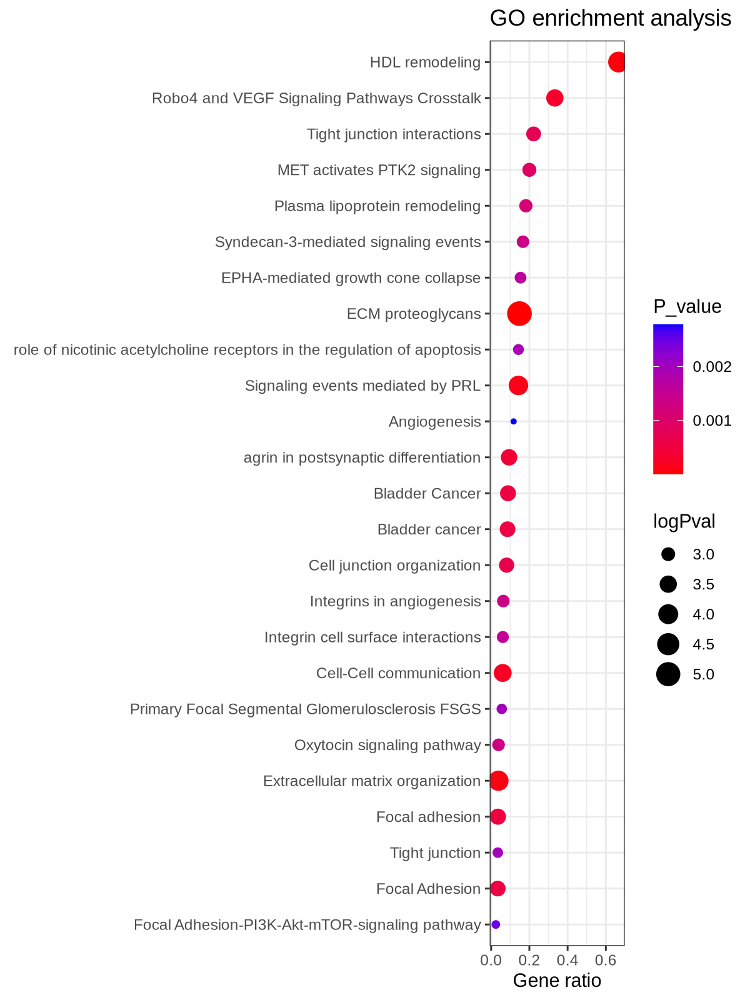

In [191]:
anno = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/RNA-seq/Erythroid_Metabolome/CPDB_gene2path.txt', header=T, sep="\t")
uni_path = unique(anno$path_id)
geneid = fread('~/workspace/mouse_to_human.csv')
setkey(geneid, `Gene name`)
gene_sel_hsa = geneid[`Gene name` %in% gene_sel, `Human gene name`]
sig_gene = gene_sel_hsa
sig_gene = sig_gene[!is.na(sig_gene)]
sig_gene = sig_gene[sig_gene != '']

gene_all_mmu = rownames(dds)
gene_all = geneid[`Gene name` %in% gene_all_mmu, `Human gene name`]
gene_all = gene_all[!is.na(gene_all)]
gene_all = gene_all[gene_all != '']

N = length(gene_all)
enrich_path = data.table(Path_class = uni_path)
k = NULL; n = NULL; M = NULL;
for (w in 1:nrow(enrich_path)){
    pathway_name = enrich_path[w, Path_class]
    gene_in_path = intersect(unique(anno[path_id == pathway_name, gene_id]), gene_all)
    M[w] = length(gene_in_path)
    gene_in_cluster = intersect(sig_gene, gene_all)
    n[w] = length(gene_in_cluster)
    k[w] = length(intersect(gene_in_path, gene_in_cluster))
}
p = 1-phyper(k-1, M, N-M, n)
ratio = k/M
enrich_path$Gene_NormRead_over10_n = N
enrich_path$Gene_in_Path_n = M
enrich_path$Significant_gene_n = n
enrich_path$Overlap_n = k
enrich_path$P_value = p
enrich_path$Percentage = ratio

enrich_path[, padj := p.adjust(P_value)] 
enrich_path[, logPval := -log(P_value, 10)]
enrich_path = enrich_path[order(P_value),]
head(enrich_path)

options(repr.plot.width = 6, repr.plot.height = 8, repr.plot.res = 200)
plotdat = enrich_path[order(P_value), ][1:25, ][order(Percentage), ]
plotdat[, Path_class := factor(Path_class, levels = plotdat$Path_class)] 
ggplot(data = plotdat, aes(y = Percentage, x = Path_class,  color = `P_value`, size = logPval)) +  geom_point() + coord_flip() +
scale_color_gradient(low = "red", high = "blue") + theme_bw() +  ylab("") +  xlab("") +  ggtitle("GO enrichment analysis") + ylab('Gene ratio')


In [196]:
head(plotdat, 20)


Path_class,Gene_NormRead_over10_n,Gene_in_Path_n,Significant_gene_n,Overlap_n,P_value,Percentage,padj,logPval
<fct>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
Focal Adhesion-PI3K-Akt-mTOR-signaling pathway,11569,203,54,5,2.492878e-03,0.02463054,1.00000000,2.603299
Focal Adhesion,11569,145,54,5,5.570663e-04,0.03448276,1.00000000,3.254093
Tight junction,11569,115,54,4,1.998346e-03,0.03478261,1.00000000,2.699329
Focal adhesion,11569,141,54,5,4.902419e-04,0.03546099,1.00000000,3.309590
Extracellular matrix organization,11569,157,54,6,8.561748e-05,0.03821656,0.38005600,4.067438
Oxytocin signaling pathway,11569,103,54,4,1.331786e-03,0.03883495,1.00000000,2.875566
Primary Focal Segmental Glomerulosclerosis FSGS,11569,54,54,3,2.015281e-03,0.05555556,1.00000000,2.695664
Cell-Cell communication,11569,66,54,4,2.465902e-04,0.06060606,1.00000000,3.608024
Integrin cell surface interactions,11569,49,54,3,1.521726e-03,0.06122449,1.00000000,2.817663


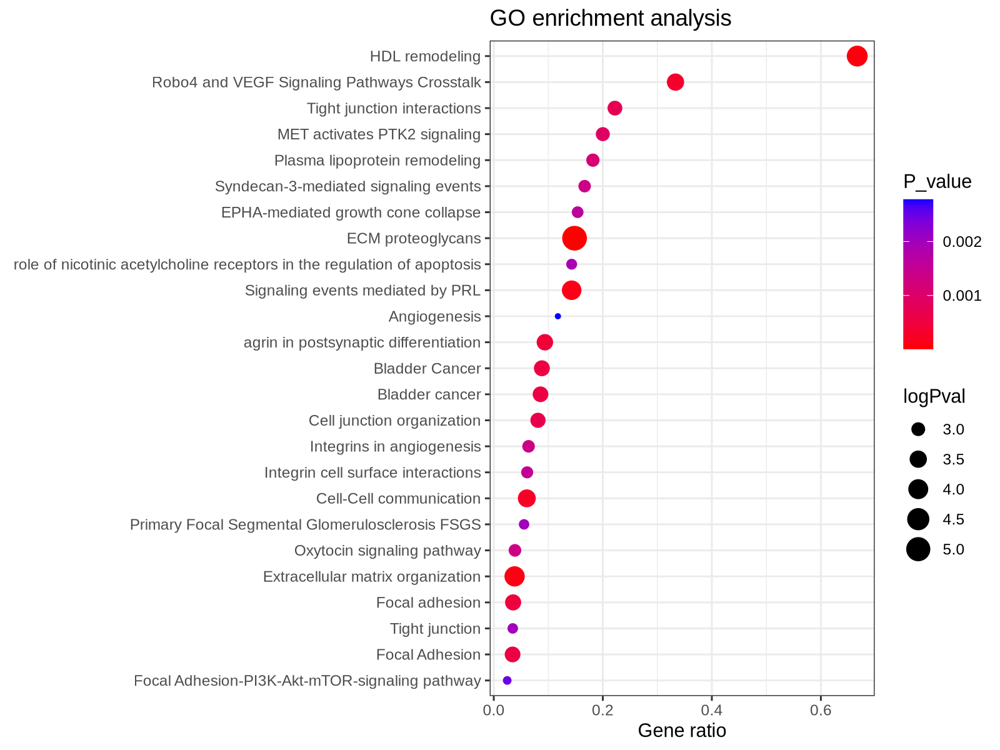

In [194]:
options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)
plotdat = enrich_path[order(P_value), ][1:25, ][order(Percentage), ]
plotdat[, Path_class := factor(Path_class, levels = plotdat$Path_class)] 
ggplot(data = plotdat, aes(y = Percentage, x = Path_class,  color = `P_value`, size = logPval)) +  geom_point() + coord_flip() +
scale_color_gradient(low = "red", high = "blue") + theme_bw() +  ylab("") +  xlab("") +  ggtitle("GO enrichment analysis") + ylab('Gene ratio')


In [46]:
enrich_path[grep('infl', Path_class, ignore.case = T), ]


Path_class,Gene_NormRead_over10,Gene_in_Path,Gene_in_Cluster,Overlap,P_value,Percentage,padj,logPval
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ApoE and miR-146 in inflammation and atherosclerosis,11569,8,54,1,0.03674774,0.12500000,1,1.4347694
Inflammatory Response Pathway,11569,16,54,1,0.07216918,0.06250000,1,1.1416482
"Relationship between inflammation, COX-2 and EGFR",11569,21,54,1,0.09365502,0.04761905,1,1.0284689
influence of ras and rho proteins on g1 to s transition,11569,28,54,1,0.12291690,0.03571429,1,0.9103884
Inflammatory mediator regulation of TRP channels,11569,67,54,1,0.26974693,0.01492537,1,0.5690435
Influenza A,11569,123,54,0,1.00000000,0.00000000,1,0.0000000
Inflammatory bowel disease (IBD),11569,40,54,0,1.00000000,0.00000000,1,0.0000000
Influenza A virus infection,11569,1,54,0,1.00000000,0.00000000,1,0.0000000
Nanomaterial induced inflammasome activation,11569,3,54,0,1.00000000,0.00000000,1,0.0000000


In [ ]:
pathway_fun = function(){ 
        #setwd('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/YuannyuZhang/Collaboration_Projects/for_Min/RNA-Seq_Zheng')
        anno=read.table('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/RNA-seq/Erythroid_Metabolome/CPDB_gene2path.txt',header=T,sep="\t")
        uni_path=as.vector(unique(anno[,2]))
        # use CPDB database to do pathway enrichment.
        ## do path enrichment using CPDB database.
        norm_readcount=read.table('readcount_TPM_FPKM/normalized_readcount_CI_CD_HI_HD_NI_ND.txt',header=T,sep="\t",row.names=1)
        metab_gene=read.table('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/RNA-seq/Erythroid_Metabolome/Metabolic_Gene_List/Sabatini_Metabolic_Gene_List_Human.txt',header=T,sep="\t")[,1,drop=FALSE]
        name=c('maSigPro_CD_CI_NI','maSigPro_HD_HI_NI')
        for (i in 1:length(name)){
                sig_gene=read.table(paste0(name[i],'/maSigPro_sig_gene_2cluster.txt'),header=T,sep="\t")
                sig_gene=merge(sig_gene,metab_gene,by.x=0,by.y='Gene.Symbol')
                all_gene=rownames(norm_readcount)
                N=length(all_gene)
                enrich_path=matrix(NA,length(uni_path),7)
                enrich_path[,1]=uni_path
                for (j in 1:2){
                        k=NULL; n=NULL; M=NULL;
                        for (w in 1:dim(enrich_path)[1]){
                                gene_in_path=intersect(unique(as.vector(anno[anno[,2]==enrich_path[w,1],1])),all_gene)
                                M[w]=length(gene_in_path)
                                gene_in_cluster=sig_gene[sig_gene[,2]==j,1]
                                n[w]=length(gene_in_cluster)
                                k[w]=length(intersect(gene_in_path,gene_in_cluster))
                        }
                        p=1-phyper(k-1,M,N-M,n)
                        ratio=k/M
                        enrich_path[,2:7]=cbind(N,M,n,k,p,ratio)
                        enrich_path=enrich_path[order(p),]
                        colnames(enrich_path)=c('Path_class','#Gene_NormRead_over10','#Gene_in_Path','#Gene_in_Cluster','#Overlap','P_value','Percentage')
                        write.table(enrich_path,paste0(name[i],'/maSigPro_group',j,'_enrich_CPDB_path.txt'),row.names=F,col.names=T,sep="\t",quote=F)
                }
        }
}

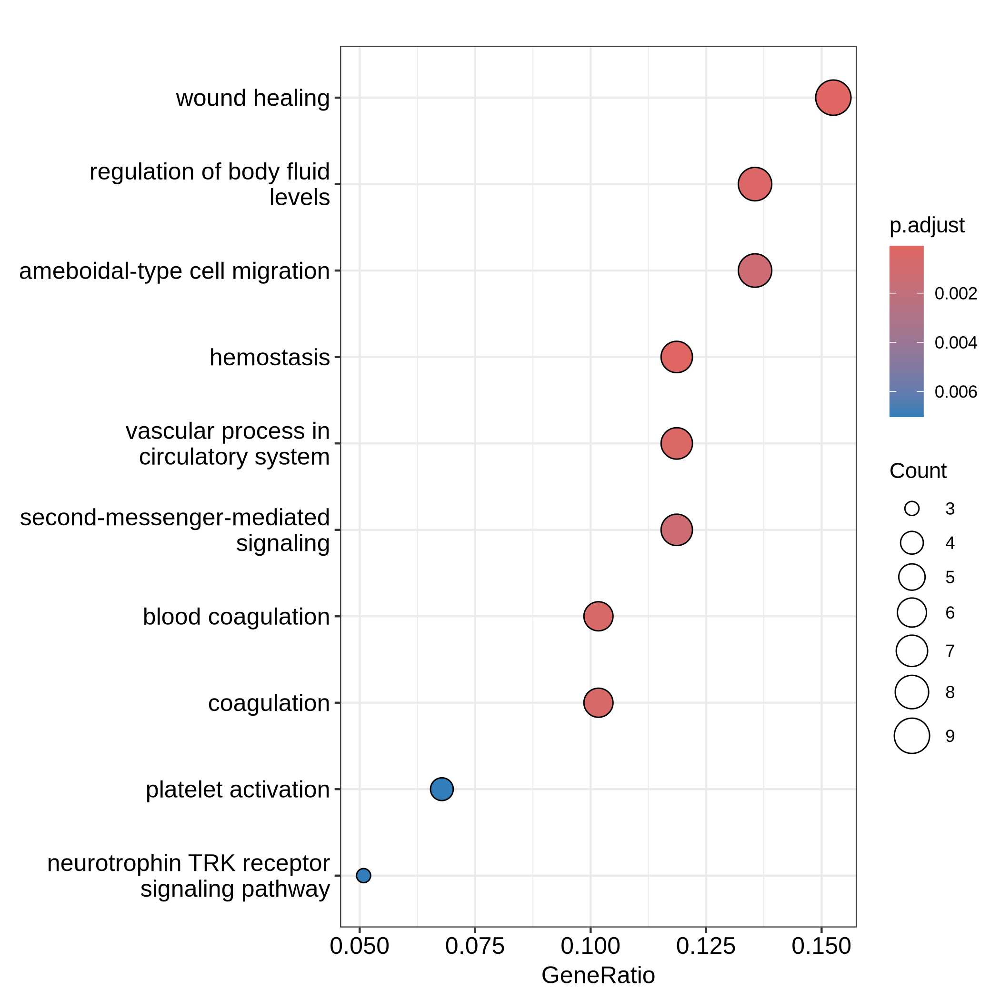

In [682]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 300)
yy <- enrichGO(gene_sel, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
print(dotplot(yy))

In [236]:
bisi_list = tmp

Warning message:
"The input is a data frame-like object, convert it to a matrix."


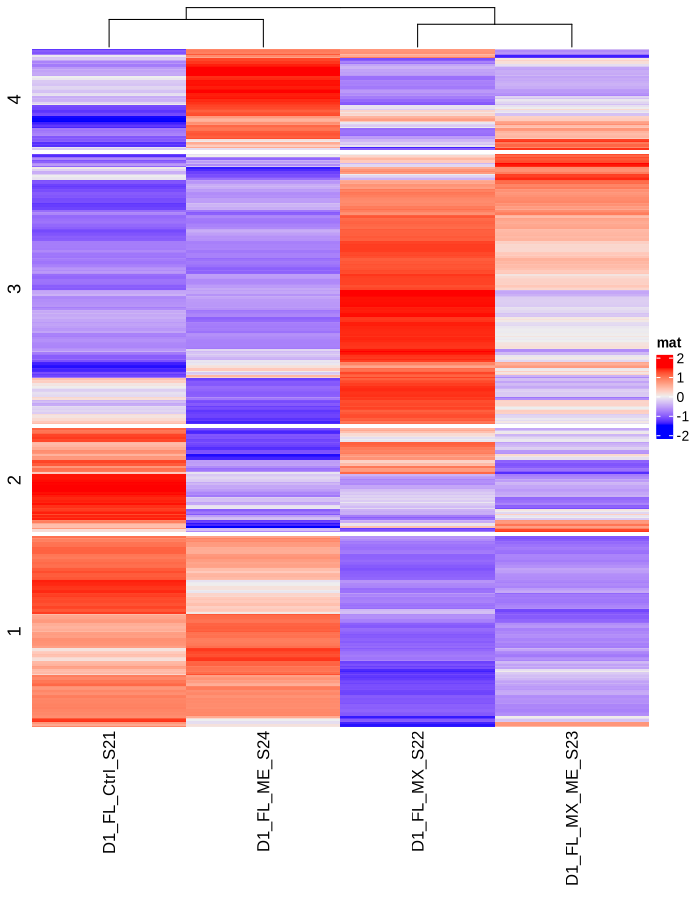

In [346]:
d1_deg = fread('data/DEgenes_D1_ABM_FL_ALL_Combined_Heatmap.csv')
d1_deg = setDF(d1_deg[, 2:ncol(d1_deg)], rownames = d1_deg$V1)
plotdat = scale_fun(d1_deg[, 1:4])
#plotdat = t(scale(t(d1_deg[, 1:4])))
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
ht_d1 = Heatmap(plotdat, name = "mat", show_row_dend = F, cluster_columns = T, cluster_rows = T, show_row_names = F, km = 4) 
ht_d1 = draw(ht_d1)


In [347]:
ro_ht_d1 = row_order(ht_d1)
lapply(ro_ht_d1, length)
tmp = rownames(plotdat)[ro_ht_d1[['3']]] 
tmp
length(tmp)
#for(ii in 1:6){
#    tmp = rownames(plotdat)[ro_ht_d1[[ii]]] 
#    print(tmp)
#    write(tmp, file = 'data/bisi_list_6clusters.txt', sep = '\n')
#}

$`4`
[1] 66

$`3`
[1] 177

$`2`
[1] 68

$`1`
[1] 125

[1] "Ppapdc3"       "Cnnm2"         "Ptpn3"         "Dnah17"       
  [5] "Slc6a4"        "Dpf3"          "Depdc7"        "Atp8a2"       
  [9] "Tmem120b"      "Zfp949"        "Pex16"         "Hdac10"       
 [13] "5830432E09Rik" "Ankrd35"       "Egr3"          "Cd320"        
 [17] "Snora52"       "Epn2"          "Dpp7"          "AI848285"     
 [21] "Abca1"         "Abcg1"         "Fam46c"        "Cish"         
 [25] "P2rx1"         "Myo15"         "Htra3"         "Phldb1"       
 [29] "Cd38"          "Tmcc2"         "Itih5"         "Pkp3"         
 [33] "Il10ra"        "Ltc4s"         "Rapsn"         "Csf2rb2"      
 [37] "Csf2rb"        "R74862"        "Cd177"         "Snora62"      
 [41] "Map1a"         "Agrn"          "Col4a1"        "Hvcn1"        
 [45] "4933431E20Rik" "Il12rb1"       "Myl9"          "Mn1"          
 [49] "Tfr2"          "Rsad2"         "Sec14l2"       "Src"          
 [53] "Map3k6"        "C77080"        "Slco2b1"       "Plk3"         
 [57] "St3gal2"       "Fbxo10"        "Plekhg5"       "4632428N05Rik"
 [61] "Mnx1"          "Cdc42bpg"      "Chst1"         "Prkd2"        
 [65] "Tspan18"       "Lingo1"        "Micall2"       "Plec"         
 [69] "Aff3"          "Col4a2"        "Lgals3bp"      "Rap1gap2"     
 [73] "Dab2ip"        "Lama5"         "Slco4a1"       "Fbxo44"       
 [77] "Eya2"          "Cd300a"        "5730408K05Rik" "Cebpe"        
 [81] "Slc9a3r2"      "Soat2"         "Smad7"         "Cebpb"        
 [85] "Cep170b"       "Parvb"         "A430105I19Rik" "Chpf"         
 [89] "Ddit4"         "Tgm2"          "Igj"           "AA467197"     
 [93] "Col11a2"       "Smtnl2"        "Fbxo2"         "Pde1b"        
 [97] "Nlrp6"         "Rab11fip4"     "Hap1"          "Ckb"          
[101] "Glipr2"        "Crispld2"      "Avpr2"         "Cotl1"        
[105] "Card10"        "Rasgrp4"       "C5ar1"         "Sulf2"        
[109] "Cd300lf"       "Mmp9"          "Dmpk"          "Fgr"          
[113] "Apoe"          "Dedd2"         "Exoc3l4"       "Pvrl2"        
[117] "Ptp4a3"        "Cdkn1a"        "Dmwd"          "Dmtn"         
[121] "Cmklr1"        "Ak1"           "Actn1"         "Prex1"        
[125] "Epha2"         "Matn1"         "Fgfr3"         "Pald1"        
[129] "Snora15"       "Snord87"       "Snord15b"      "Snord15a"     
[133] "Hivep3"        "F10"           "Slc2a1"        "Snord47"      
[137] "BC022687"      "Sardh"         "Tspan9"        "Pard6b"       
[141] "F11r"          "Tmem65"        "Isg15"         "Tle6"         
[145] "Btg2"          "AI846148"      "Cyb561d1"      "Prdm11"       
[149] "Bmp8a"         "Nlrx1"         "Mtss1l"        "Ddah2"        
[153] "Plvap"         "Sec16b"        "Apobr"         "Fam101b"      
[157] "AI661453"      "Tbkbp1"        "Ppap2c"        "Slfn4"        
[161] "Map3k9"        "Cd82"          "Sla2"          "Itgal"        
[165] "Lars2"         "Kdr"           "Icam1"         "Dok2"         
[169] "Gprasp2"       "Tlr12"         "Grap2"         "Zfp467"       
[173] "Tchh"          "Padi4"         "B430306N03Rik" "Slc22a15"     
[177] "Ltf"

[1] 177

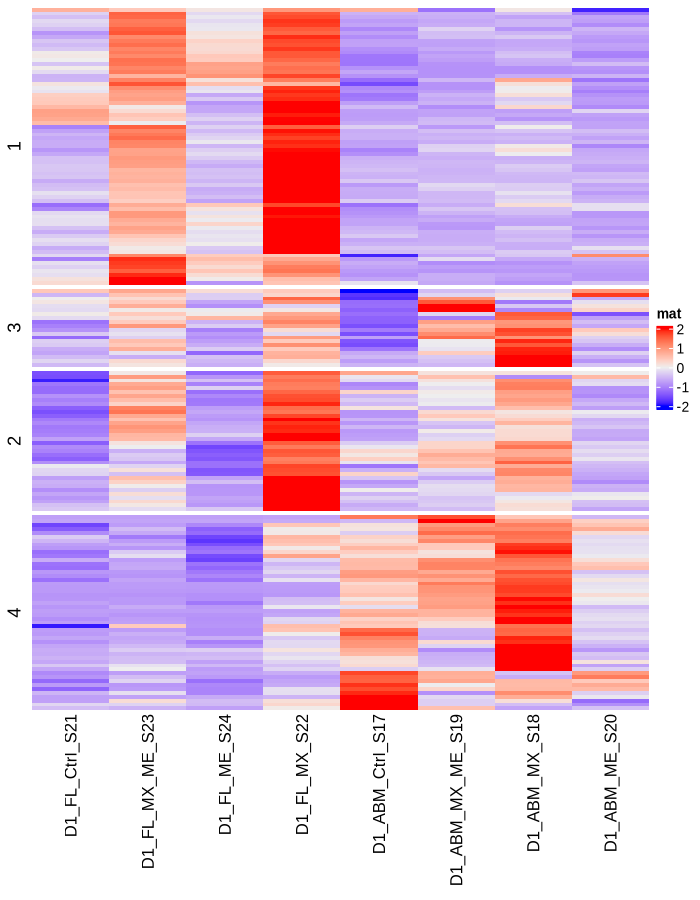

In [348]:
d1_deg = fread('data/DEgenes_D1_ABM_FL_ALL_Combined_Heatmap.csv')
d1_deg = setDF(d1_deg[, 2:ncol(d1_deg)], rownames = d1_deg$V1)
plotdat = t(scale(t(d1_deg[tmp, ])))
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
ht_d1_v2 = Heatmap(plotdat, name = "mat", show_row_dend = F, cluster_columns = F, cluster_rows = T, show_row_names = F, km = 4) 
ht_d1_v2 = draw(ht_d1_v2)


In [350]:
ro_ht_d1 = row_order(ht_d1)
tmp3 = rownames(plotdat)[ro_ht_d1[['2']]] 
length(tmp3)
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 300)
yy <- enrichGO(tmp3, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)


[1] 68

Warning message in rep(yes, length.out = len):
"'x' is NULL so the result will be NULL"
ERROR while rich displaying an object: Error in ans[ypos] <- rep(yes, length.out = len)[ypos]: replacement has length zero

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr

[1] 2925.5550 1889.8558 1372.4931 1152.6955 1043.3378  960.8403  891.5442
 [8]  834.4503  783.7975  736.0732  694.9495  656.7182  626.3643  599.8585
[15]  580.9702

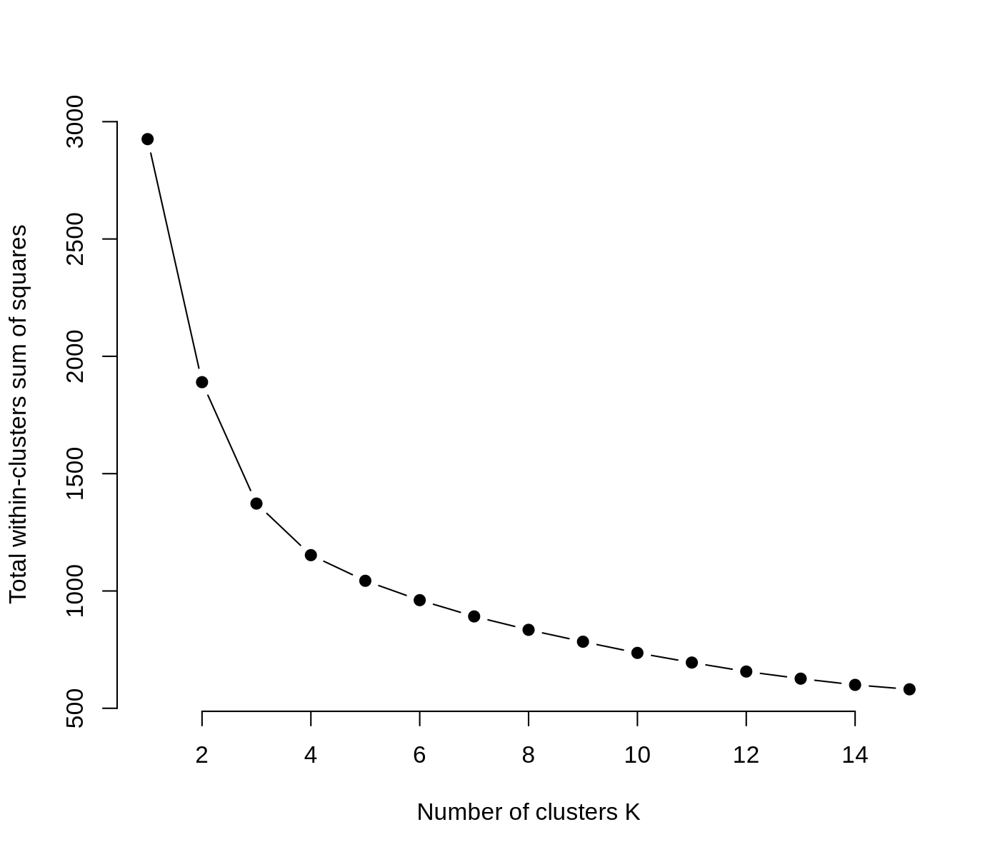

In [18]:
#Elbow Method for finding the optimal number of clusters
set.seed(123)
# Compute and plot wss for k = 2 to k = 15.
k.max <- 15
data = plotdat
wss <- sapply(1:k.max, 
              function(k){kmeans(data, k, nstart=50,iter.max = 15 )$tot.withinss})
wss
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
plot(1:k.max, wss, type="b", pch = 19, frame = FALSE, 
     xlab="Number of clusters K", ylab="Total within-clusters sum of squares")


In [19]:
d1_deg = fread('data/DEgenes_D1_ABM_FL_ALL_Combined_Heatmap.csv')
#gene_sel = unique(vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & day == 'd1', rn])
# & genotype == 'me'
3#keycol = c('group_cell_type', 'group_genotype', 'group_day', 'rep')

dsn_sel = dsn[group_day %in% c('D1'), .(group_cell_type, group_day, group_genotype, sampleName)]
keycol = c('group_cell_type', 'group_genotype', 'group_day')
dsn_sel = setorderv(dsn_sel, keycol)
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts)
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
ht_d1 = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = F, column_split = factor(col_split, levels = c('FL', 'ABM')), show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
ht_d1


[1] 3

ERROR: Error in x[j]: invalid subscript type 'list'


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


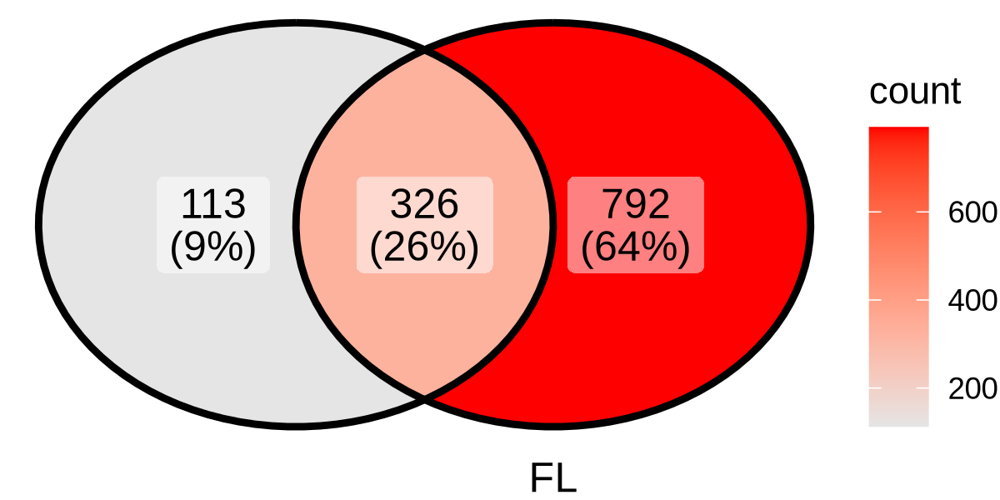

In [173]:
gene_sel = unique(vs_ctrl_dt[padj < 0.01 & abs(log2FoldChange) > 1 & day == 'd1', rn])
options(repr.plot.width = 4, repr.plot.height = 2, repr.plot.res = 300)
xx = list(d1_deg$V1, FL = gene_sel)
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red") + coord_flip()


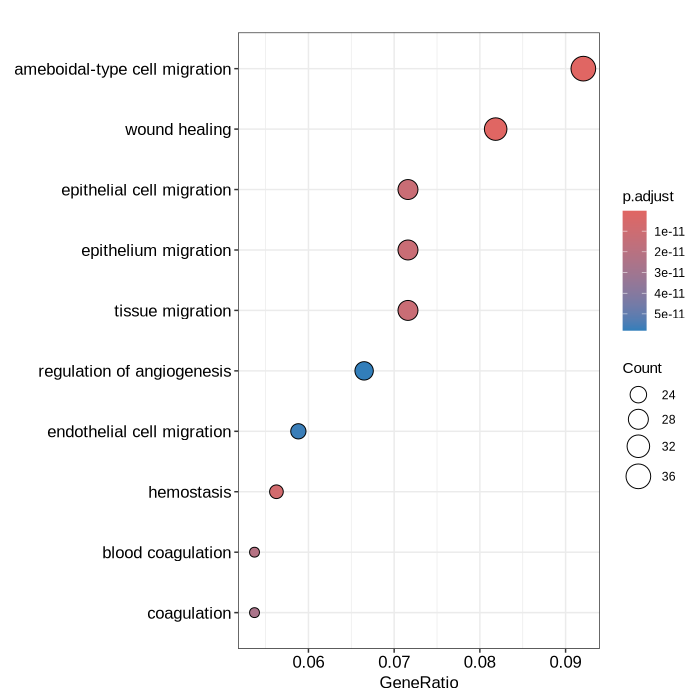

In [175]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 100)
yy <- enrichGO(d1_deg$V1, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)

In [11]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 100)
gene_sel = rownames(ht_d1@matrix)[ro_ht_d1[[5]]] 
write(gene_sel, file = 'data/gene_FL_day1.txt')
#david = enrichDAVID(gene = gene, idType="SYMBOL", annotation="KEGG_PATHWAY")
yy <- enrichGO(gene_sel, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)

ERROR: Error in eval(expr, envir, enclos): object 'ro_ht_d1' not found


[1] 52375933916 25651180118 16268386435 13308839662 10865801500  7898368781
 [7]  6288881554  5346001020  4706579078  4001124323  3722091552  3493184261
[13]  3316181556  3126631960  3029188211

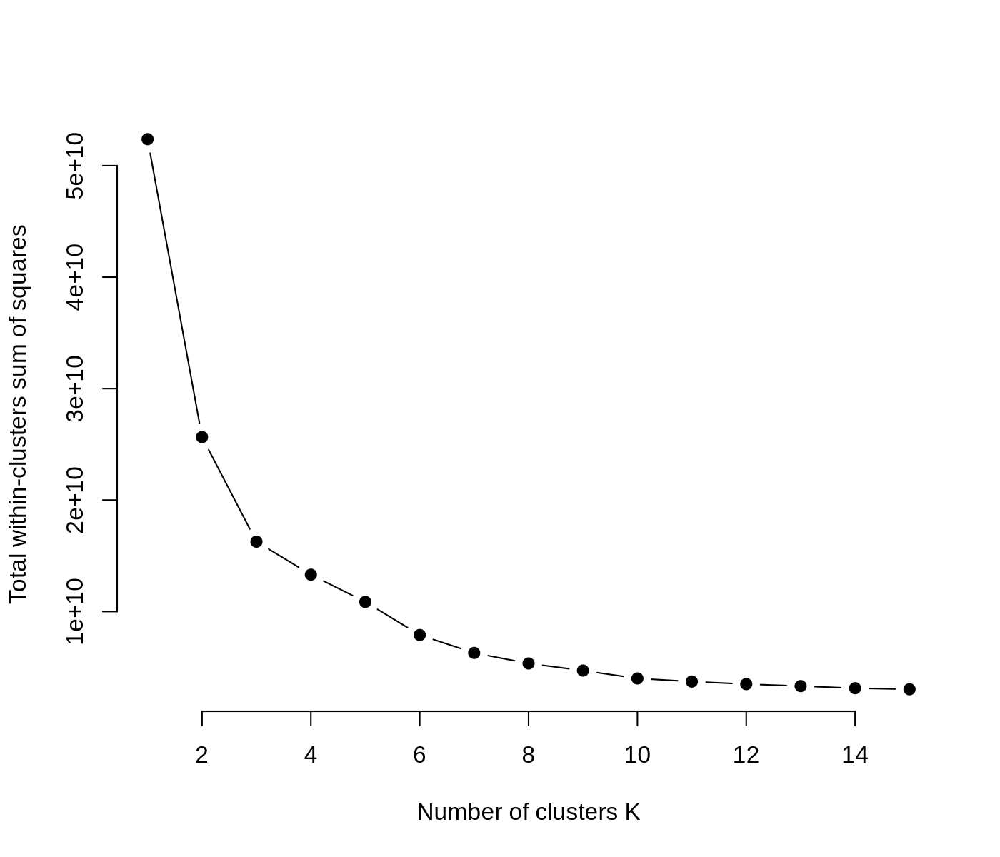

In [133]:
#Elbow Method for finding the optimal number of clusters
set.seed(123)
# Compute and plot wss for k = 2 to k = 15.
k.max <- 15
data <- mtx_norm_counts
wss <- sapply(1:k.max, 
              function(k){kmeans(data, k, nstart=50,iter.max = 15 )$tot.withinss})
wss
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
plot(1:k.max, wss, type="b", pch = 19, frame = FALSE, 
     xlab="Number of clusters K", ylab="Total within-clusters sum of squares")


## day 3, both cell types, all genotypes

In [125]:
head(vs_ctrl_dt)

.id,rn,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,day,cell_type,genotype
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
res_d1_FL_me_ctrl,0610005C13Rik,9.59956,1.50475835,0.84143923,1.7883150,0.07372521,0.3664920,d1,FL,me
res_d1_FL_me_ctrl,0610007P14Rik,376.75952,-0.20577531,0.18578074,-1.1076246,0.26802399,0.6663250,d1,FL,me
res_d1_FL_me_ctrl,0610009B22Rik,72.61005,0.12566146,0.34205861,0.3673682,0.71334439,0.9296093,d1,FL,me
res_d1_FL_me_ctrl,0610009L18Rik,25.25928,0.55278433,0.61719486,0.8956399,0.37044513,0.7533990,d1,FL,me
res_d1_FL_me_ctrl,0610009O20Rik,599.32294,-0.15580559,0.10350388,-1.5053116,0.13224399,0.4928538,d1,FL,me
res_d1_FL_me_ctrl,0610010F05Rik,993.26564,0.03853159,0.09458321,0.4073830,0.68372672,0.9172559,d1,FL,me


[1] 2515   16

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



$`3`
[1] 654

$`4`
[1] 395

$`1`
[1] 780

$`2`
[1] 686

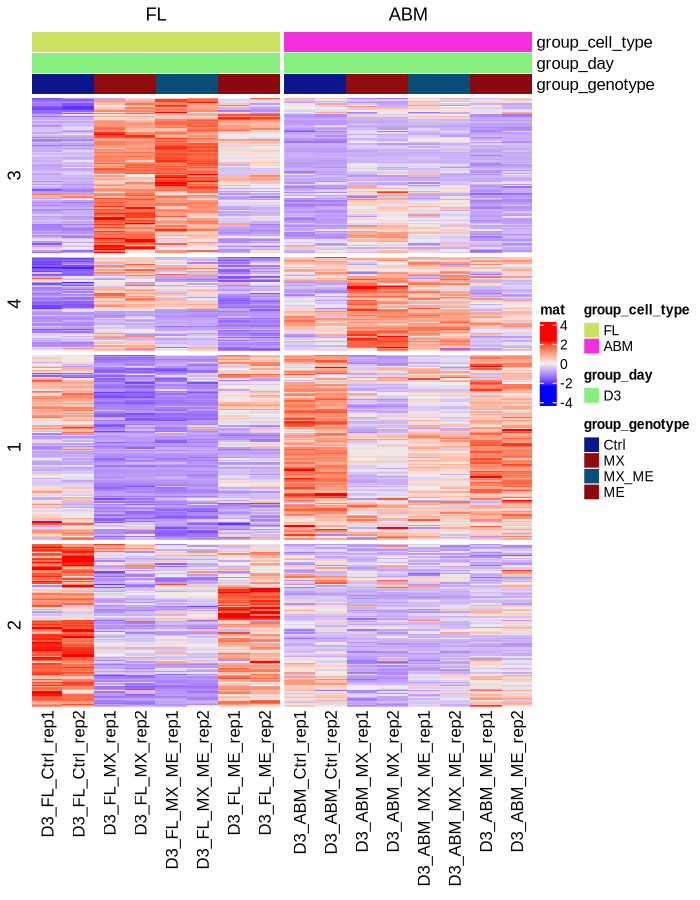

In [159]:
# how ME genes looks like in other samples 
gene_sel = unique(vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & day == 'd3' & cell_type == 'FL', rn])
# & genotype == 'me'
keycol = c('group_cell_type', 'group_genotype', 'group_day', 'rep')

dsn_sel = dsn[group_day %in% c('D3'), .(group_cell_type, group_day, group_genotype, sampleName)]
keycol = c('group_cell_type', 'group_genotype', 'group_day')
dsn_sel = setorderv(dsn_sel, keycol)
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts)
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 4] = 4
plotdat[plotdat < -4] = -4

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
ht_d3 = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = F, column_split = factor(col_split, levels = c('FL', 'ABM')), show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
ht_d3 = draw( ht_d3 )
ro_ht_d3 = row_order(ht_d3)
lapply(ro_ht_d3, length)
ht_d3


In [160]:
gene_sel_1 = rownames(plotdat)[ro_ht_d3[['1']]] 
gene_sel_2 = rownames(plotdat)[ro_ht_d3[['2']]] 
gene_sel_3 = rownames(plotdat)[ro_ht_d3[['3']]] 
gene_sel_4 = rownames(plotdat)[ro_ht_d3[['4']]] 
length(gene_sel)
head(gene_sel)


[1] 2515

[1] "1100001G20Rik" "1700015E13Rik" "1810011H11Rik" "2010005H15Rik"
[5] "2010300C02Rik" "2500004C02Rik"

In [164]:
gene_sel = gene_sel_1
length(gene_sel)


[1] 780

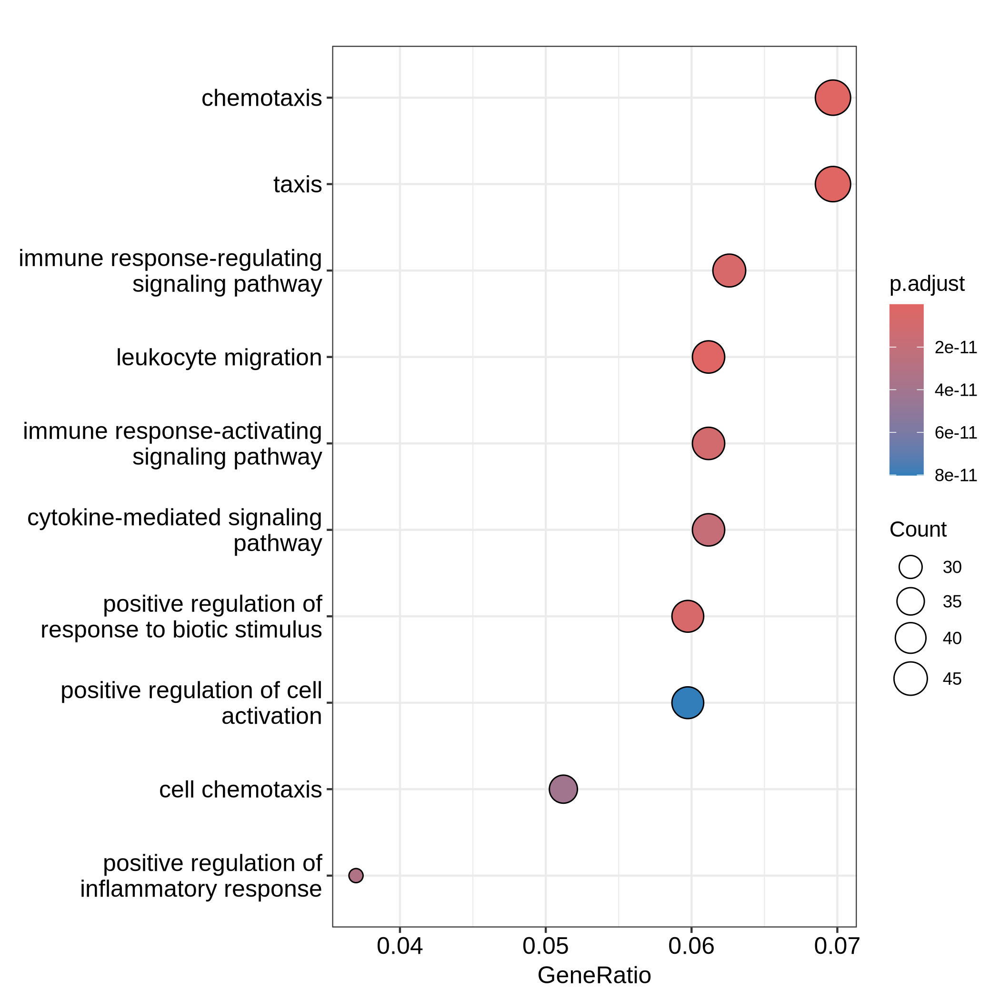

In [165]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 300)
yy <- enrichGO(gene_sel, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)


Path_class,Gene_NormRead_over10_n,Gene_in_Path_n,Significant_gene_n,Overlap_n,P_value,Percentage,padj,logPval
<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
hemoglobins chaperone,11569,9,589,8,3.709102e-10,0.88888889,1.647212e-06,9.430731
Heme biosynthesis,11569,11,589,8,6.206501e-09,0.72727273,2.755686e-05,8.207153
Metabolism of porphyrins,11569,18,589,9,6.959268e-08,0.50000000,3.089219e-04,7.157436
Metabolism,11569,1356,589,111,1.630632e-07,0.08185841,7.236746e-04,6.787644
Erythrocytes take up oxygen and release carbon dioxide,11569,5,589,5,3.365740e-07,1.00000000,1.493379e-03,6.472919
Cell surface interactions at the vascular wall,11569,108,589,20,4.330708e-07,0.18518519,1.921102e-03,6.363441


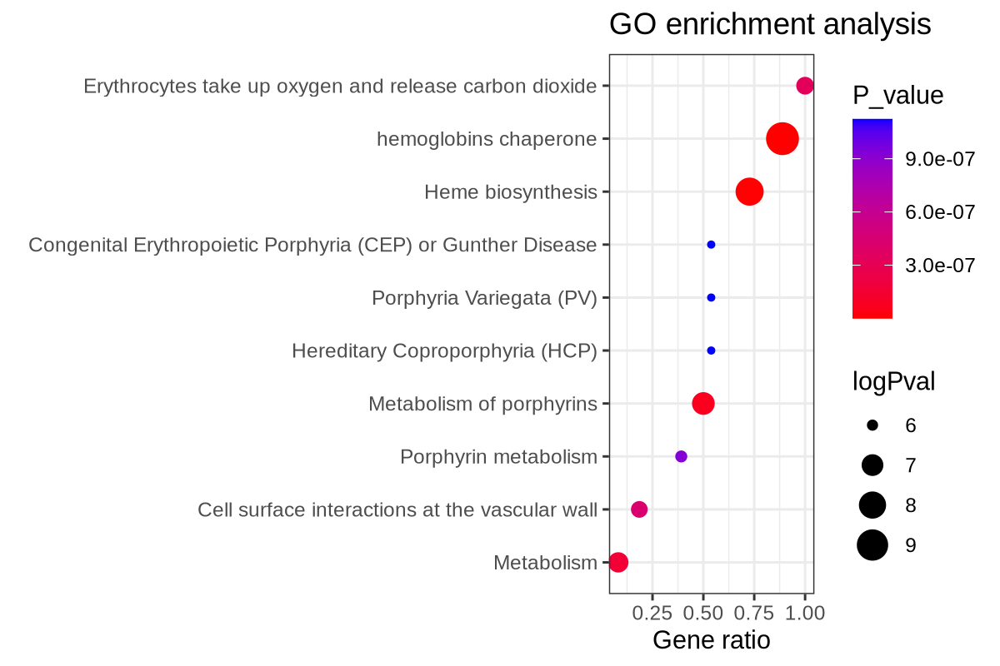

In [166]:
anno = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/RNA-seq/Erythroid_Metabolome/CPDB_gene2path.txt', header=T, sep="\t")
uni_path = unique(anno$path_id)
geneid = fread('~/workspace/mouse_to_human.csv')
setkey(geneid, `Gene name`)
gene_sel_hsa = geneid[`Gene name` %in% gene_sel_3, `Human gene name`]
sig_gene = gene_sel_hsa
sig_gene = sig_gene[!is.na(sig_gene)]
sig_gene = sig_gene[sig_gene != '']

gene_all_mmu = rownames(dds)
gene_all = geneid[`Gene name` %in% gene_all_mmu, `Human gene name`]
gene_all = gene_all[!is.na(gene_all)]
gene_all = gene_all[gene_all != '']

N = length(gene_all)
enrich_path = data.table(Path_class = uni_path)
k = NULL; n = NULL; M = NULL;
for (w in 1:nrow(enrich_path)){
    pathway_name = enrich_path[w, Path_class]
    gene_in_path = intersect(unique(anno[path_id == pathway_name, gene_id]), gene_all)
    M[w] = length(gene_in_path)
    gene_in_cluster = intersect(sig_gene, gene_all)
    n[w] = length(gene_in_cluster)
    k[w] = length(intersect(gene_in_path, gene_in_cluster))
}
p = 1-phyper(k-1, M, N-M, n)
ratio = k/M
enrich_path$Gene_NormRead_over10_n = N
enrich_path$Gene_in_Path_n = M
enrich_path$Significant_gene_n = n
enrich_path$Overlap_n = k
enrich_path$P_value = p
enrich_path$Percentage = ratio

enrich_path[, padj := p.adjust(P_value)] 
enrich_path[, logPval := -log(P_value, 10)]
enrich_path = enrich_path[order(P_value),]
head(enrich_path)

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
plotdat = enrich_path[1:10, ][order(Percentage), ]
plotdat[, Path_class := factor(Path_class, levels = plotdat$Path_class)] 
ggplot(data = plotdat, aes(y = Percentage, x = Path_class,  color = `P_value`, size = logPval)) +  geom_point() + coord_flip() +
scale_color_gradient(low = "red", high = "blue") + theme_bw() +  ylab("") +  xlab("") +  ggtitle("GO enrichment analysis") + ylab('Gene ratio')


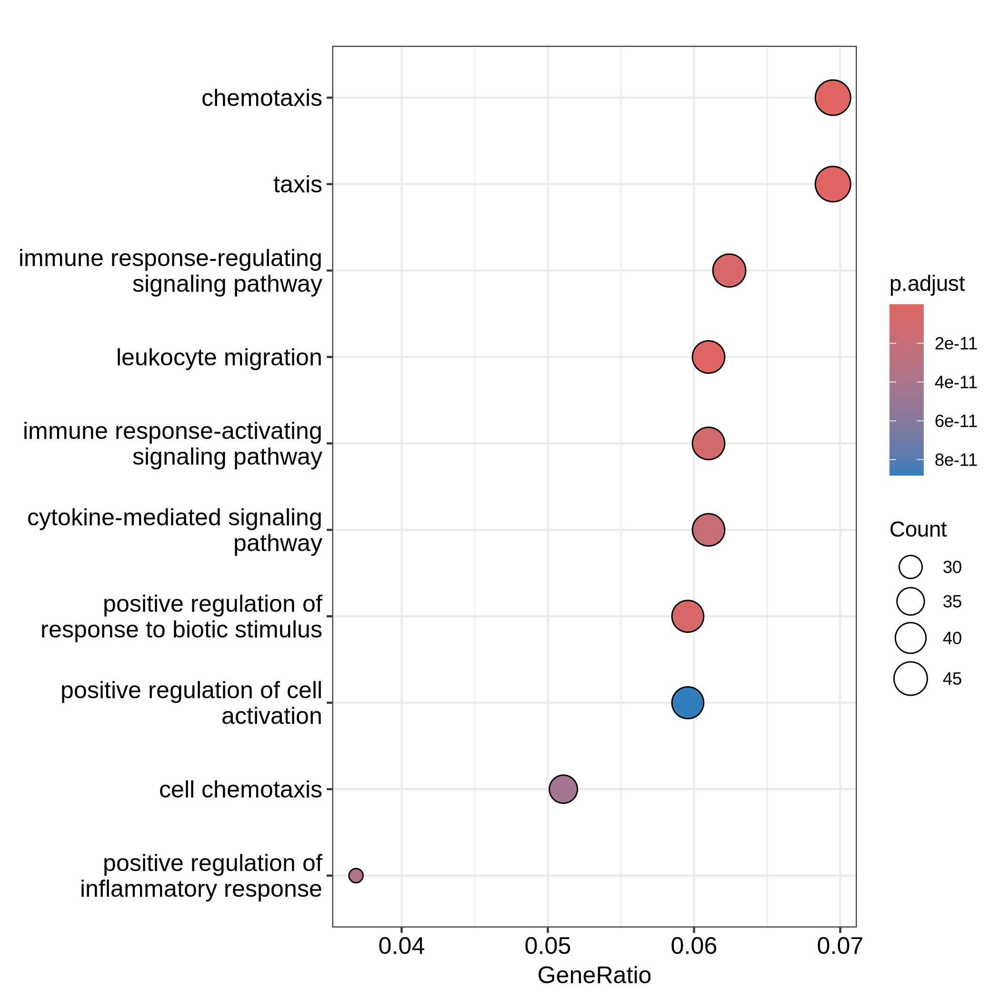

In [153]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 300)
yy <- enrichGO(gene_sel, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)


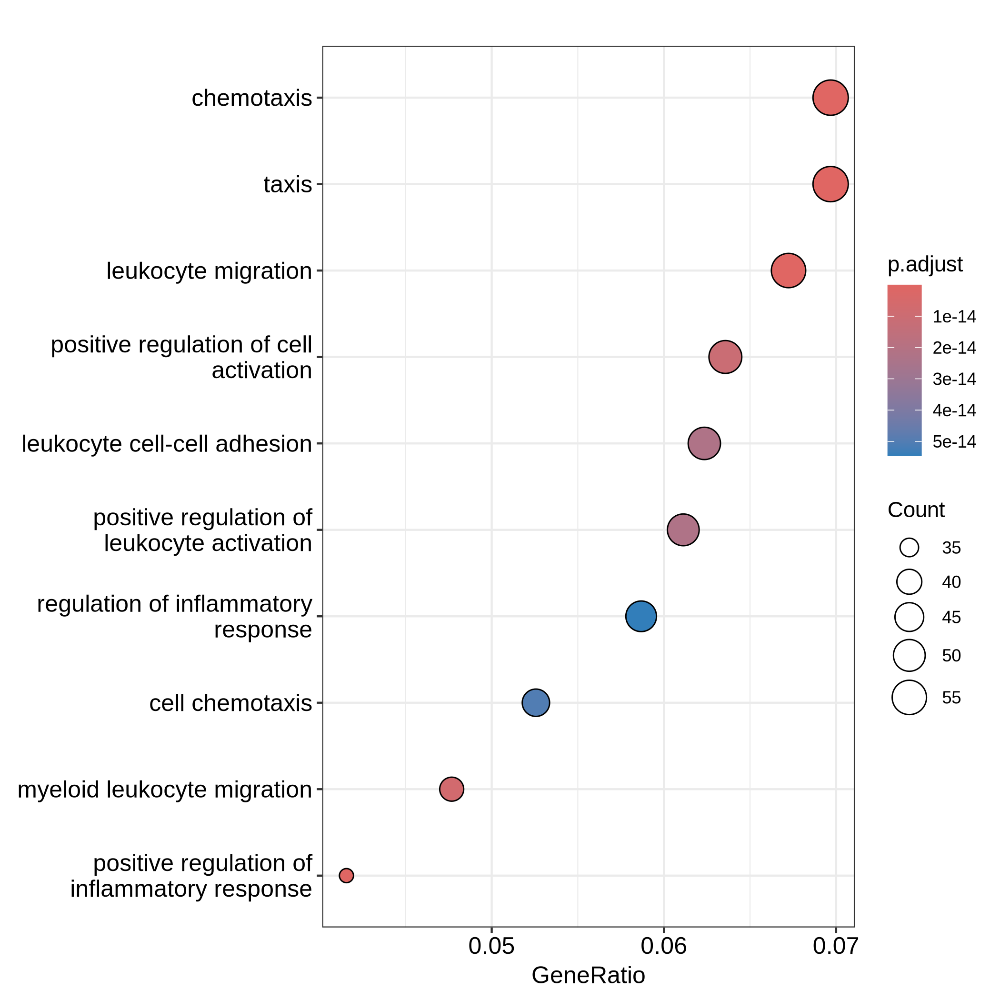

In [191]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 300)
gene_sel = rownames(ht_d3@matrix)[ro_ht_d3[[3]]] 
write(gene_sel, file = 'data/gene_FL_day3.txt')
#david = enrichDAVID(gene = gene, idType="SYMBOL", annotation="KEGG_PATHWAY")
yy <- enrichGO(gene_sel, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)

## day 8, both cell type, all genotype

[1] 1247   16

Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


$`1`
[1] 490

$`2`
[1] 352

$`3`
[1] 451

$`4`
[1] 631

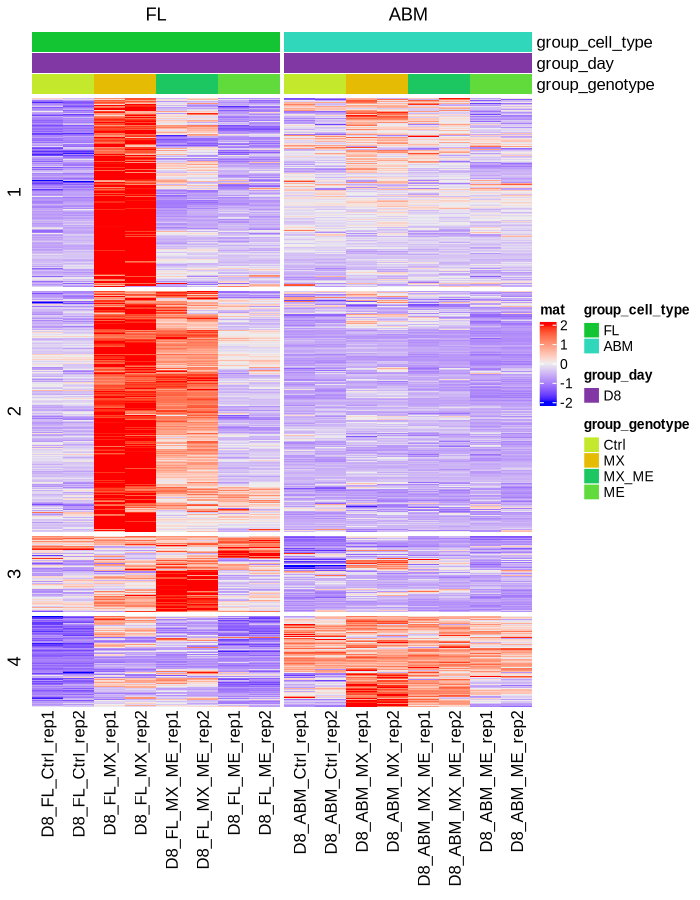

In [235]:
# how ME genes looks like in other samples 
gene_sel = unique(vs_ctrl_dt[padj < 0.05 & (log2FoldChange) > 1 & day == 'd8', rn])
# & genotype == 'me'
keycol = c('group_cell_type', 'group_genotype', 'group_day', 'rep')

dsn_sel = dsn[group_day %in% c('D8'), .(group_cell_type, group_day, group_genotype, sampleName)]
keycol = c('group_cell_type', 'group_genotype', 'group_day')
dsn_sel = setorderv(dsn_sel, keycol)
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts)
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
ht_d8 = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = F, column_split = factor(col_split, levels = c('FL', 'ABM')), show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
ro_ht_d8 = row_order(ht_d8)
lapply(ro, length)
ht_d8


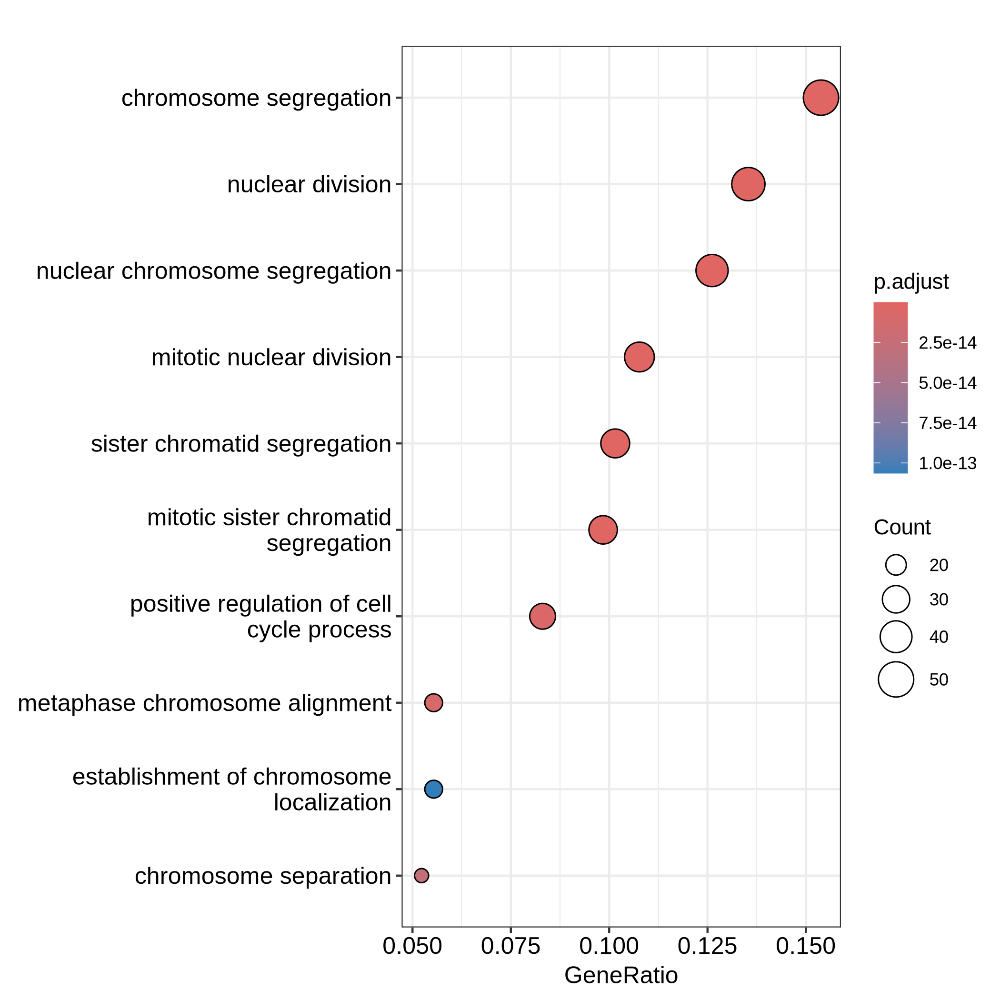

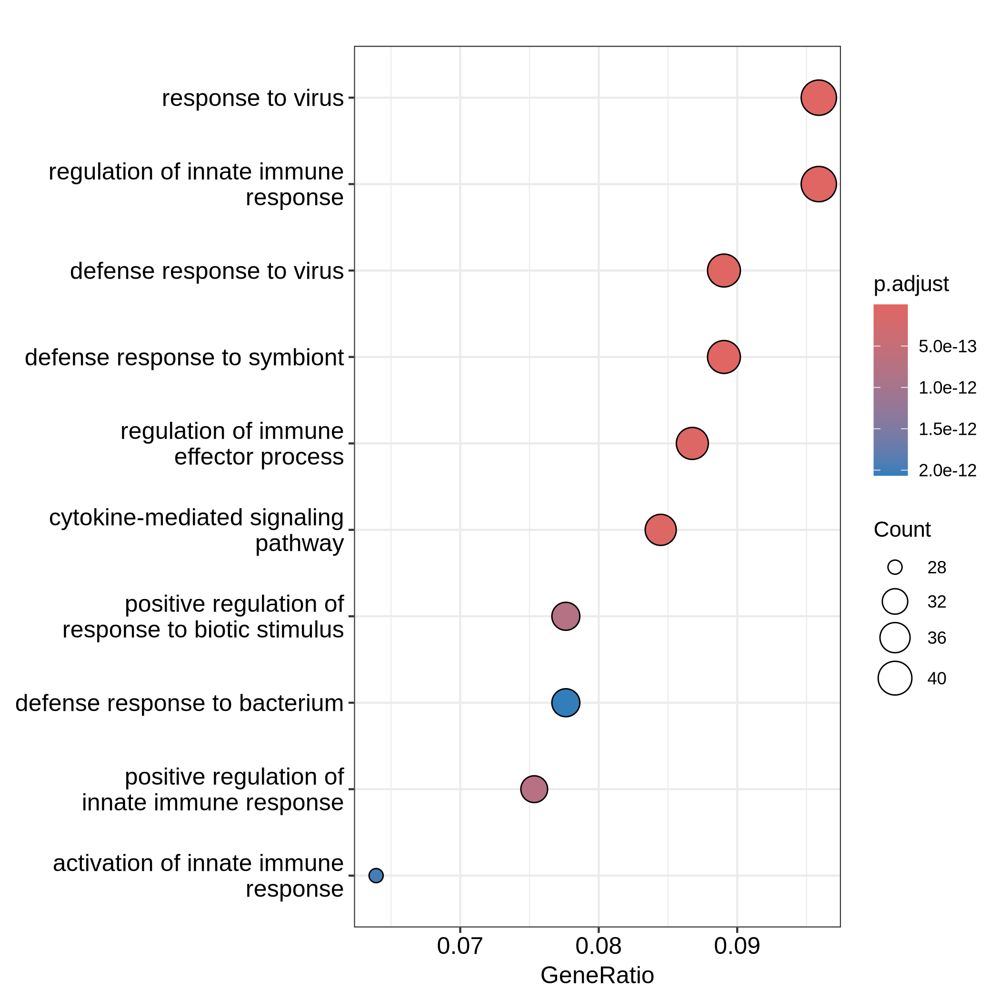

In [236]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 300)
gene_sel = rownames(ht_d8@matrix)[ro_ht_d8[[1]]] 
write(gene_sel, file = 'data/gene_FL_day8_cluster1.txt')
yy <- enrichGO(gene_sel, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)
gene_sel = rownames(ht_d8@matrix)[ro_ht_d8[[2]]] 
write(gene_sel, file = 'data/gene_FL_day8_cluster2.txt')
#david = enrichDAVID(gene = gene, idType="SYMBOL", annotation="KEGG_PATHWAY")
yy <- enrichGO(gene_sel, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)

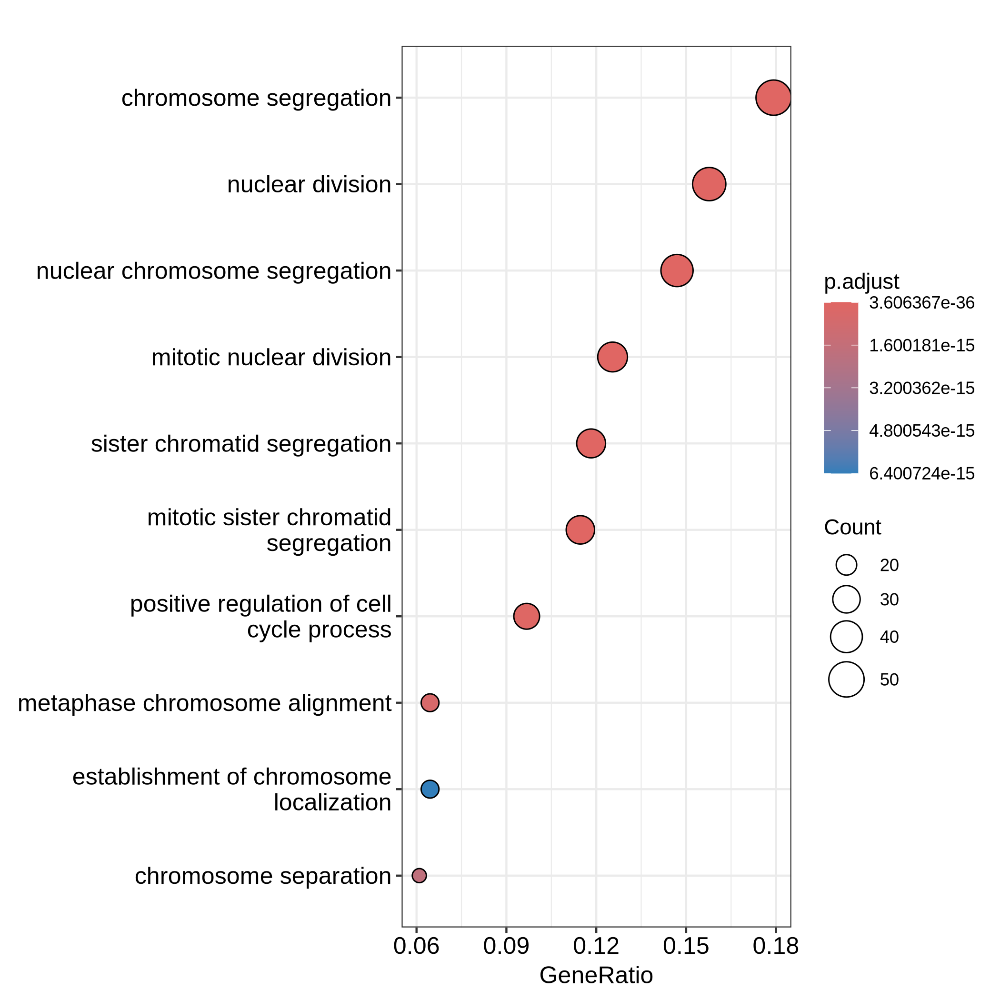

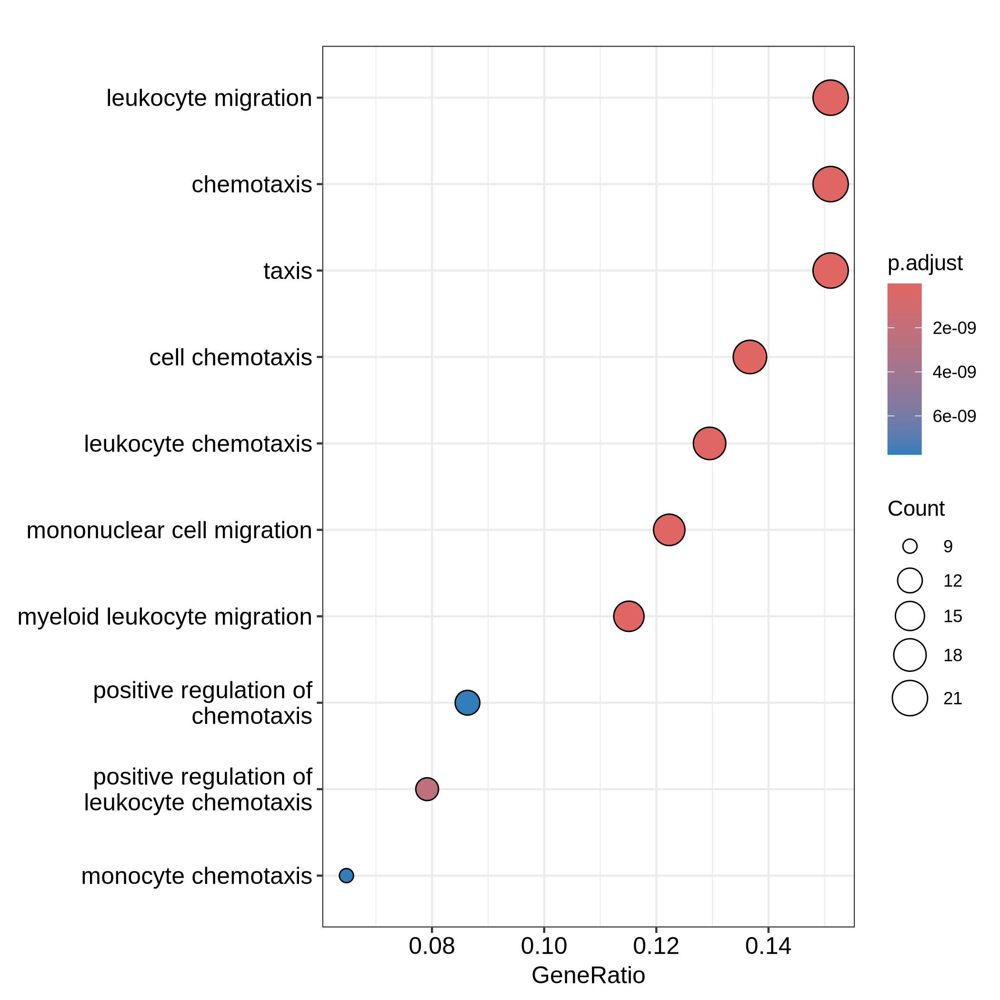

In [234]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 300)
gene_sel = rownames(ht_d8@matrix)[ro_ht_d8[[1]]] 
write(gene_sel, file = 'data/gene_FL_day8_cluster1.txt')
yy <- enrichGO(gene_sel, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)
gene_sel = rownames(ht_d8@matrix)[ro_ht_d8[[3]]] 
write(gene_sel, file = 'data/gene_FL_day8_cluster2.txt')
#david = enrichDAVID(gene = gene, idType="SYMBOL", annotation="KEGG_PATHWAY")
yy <- enrichGO(gene_sel, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)

In [ ]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 100)
gene_sel = rownames(ht_d8@matrix)[ro_ht_d8[[2]]] 
write(gene_sel, file = 'data/gene_FL_day8.txt')
#david = enrichDAVID(gene = gene, idType="SYMBOL", annotation="KEGG_PATHWAY")
yy <- enrichGO(gene_sel, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
dotplot(yy)

## overlapped gene across 3 times

In [143]:
head(ht_d1@matrix)

,D1_FL_Ctrl_rep1,D1_FL_Ctrl_rep2,D1_FL_MX_rep1,D1_FL_MX_rep2,D1_FL_MX_ME_rep1,D1_FL_MX_ME_rep2,D1_FL_ME_rep1,D1_FL_ME_rep2,D1_ABM_Ctrl_rep1,D1_ABM_Ctrl_rep2,D1_ABM_MX_rep1,D1_ABM_MX_rep2,D1_ABM_MX_ME_rep1,D1_ABM_MX_ME_rep2,D1_ABM_ME_rep1,D1_ABM_ME_rep2
2010015L04Rik,0.9886737,-0.27310611,-0.9237885,-0.3578264,-1.0964345,-0.5118122,-1.250213,-1.154619,1.0324429319,0.3810766,0.09825893,2.0000000,-0.3797948,0.2097109,0.484766241,0.1166497
2610307P16Rik,-0.5229639,0.06767862,-0.9512036,-1.0091058,-1.0933778,-0.4340851,-1.109745,-1.048846,1.4343994724,1.8683157,0.43636273,1.5598768,-0.1115329,0.8562128,0.315687553,-0.2576731
5031414D18Rik,-0.7725986,-0.86424531,-0.5583246,-0.6291596,-0.9304310,-0.9804437,-1.026993,-1.278752,0.4629168967,0.8243906,1.89740459,1.1462597,1.3682426,0.7124607,0.466394092,0.1628794
5430435G22Rik,-0.8727874,-0.96141634,-0.3384162,-0.6182514,-0.9254194,-0.9604518,-1.339748,-1.234105,1.3471834485,0.6320046,0.79938384,0.5551855,1.3068635,1.3927684,0.316816074,0.9003907
5830416P10Rik,-0.9084305,-0.71163063,-0.4801826,-0.4708955,-0.8541194,-0.7825498,-1.211676,-1.123335,0.5347901144,1.2219300,1.10668682,2.0000000,1.1122897,0.5227471,-0.002912232,-0.1019791
9930012K11Rik,-0.4660269,0.07231526,0.4196526,1.9778266,-0.3699332,0.3320421,-1.868316,-1.090506,-0.0007077204,-0.6261957,0.49276171,1.2936611,1.2721584,0.3931904,-0.956714629,-0.8752081


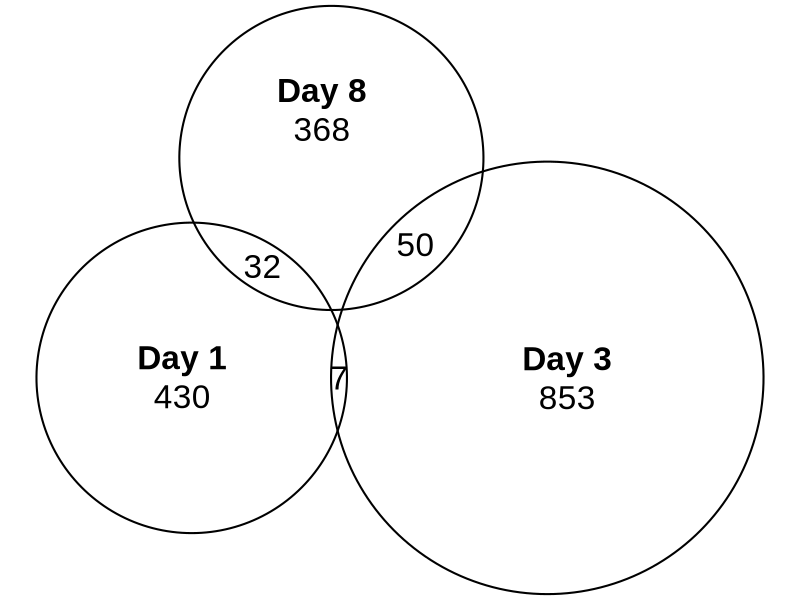

In [145]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
xx = list('Day 1' = rownames(ht_d1@matrix)[ro_ht_d1[[1]]] , 
          'Day 3' = rownames(ht_d3@matrix)[ro_ht_d3[[3]]] , 
          'Day 8' = rownames(ht_d8@matrix)[ro_ht_d8[[1]]] )
plot(euler(xx, shape = "circle"), quantities = TRUE,   fill = "transparent" )


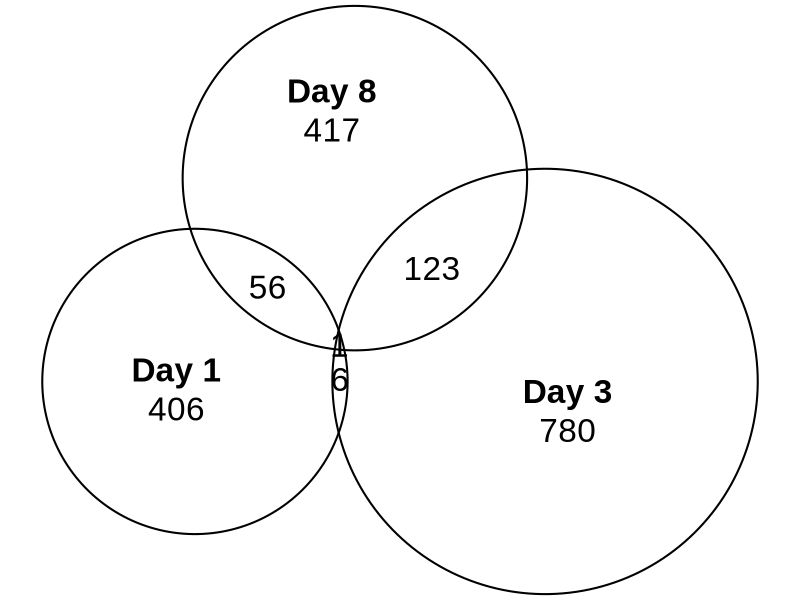

In [146]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
xx = list('Day 1' = rownames(ht_d1@matrix)[ro_ht_d1[[1]]] , 
          'Day 3' = rownames(ht_d3@matrix)[ro_ht_d3[[3]]] , 
          'Day 8' = rownames(ht_d8@matrix)[ro_ht_d8[[2]]] )
plot(euler(xx, shape = "circle"), quantities = TRUE,   fill = "transparent" )


## heatmap of more conidtions

[1] 3996   16

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



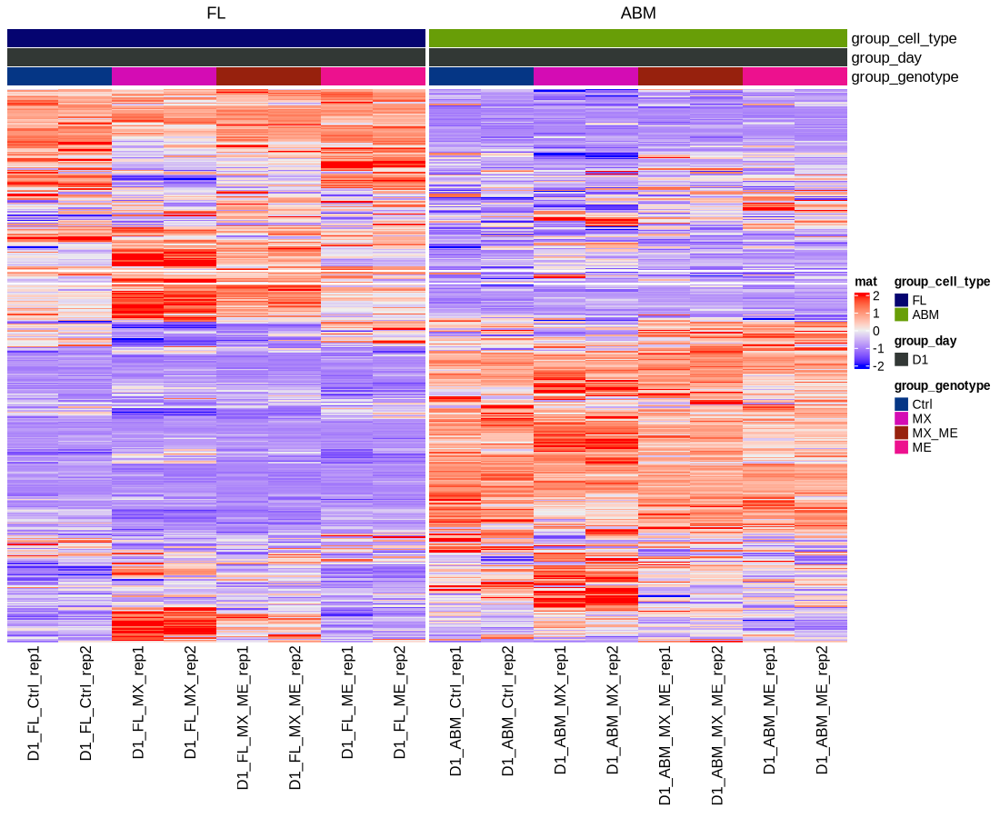

In [62]:
# how ME genes looks like in other samples 
gene_sel = unique(vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1, rn])
# & genotype == 'me'
keycol = c('group_cell_type', 'group_genotype', 'group_day', 'rep')

dsn_sel = dsn[group_day %in% c('D1'), .(group_cell_type, group_day, group_genotype, sampleName)]
keycol = c('group_cell_type', 'group_genotype', 'group_day')
dsn_sel = setorderv(dsn_sel, keycol)
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts)
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 11, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
tmp = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = F, column_split = factor(col_split, levels = c('FL', 'ABM')), show_row_dend = F, cluster_columns = F, cluster_rows = T)
tmp


[1] 3996   16

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



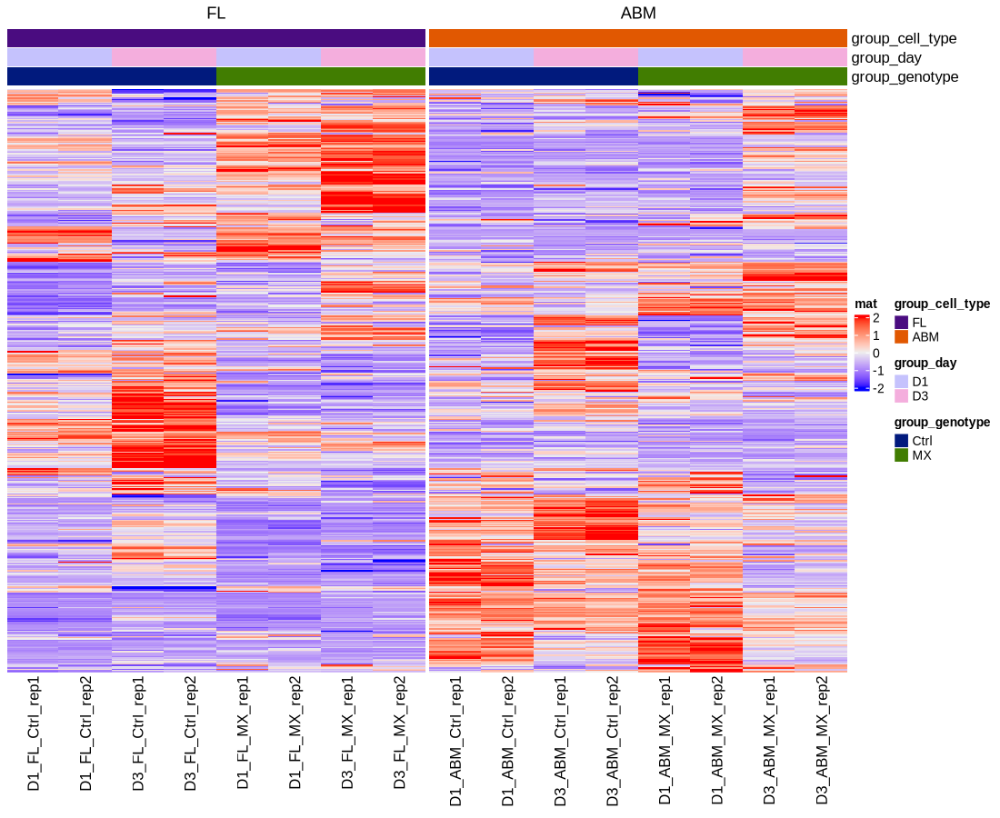

In [61]:
# how ME genes looks like in other samples 
gene_sel = unique(vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1, rn])
# & genotype == 'me'
dsn[, group_cell_type := factor(group_cell_type, levels = c('FL', 'ABM'))]
dsn[, group_genotype := factor(group_genotype, levels = c('Ctrl', 'MX', 'MX_ME', 'ME'))]
dsn[, group_day := factor(group_day, levels = c('D1', 'D3', 'D8'))]
dsn[, rep := factor(rep, levels = c('rep1', 'rep2'))]
keycol = c('group_cell_type', 'group_genotype', 'group_day', 'rep')

dsn_sel = dsn[group_day %in% c('D1', 'D3') & group_genotype %in% c('Ctrl', 'MX'), .(group_cell_type, group_day, group_genotype, sampleName)]
keycol = c('group_cell_type', 'group_genotype', 'group_day')
dsn_sel = setorderv(dsn_sel, keycol)
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts)
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 11, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
tmp = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = F, column_split = factor(col_split, levels = c('FL', 'ABM')), show_row_dend = F, cluster_columns = F, cluster_rows = T)
tmp


In [24]:
table(dsn$group_genotype)


Ctrl   MX MXME   ME 
  12   12    0   12 

In [45]:
head(vs_ctrl_dt)

.id,rn,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,day,cell_type,genotype
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
res_d1_FL_me_ctrl,0610005C13Rik,9.59956,1.50475835,0.84143923,1.7883150,0.07372521,0.3664920,d1,FL,me
res_d1_FL_me_ctrl,0610007P14Rik,376.75952,-0.20577531,0.18578074,-1.1076246,0.26802399,0.6663250,d1,FL,me
res_d1_FL_me_ctrl,0610009B22Rik,72.61005,0.12566146,0.34205861,0.3673682,0.71334439,0.9296093,d1,FL,me
res_d1_FL_me_ctrl,0610009L18Rik,25.25928,0.55278433,0.61719486,0.8956399,0.37044513,0.7533990,d1,FL,me
res_d1_FL_me_ctrl,0610009O20Rik,599.32294,-0.15580559,0.10350388,-1.5053116,0.13224399,0.4928538,d1,FL,me
res_d1_FL_me_ctrl,0610010F05Rik,993.26564,0.03853159,0.09458321,0.4073830,0.68372672,0.9172559,d1,FL,me


[1] 3371   32

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



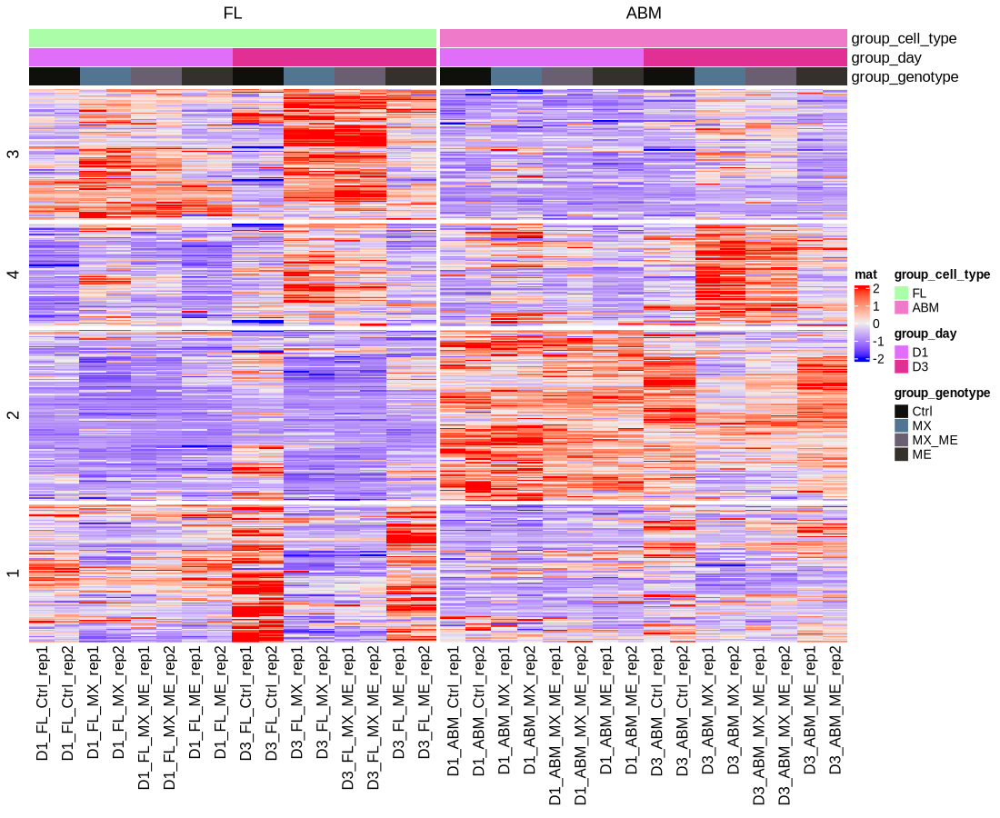

In [47]:
# how ME genes looks like in other samples 
gene_sel = unique(vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & day %in% c('d1', 'd3'), rn])
# & genotype == 'me'
keycol = c('group_cell_type', 'group_day', 'group_genotype', 'rep')

dsn_sel = dsn[group_day %in% c('D1', 'D3'), .(group_cell_type, group_day, group_genotype, sampleName)]
keycol = c('group_cell_type', 'group_day',  'group_genotype')
dsn_sel = setorderv(dsn_sel, keycol)

dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 11, repr.plot.height = 9, repr.plot.res = 100)
col_split = factor(paste0(dsn_sel$group_cell_type), levels = c('FL', 'ABM'))
tmp = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
tmp


Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


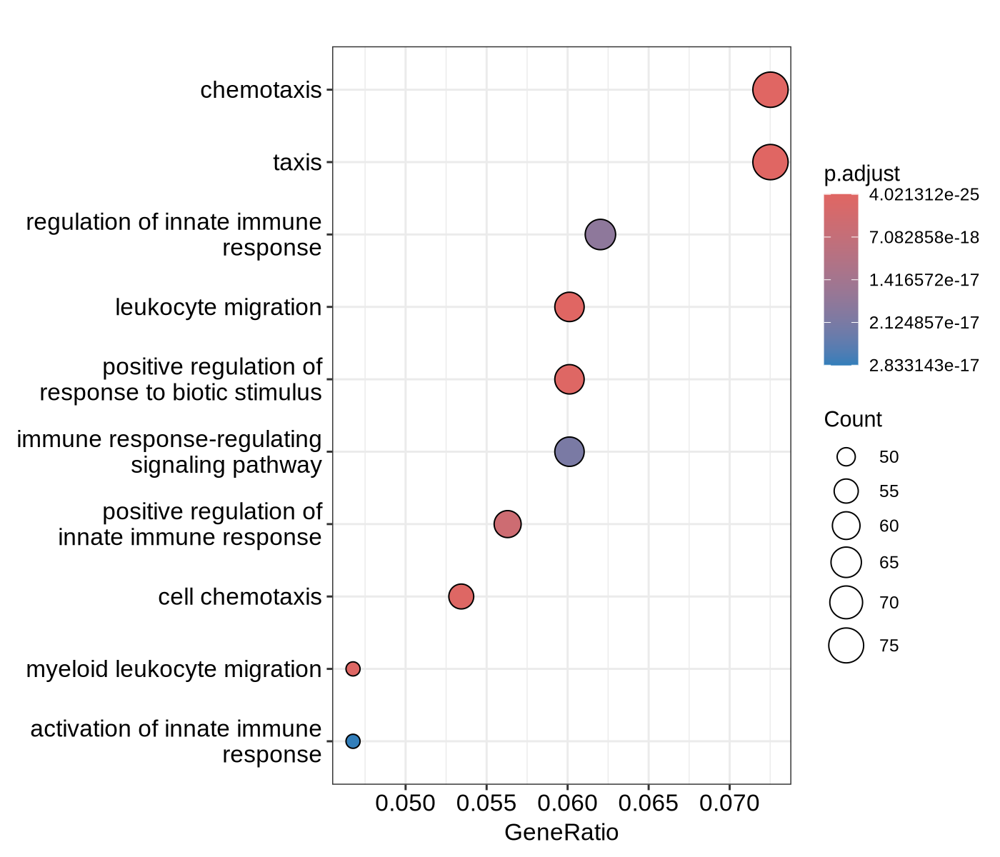

In [79]:
ro = row_order(tmp)
genes = unique(c(rownames(plotdat)[ro[['3']]], rownames(plotdat)[ro[['1']]]))
yy <- enrichGO(genes, 'org.Mm.eg.db', ont="ALL", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)


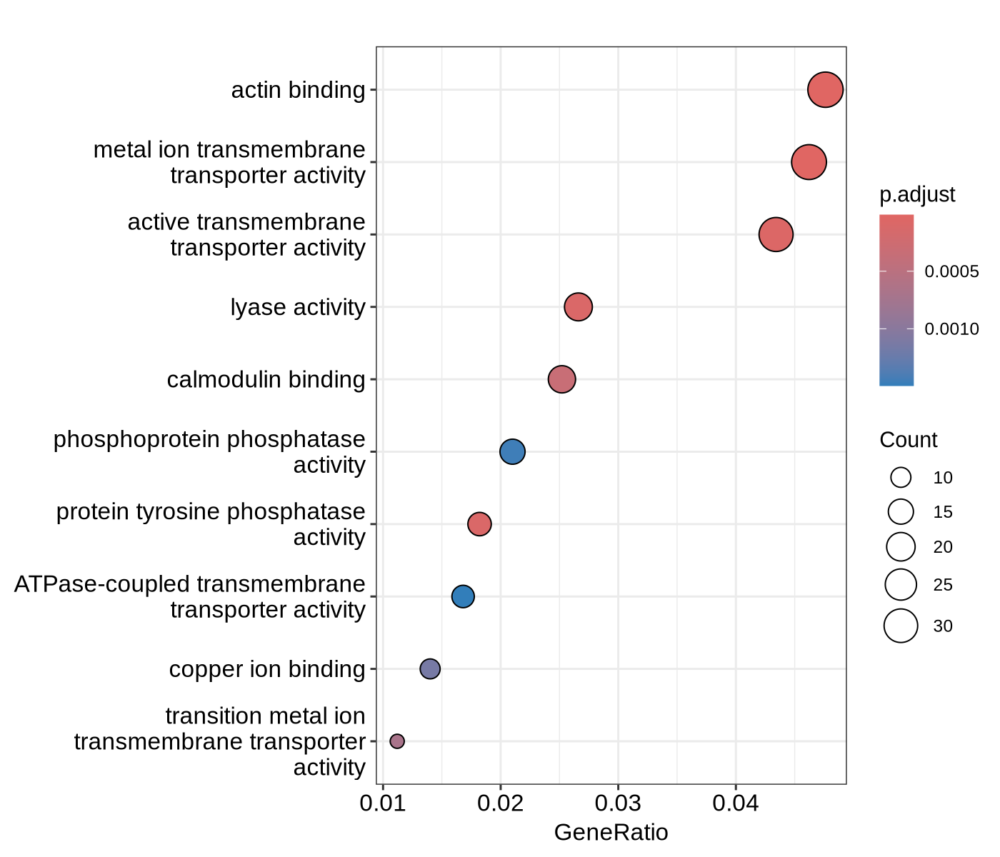

In [54]:
yy <- enrichGO(genes, 'org.Mm.eg.db', ont="MF", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)


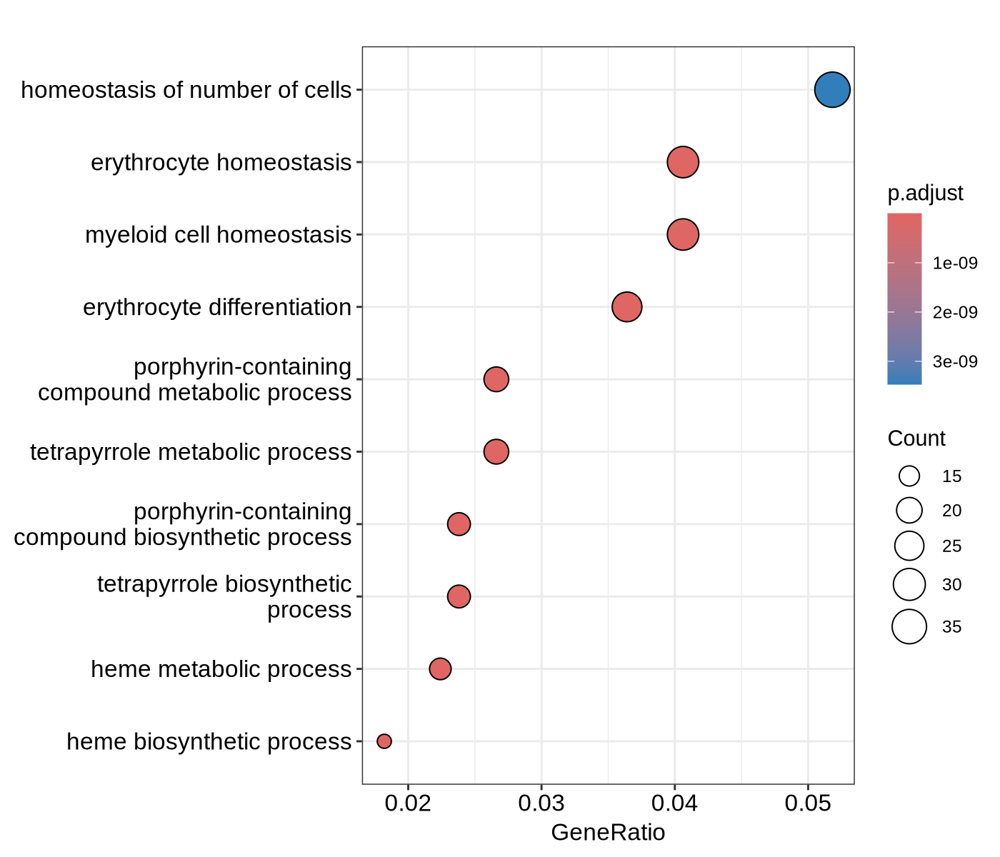

In [53]:
yy <- enrichGO(genes, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)


In [ ]:
gene_sel_abm = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM' & genotype == 'mx', rn]
gene_sel_fl  = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'FL' & genotype == 'mx', rn]

yy <- enrichGO(gene_sel_abm, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)

yy <- enrichGO(gene_sel_fl, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)
# One of "MF", "BP", and "CC" subontologies.


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


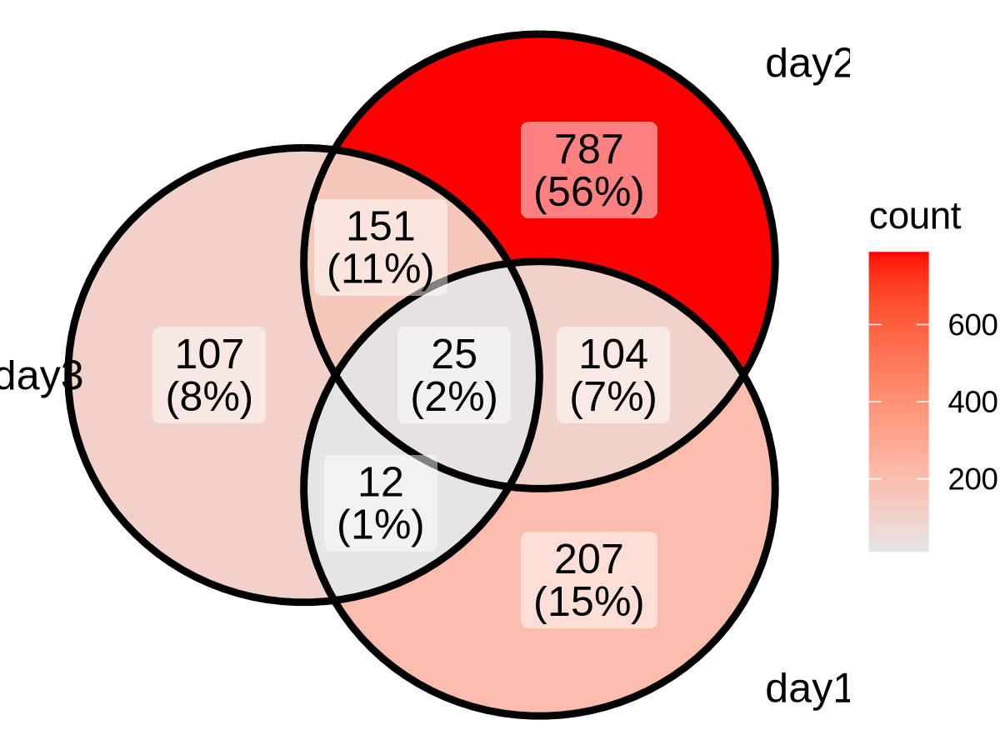

In [122]:
x1 = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM' & genotype == 'mx' & day == 'd1', rn]
x2 = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM' & genotype == 'mx' & day == 'd3', rn]
x3 = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM' & genotype == 'mx' & day == 'd8', rn]
xx = list(day1 = x1, day2 = x2, day3 = x3)
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red") + coord_flip()


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


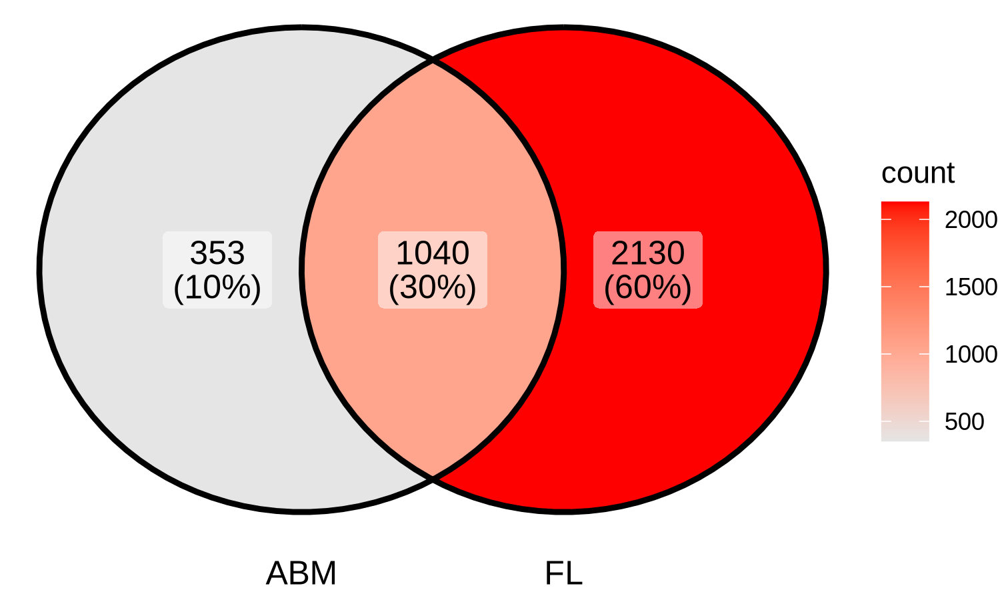

In [56]:
gene_sel_abm = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM' & genotype == 'mx', rn]
gene_sel_fl  = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'FL' & genotype == 'mx', rn]
xx = list(ABM= gene_sel_abm, FL = gene_sel_fl)
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red") + coord_flip()



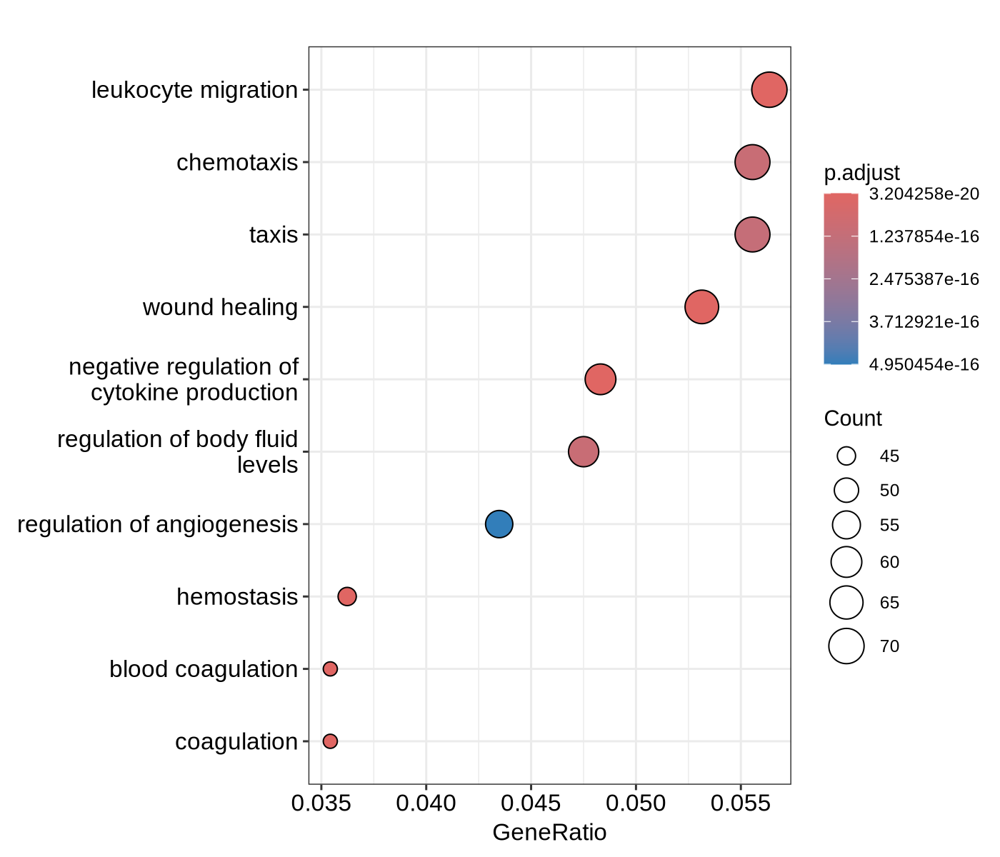

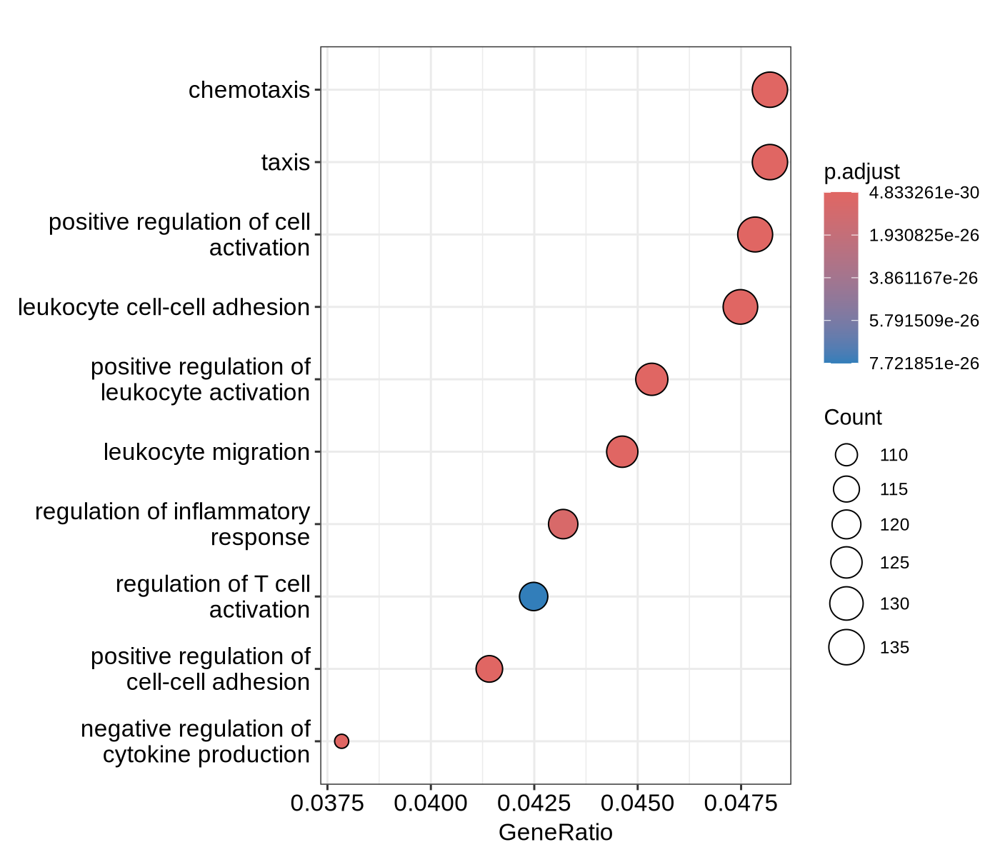

In [66]:
gene_sel_abm = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM' & genotype == 'mx', rn]
gene_sel_fl  = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'FL' & genotype == 'mx', rn]

yy <- enrichGO(gene_sel_abm, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)

yy <- enrichGO(gene_sel_fl, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)
# One of "MF", "BP", and "CC" subontologies.


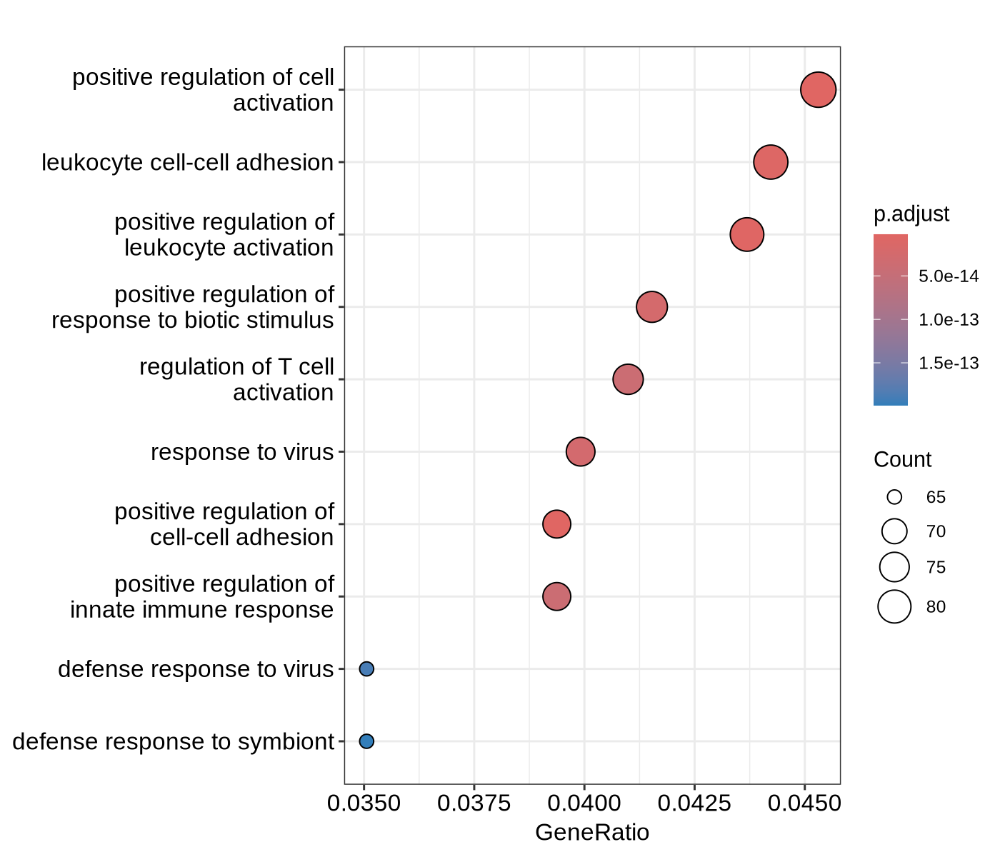

In [58]:
gene_sel_abm = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM' & genotype == 'mx', rn]
gene_sel_fl  = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'FL' & genotype == 'mx', rn]

tmp = setdiff(gene_sel_fl, gene_sel_abm)
yy <- enrichGO(tmp, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)


[1] 2312   48

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



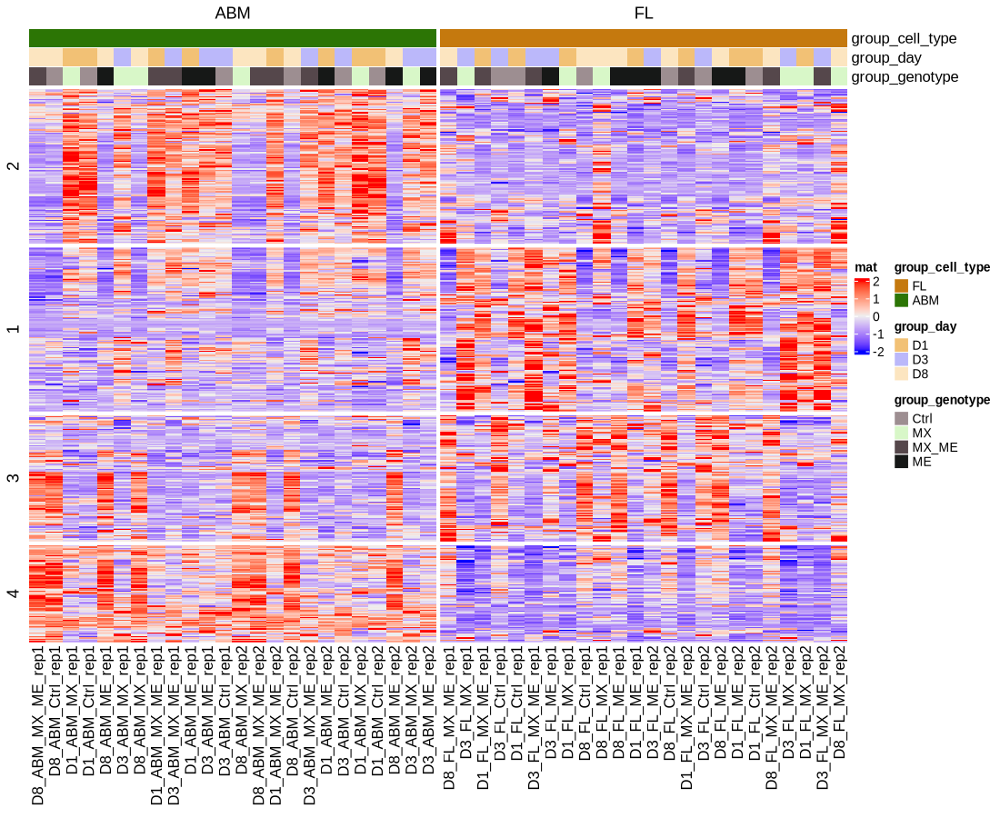

In [59]:
gene_sel_abm = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM', rn]
gene_sel_fl  = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'FL', rn]
gene_sel = setdiff(gene_sel_fl, gene_sel_abm)
# & genotype == 'me'

dsn_sel = dsn[, .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 11, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
tmp = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
tmp


[1] 2312   24

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



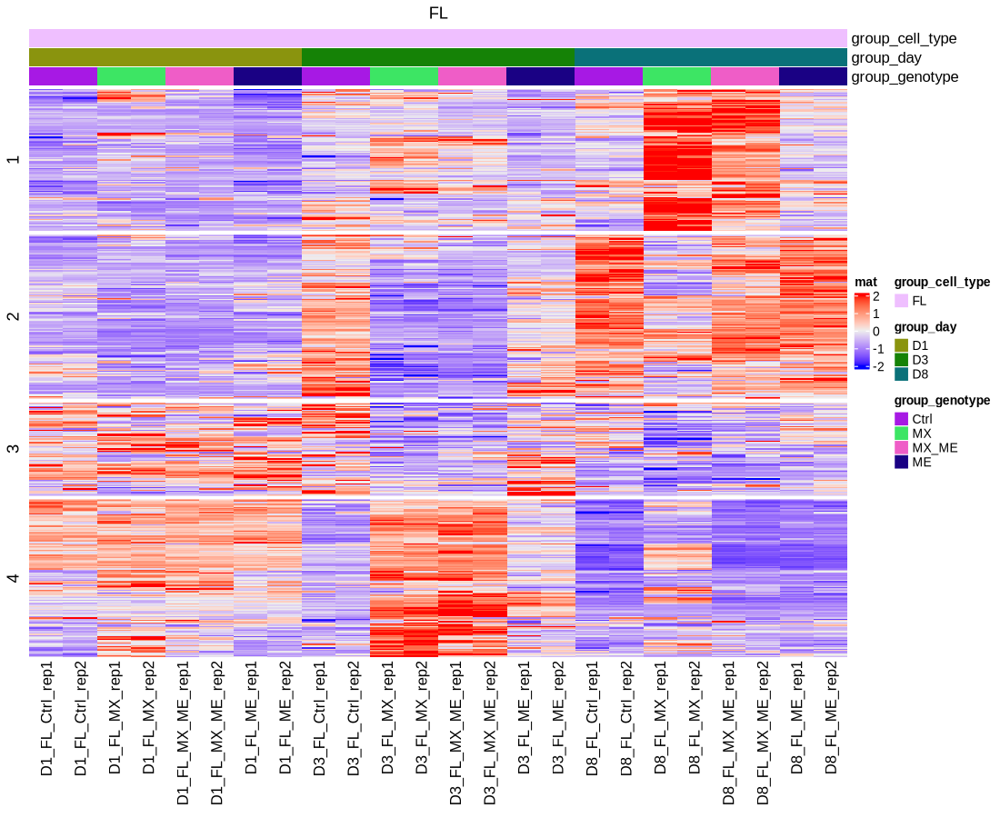

In [82]:
gene_sel_abm = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM', rn]
gene_sel_fl  = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'FL', rn]
gene_sel = unique(gene_sel_fl)
gene_sel = setdiff(gene_sel_fl, gene_sel_abm)
# & genotype == 'me'

dsn_sel = dsn[group_cell_type == 'FL', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
keycol = c('group_cell_type', 'group_day',  'group_genotype')
dsn_sel = setorderv(dsn_sel, keycol)

column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 11, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
tmp = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
tmp


Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


[1] 1924

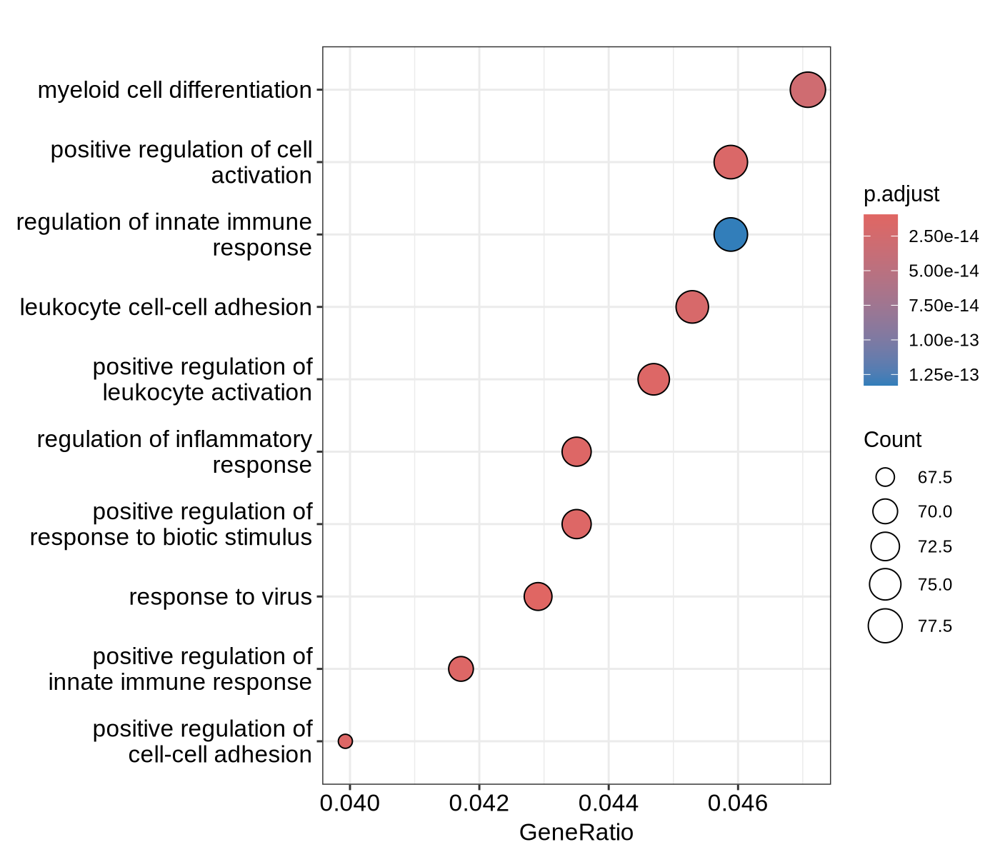

In [83]:
ro = row_order(tmp)
ri = unlist(ro[c('1', '2', '4')])
genes = unique(rownames(plotdat)[ri])
length(genes)
yy <- enrichGO(genes, 'org.Mm.eg.db', ont="ALL", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)


[1] 1924   24

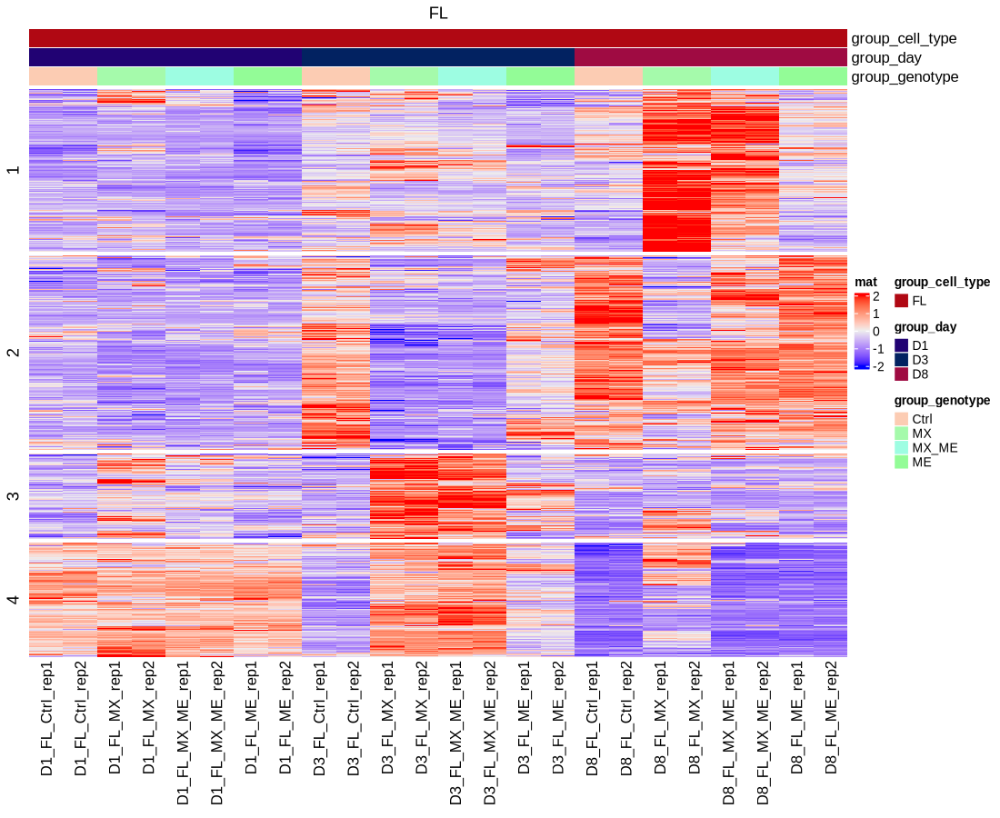

In [84]:
gene_sel = genes
dsn_sel = dsn[group_cell_type == 'FL', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
keycol = c('group_cell_type', 'group_day',  'group_genotype')
dsn_sel = setorderv(dsn_sel, keycol)

column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 11, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
tmp = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
tmp


Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


[1] 451

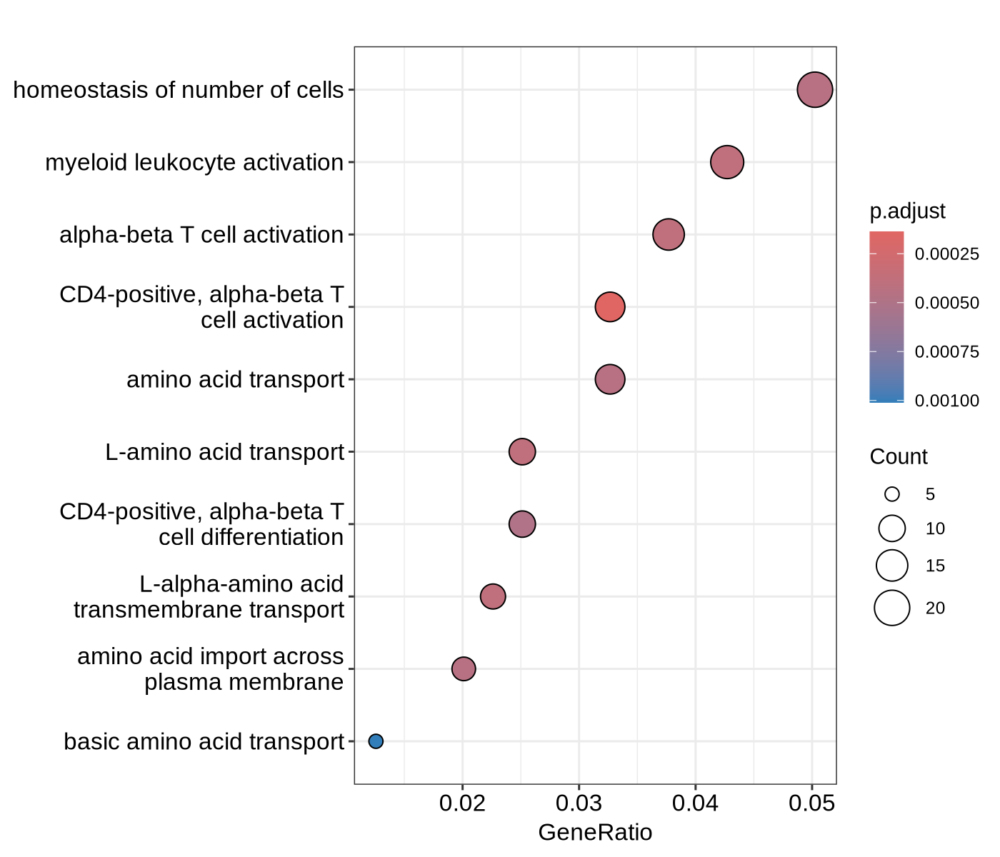

In [87]:
ro = row_order(tmp)
ri = unlist(ro[c('3')])
genes = unique(rownames(plotdat)[ri])
length(genes)
yy <- enrichGO(genes, 'org.Mm.eg.db', ont="ALL", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)


Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


[1] 1949

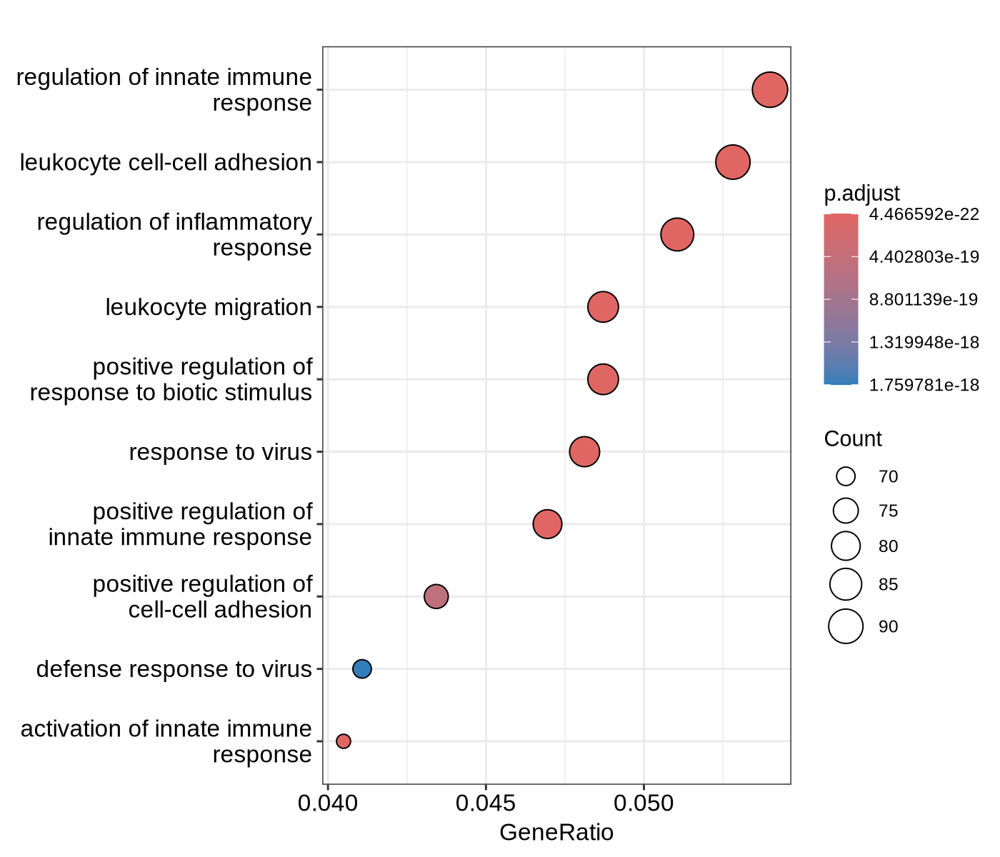

In [77]:
ro = row_order(tmp)
genes = unique(c(rownames(plotdat)[ro[['1']]], rownames(plotdat)[ro[['4']]]))
length(genes)
yy <- enrichGO(genes, 'org.Mm.eg.db', ont="ALL", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)


[1] 2312   24

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



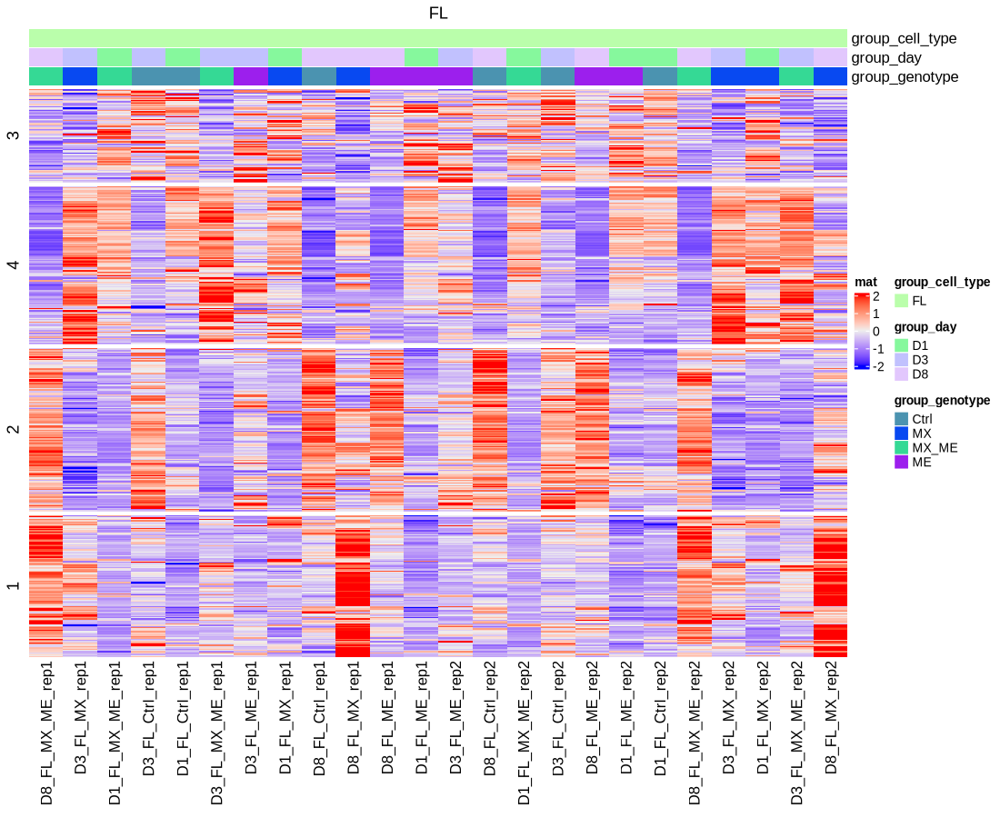

In [60]:
gene_sel_abm = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'ABM', rn]
gene_sel_fl  = vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1 & cell_type == 'FL', rn]
gene_sel = setdiff(gene_sel_fl, gene_sel_abm)
# & genotype == 'me'

dsn_sel = dsn[group_cell_type == 'FL', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 11, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
tmp = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
tmp


[1] 73437.78 51659.90 43353.65 38325.59 35635.12 34080.93 32683.56 31398.87
 [9] 30448.77 29626.76 28898.51 28281.03 27651.44 27142.08 26627.90

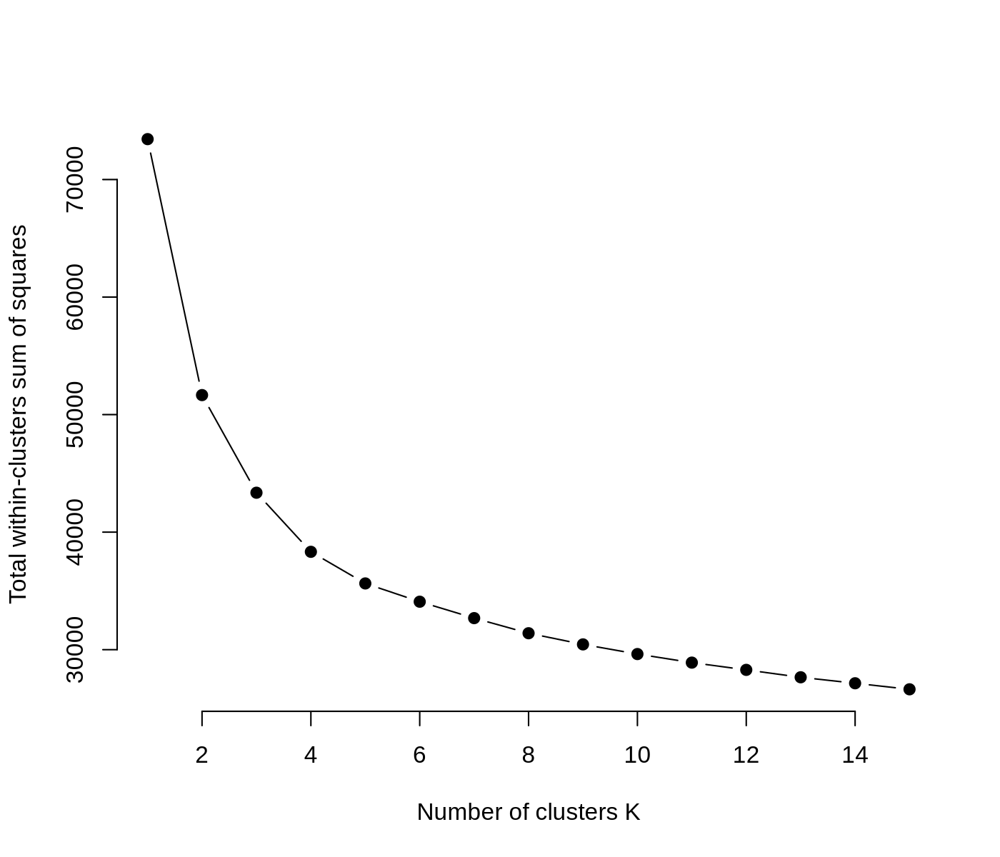

In [72]:
#Elbow Method for finding the optimal number of clusters
set.seed(123)
# Compute and plot wss for k = 2 to k = 15.
k.max <- 15
data <- mtx_norm_counts
data = plotdat
wss <- sapply(1:k.max, 
              function(k){kmeans(data, k, nstart=50,iter.max = 15 )$tot.withinss})
wss
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
plot(1:k.max, wss, type="b", pch = 19, frame = FALSE, 
     xlab="Number of clusters K", ylab="Total within-clusters sum of squares")


In [62]:
row_cluster = enframe(row_order(tmp)) %>% unnest
row_cluster$symbol = rownames(plotdat)[row_cluster$value]
row_cluster = as.data.table(row_cluster)
head(row_cluster)


Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."
Warning message:
"`cols` is now required when using `unnest()`.
ℹ Please use `cols = c(value)`."


name,value,symbol
<chr>,<int>,<chr>
3,1270,Ppic
3,1302,Rcbtb1
3,893,Cmtm3
3,1122,Lekr1
3,1309,Rom1
3,1332,Shc4


[1] 1245

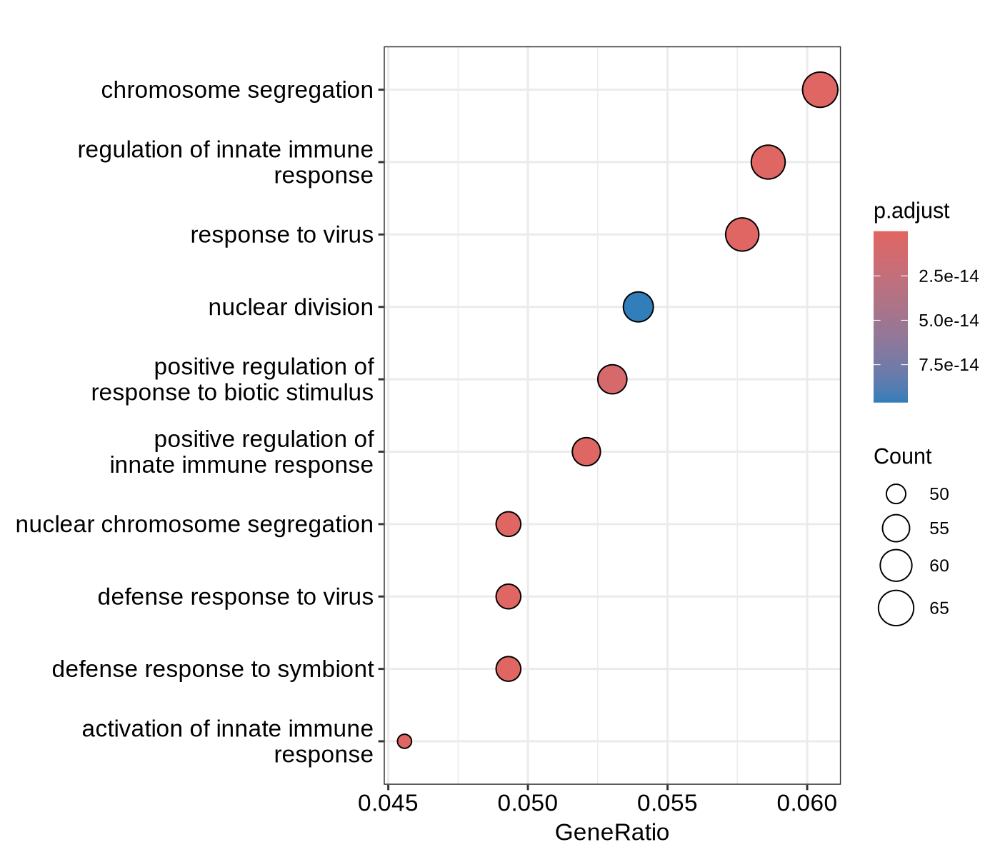

In [63]:
#xx = intersect(d1_up, intersect(d8_up, d3_up))
#ov = intersect(xx$FL, xx$ABM)
xx = row_cluster[name %in% c('1', '4'), symbol]
length(xx)
yy <- enrichGO(xx, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)

# One of "MF", "BP", and "CC" subontologies.


[1] 679

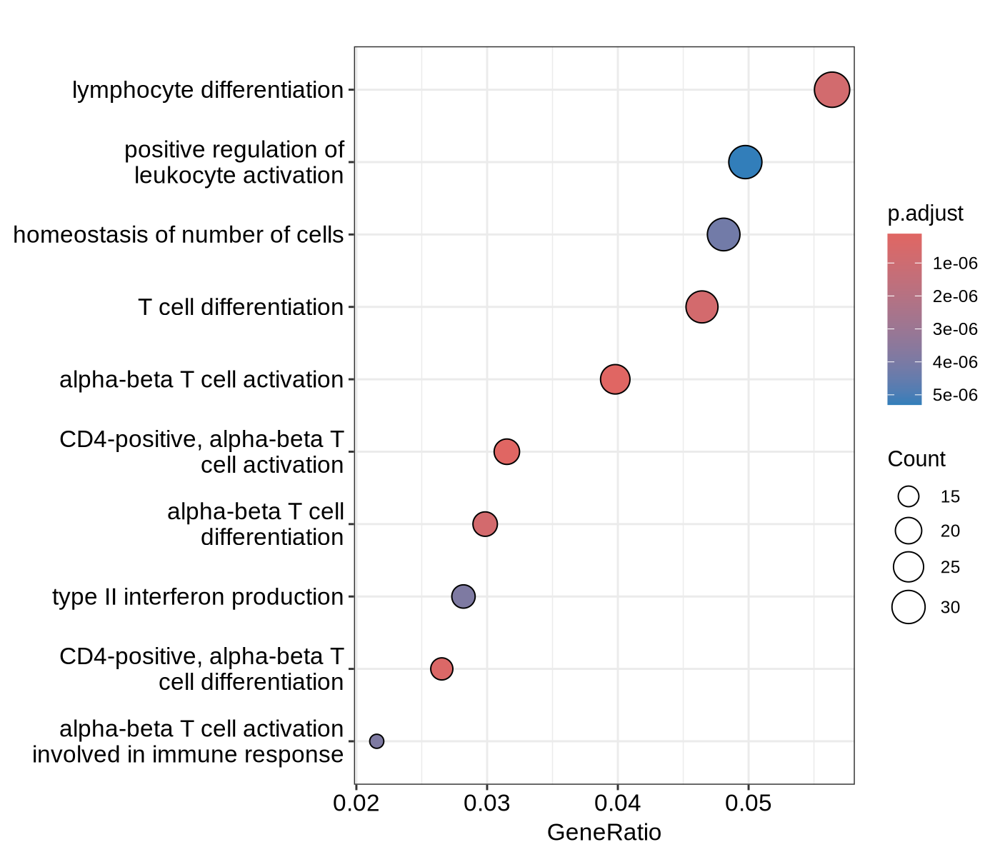

In [64]:
#xx = intersect(d1_up, intersect(d8_up, d3_up))
#ov = intersect(xx$FL, xx$ABM)
xx = row_cluster[name %in% c('2'), symbol]
length(xx)
yy <- enrichGO(xx, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)

# One of "MF", "BP", and "CC" subontologies.


[1] 1924

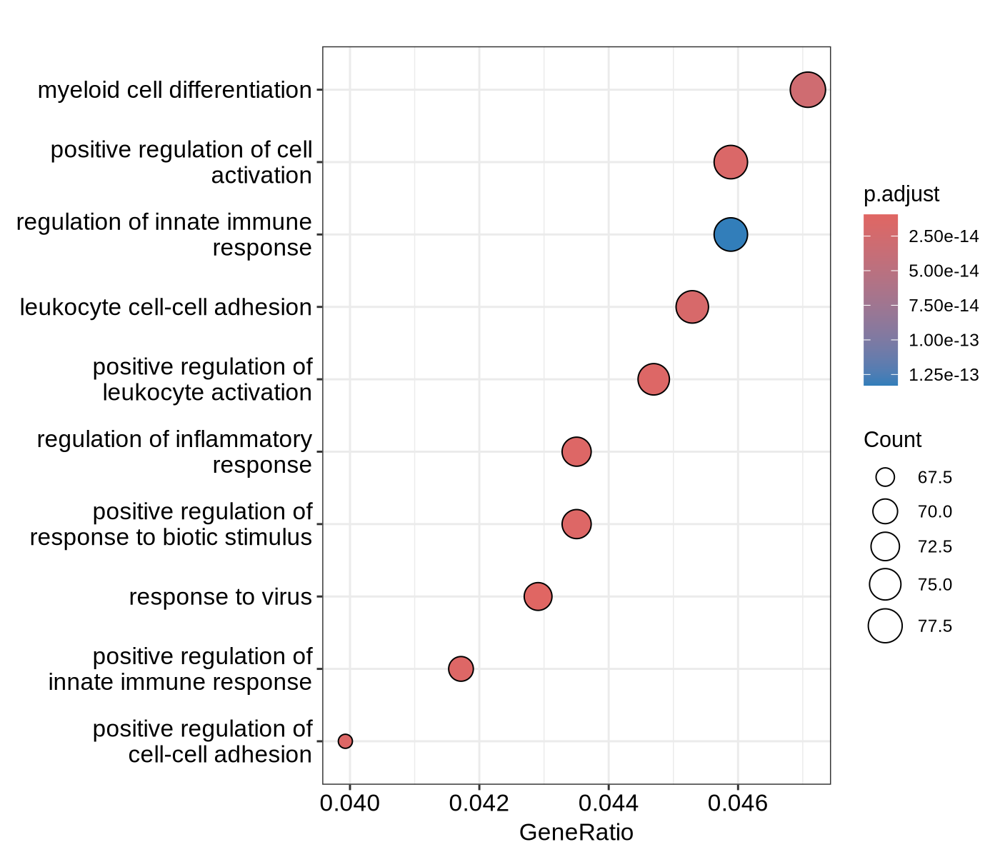

In [65]:
#xx = intersect(d1_up, intersect(d8_up, d3_up))
#ov = intersect(xx$FL, xx$ABM)
xx = row_cluster[name %in% c('1', '2', '4'), symbol]
length(xx)
yy <- enrichGO(xx, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)

# One of "MF", "BP", and "CC" subontologies.


In [687]:
tmp = as.data.table(yy@result, keep.rownames = T)
myloid_diff_genes = strsplit(tmp[ID == 'GO:0030099', geneID], '/')[[1]]
length(myloid_diff_genes)
myloid_diff_genes


[1] 79

[1] "Hmgb3"     "Tspo2"     "Pir"       "Gfi1b"     "Tfrc"      "Gata1"    
 [7] "Tmem14c"   "Slc11a2"   "Car2"      "Ncapg2"    "Hmgb2"     "Racgap1"  
[13] "Prdm16"    "Slc25a38"  "Abcb10"    "Fech"      "Alas2"     "Fam210b"  
[19] "Tmem64"    "Pml"       "Bpgm"      "Tcirg1"    "Mturn"     "Cdkn1c"   
[25] "Socs1"     "Zfp36"     "Nfkbia"    "Trib1"     "Fos"       "Clec5a"   
[31] "Dab2"      "Cd74"      "Csf1r"     "Bcl6"      "Pira2"     "Sh3pxd2a" 
[37] "Klf2"      "Actn1"     "Cebpe"     "Stat1"     "Rbfox2"    "Rara"     
[43] "Gata3"     "Ccl5"      "Fam20c"    "Trem2"     "Hoxa9"     "Tifab"    
[49] "Gimap5"    "Nkx2-3"    "Gata2"     "Il1rl1"    "Il4"       "Fas"      
[55] "Adam8"     "Tnfrsf11a" "Pirb"      "Ccl3"      "Mpl"       "Itgb6"    
[61] "Plscr1"    "Psen2"     "Batf"      "Gpr183"    "Csf1"      "Gab2"     
[67] "Nedd9"     "Rarg"      "Csf3r"     "Relb"      "Gpr171"    "Itpkb"    
[73] "Meis1"     "Ets1"      "Cebpg"     "Nfe2l1"    "Slc1a5"    "Tnfsf9"   
[79] "Mafb"

In [654]:
head(vs_ctrl_dt)

.id,rn,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,day,cell_type,genotype
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
res_d1_FL_me_ctrl,0610005C13Rik,9.59956,1.50475835,0.84143923,1.7883150,0.07372521,0.3664920,d1,FL,me
res_d1_FL_me_ctrl,0610007P14Rik,376.75952,-0.20577531,0.18578074,-1.1076246,0.26802399,0.6663250,d1,FL,me
res_d1_FL_me_ctrl,0610009B22Rik,72.61005,0.12566146,0.34205861,0.3673682,0.71334439,0.9296093,d1,FL,me
res_d1_FL_me_ctrl,0610009L18Rik,25.25928,0.55278433,0.61719486,0.8956399,0.37044513,0.7533990,d1,FL,me
res_d1_FL_me_ctrl,0610009O20Rik,599.32294,-0.15580559,0.10350388,-1.5053116,0.13224399,0.4928538,d1,FL,me
res_d1_FL_me_ctrl,0610010F05Rik,993.26564,0.03853159,0.09458321,0.4073830,0.68372672,0.9172559,d1,FL,me


In [ ]:
tmp = as.data.table(yy@result, keep.rownames = T)
myloid_diff_genes = strsplit(tmp[ID == 'GO:0030099', geneID], '/')[[1]]



Warning message:
"Removed 13056 rows containing missing values (`geom_text_repel()`)."
Warning message:
"ggrepel: 63 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


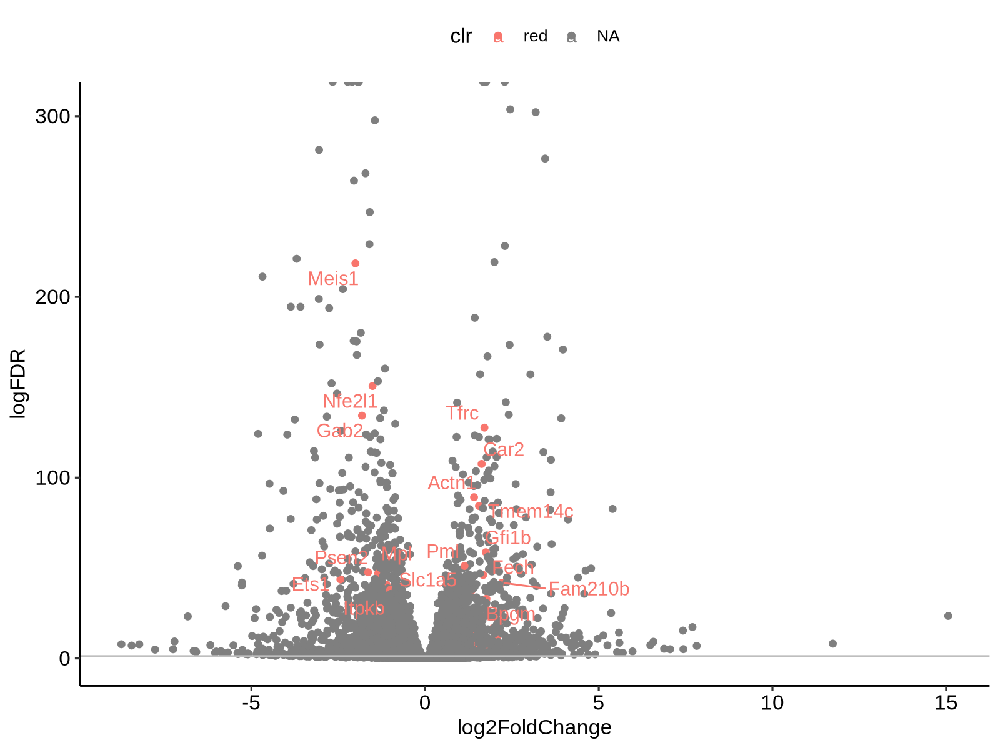

In [685]:
# tmp1 = intersect(cmp2_sig_fl_day1, intersect(cmp2_sig_fl_day3, cmp2_sig_fl_day8))
# tmp2 = intersect(cmp2_sig_fl_day1, intersect(cmp2_sig_abm_day3, cmp2_sig_abm_day8))
tmp = as.data.table(yy@result, keep.rownames = T)
myloid_diff_genes = strsplit(tmp[ID == 'GO:0030099', geneID], '/')[[1]]

options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)
plotdat = vs_ctrl_dt[cell_type == 'FL' & genotype == 'mx' & day == 'd3', ]
#plotdat[rn %in% row_cluster[name == '4', symbol], clr := 'red']
#plotdat[rn %in% row_cluster[name == '4', symbol], lbl := rn]

plotdat[rn %in% myloid_diff_genes, clr := 'red']
plotdat[rn %in% myloid_diff_genes, lbl := rn]
#plotdat[padj < 0.05 & abs(log2FoldChange) > 1, lbl := rn]
#plotdat[log2FoldChange > 5 & padj < 0.05, lbl := rn]
plotdat[, logFDR := -log(padj, 10)] 
#plotdat[logFDR < 1, logFDR := plotdat[logFDR < 1, logFDR] + 1]
ggplot(plotdat, aes(log2FoldChange, logFDR, label = lbl, color = clr)) + geom_point() + theme_pubr() +
geom_hline(yintercept = -log(0.05, 10), color = 'grey') + geom_text_repel()# + scale_y_continuous(trans = 'log2')


# comparing Ctrl vs 3 other oe conditions

In [159]:
dds = readRDS('data/nb_rnaseq_mar20.rds')
mtx = counts(dds)
head(mtx)

,D8_ABM_MX_ME_rep1,D8_ABM_Ctrl_rep1,D8_FL_MX_ME_rep1,D3_FL_MX_rep1,D1_ABM_MX_rep1,D1_FL_MX_ME_rep1,D3_FL_Ctrl_rep1,D1_ABM_Ctrl_rep1,D8_ABM_ME_rep1,D1_FL_Ctrl_rep1,⋯,D1_FL_Ctrl_rep2,D8_FL_MX_ME_rep2,D3_FL_MX_rep2,D1_ABM_Ctrl_rep2,D8_ABM_ME_rep2,D1_FL_MX_rep2,D3_ABM_MX_rep2,D3_FL_MX_ME_rep2,D3_ABM_ME_rep2,D8_FL_MX_rep2
0610005C13Rik,4,2,6,5,9,14,11,11,2,3,⋯,8,5,12,15,8,13,13,15,13,18
0610007P14Rik,349,319,221,237,257,407,196,309,315,506,⋯,803,424,393,288,456,469,388,504,513,640
0610009B22Rik,78,90,47,71,13,54,42,54,69,54,⋯,89,136,96,37,134,82,64,114,55,177
0610009L18Rik,22,27,25,23,18,7,17,2,36,13,⋯,23,37,32,36,38,22,37,36,63,30
0610009O20Rik,627,585,471,420,229,524,497,289,560,741,⋯,1061,648,823,438,864,963,679,1081,600,812
0610010F05Rik,936,871,994,507,525,930,933,606,912,1103,⋯,1865,1539,857,957,1458,1250,869,1004,1051,1377


## day 8 in ABM

In [160]:
# ABM day 8, all other vs Ctrl
dsn_sel = dsn[group_day == 'D8', ][group_cell_type == 'ABM', ]
dsn_sel[, group := 'OE']
dsn_sel[grep('Ctrl', sampleName), group := 'Ctrl']
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)
dsn_sel_df


,sampleName,group
,<chr>,<chr>
D8_ABM_Ctrl_rep1,D8_ABM_Ctrl_rep1,Ctrl
D8_ABM_Ctrl_rep2,D8_ABM_Ctrl_rep2,Ctrl
D8_ABM_ME_rep1,D8_ABM_ME_rep1,OE
D8_ABM_ME_rep2,D8_ABM_ME_rep2,OE
D8_ABM_MX_ME_rep1,D8_ABM_MX_ME_rep1,OE
D8_ABM_MX_ME_rep2,D8_ABM_MX_ME_rep2,OE
D8_ABM_MX_rep1,D8_ABM_MX_rep1,OE
D8_ABM_MX_rep2,D8_ABM_MX_rep2,OE


In [ ]:
names(sigs_see$cut)

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


In [162]:
keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds)
dds_sel <- DESeq(dds_sel)
res = as.data.table(results(dds_sel) , keep.rownames = T)


[1] 13135

In [164]:
res_sig_genes = res[padj < 0.05 & abs(log2FoldChange) > 1, rn]
length(res_sig_genes)
sig_abm_day8 = res_sig_genes


[1] 53

In [165]:
mtx_norm_counts = counts(dds_sel, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)


[1] 53  8

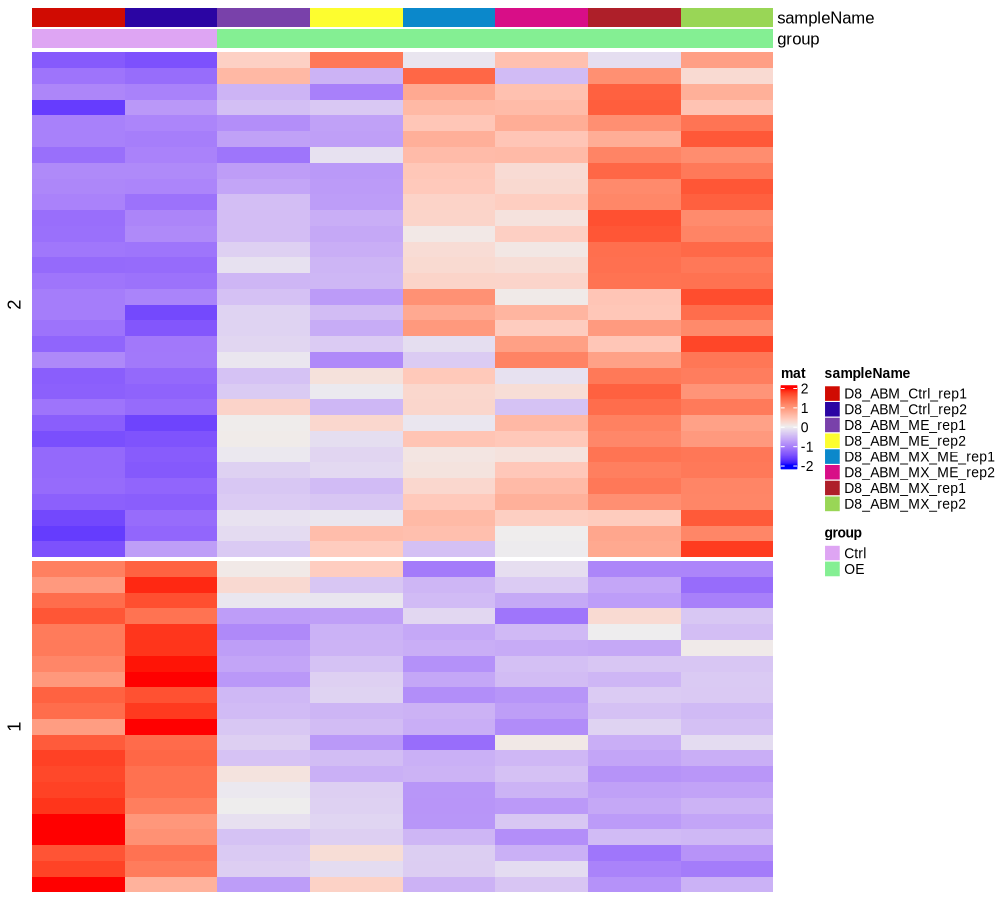

In [166]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)


## day 3 ABM

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12967

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 115   8

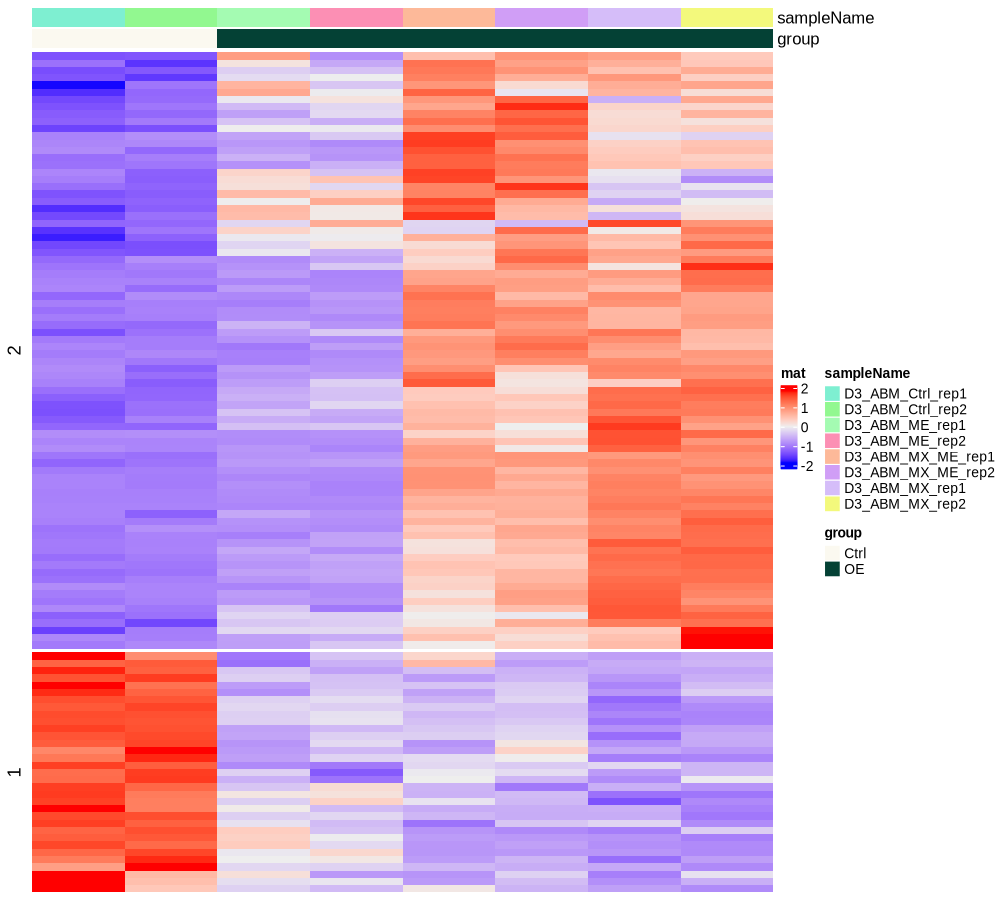

In [136]:
dsn_sel = dsn[group_day == 'D3', ][group_cell_type == 'ABM', ]
dsn_sel[, group := 'OE']
dsn_sel[grep('Ctrl', sampleName), group := 'Ctrl']
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_sel <- DESeq(dds_sel)
res = as.data.table(results(dds_sel) , keep.rownames = T)

res_sig_genes = res[padj < 0.05 & abs(log2FoldChange) > 1, rn]
sig_abm_day3 = res_sig_genes

mtx_norm_counts = counts(dds_sel, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)


## day 1 ABM 

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12967

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 115   8

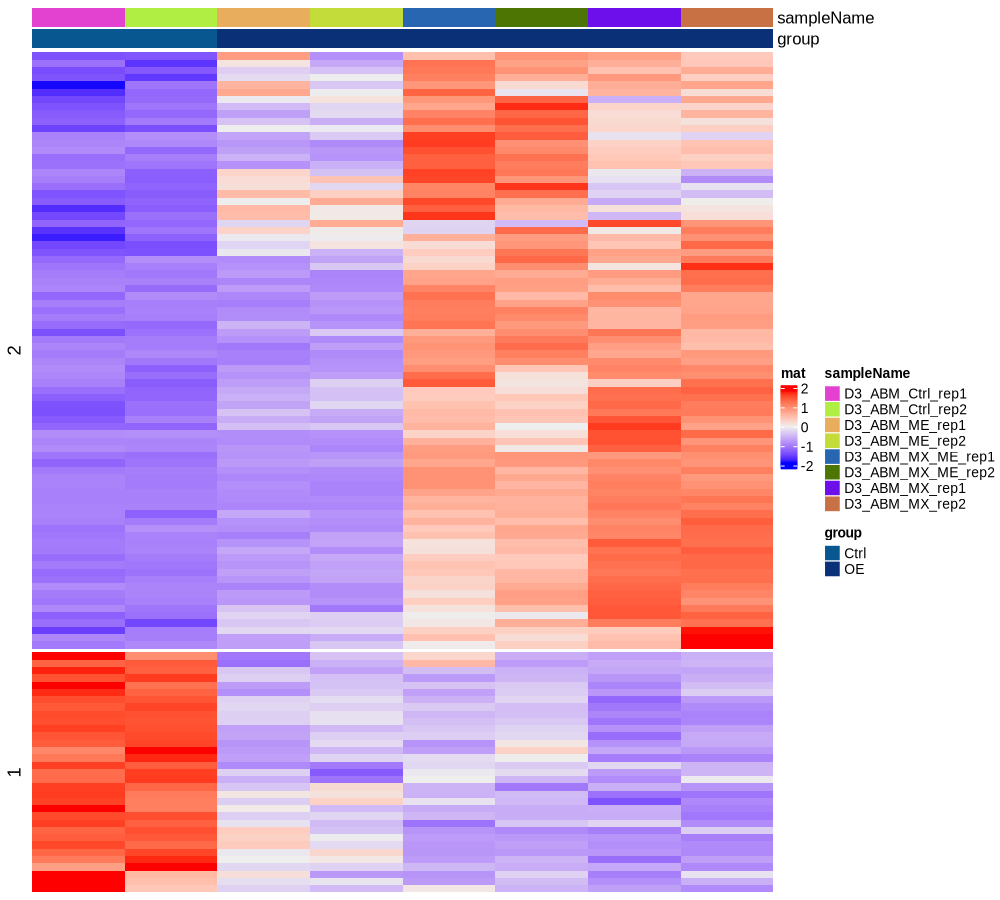

In [145]:
dsn_sel = dsn[group_day == 'D3', ][group_cell_type == 'ABM', ]
dsn_sel[, group := 'OE']
dsn_sel[grep('Ctrl', sampleName), group := 'Ctrl']
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_sel <- DESeq(dds_sel)
res = as.data.table(results(dds_sel) , keep.rownames = T)

res_sig_genes = res[padj < 0.05 & abs(log2FoldChange) > 1, rn]
sig_abm_day1 = res_sig_genes

mtx_norm_counts = counts(dds_sel, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)


## FL day 8

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12947

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 118   8

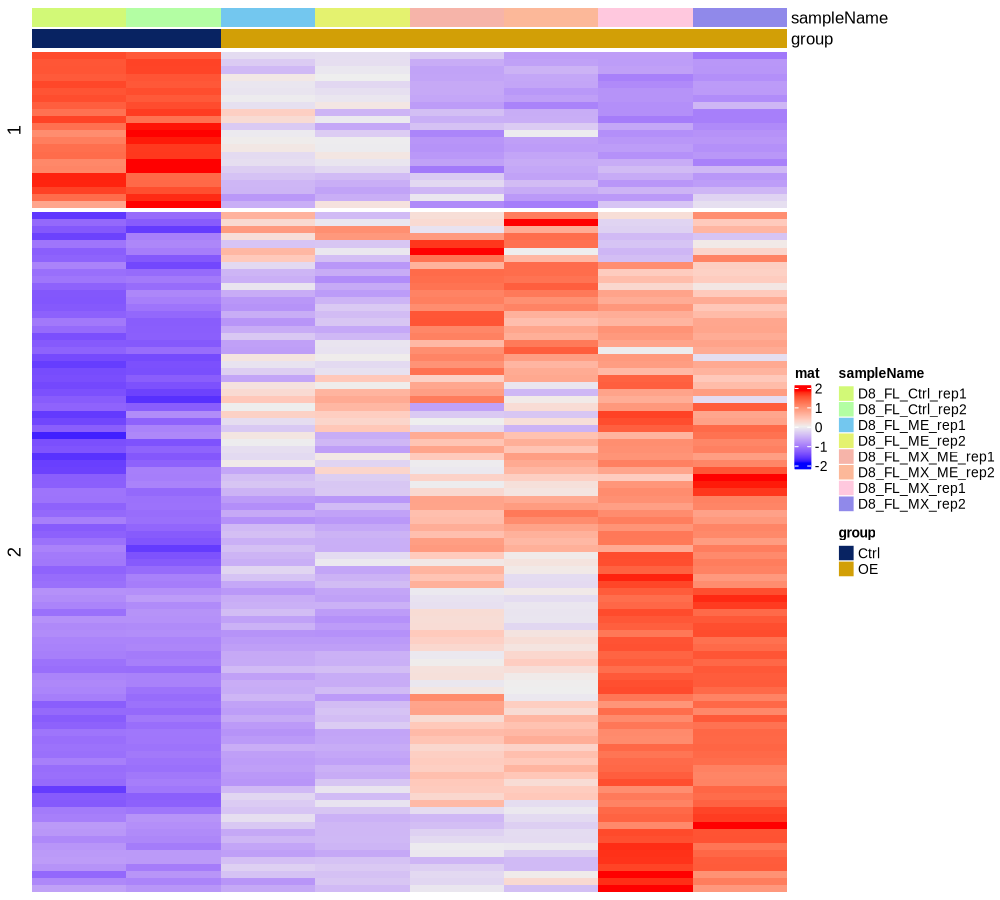

In [144]:
dsn_sel = dsn[group_day == 'D8', ][group_cell_type == 'FL', ]
dsn_sel[, group := 'OE']
dsn_sel[grep('Ctrl', sampleName), group := 'Ctrl']
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_sel <- DESeq(dds_sel)
res = as.data.table(results(dds_sel) , keep.rownames = T)

res_sig_genes = res[padj < 0.05 & abs(log2FoldChange) > 1, rn]
sig_fl_day8 = res_sig_genes

mtx_norm_counts = counts(dds_sel, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)


## FL day 3

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12963

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 753   8

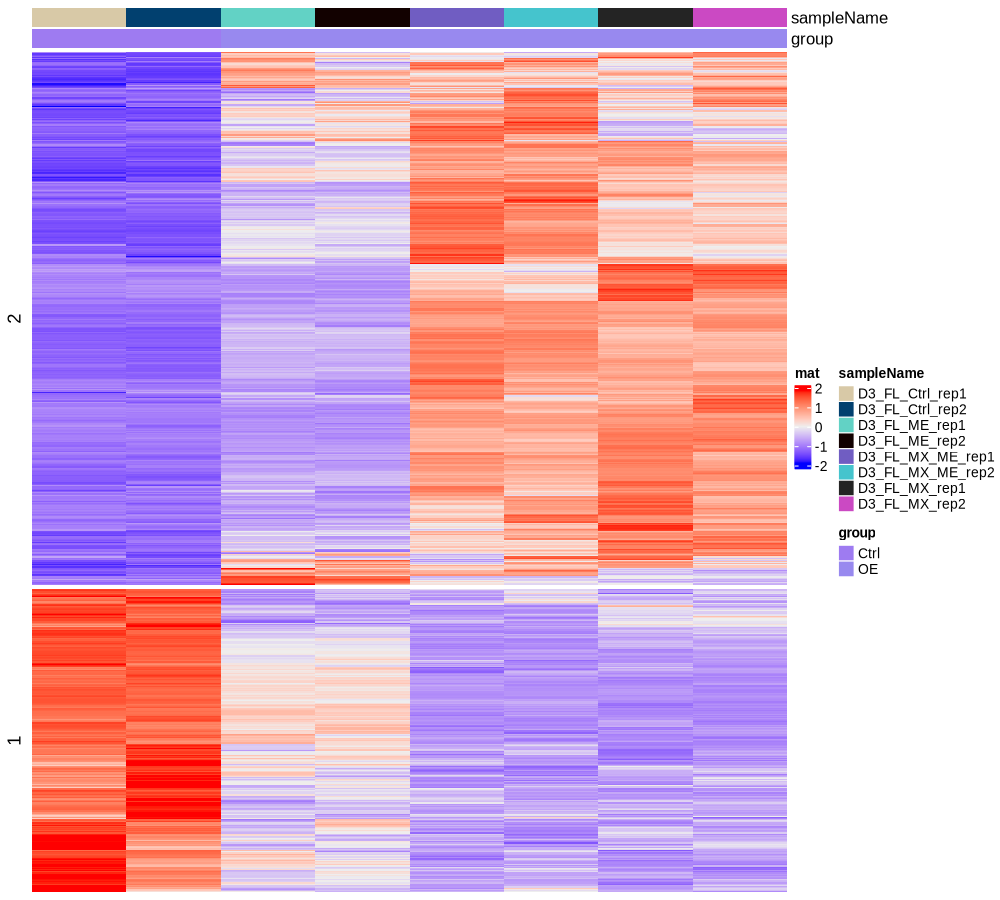

In [143]:
dsn_sel = dsn[group_day == 'D3', ][group_cell_type == 'FL', ]
dsn_sel[, group := 'OE']
dsn_sel[grep('Ctrl', sampleName), group := 'Ctrl']
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_sel <- DESeq(dds_sel)
res = as.data.table(results(dds_sel) , keep.rownames = T)

res_sig_genes = res[padj < 0.05 & abs(log2FoldChange) > 1, rn]
sig_fl_day3 = res_sig_genes

mtx_norm_counts = counts(dds_sel, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)


## FL day 1

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12862

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 68  8

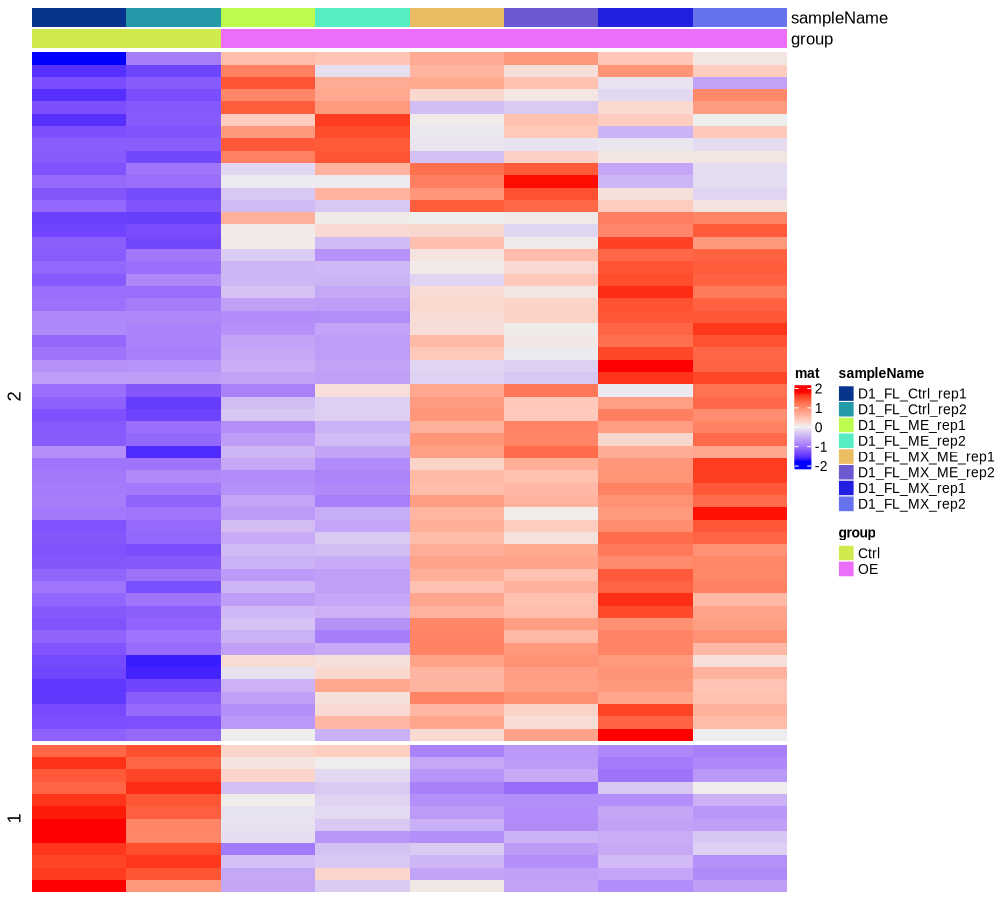

In [142]:
dsn_sel = dsn[group_day == 'D1', ][group_cell_type == 'FL', ]
dsn_sel[, group := 'OE']
dsn_sel[grep('Ctrl', sampleName), group := 'Ctrl']
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_sel <- DESeq(dds_sel)
res = as.data.table(results(dds_sel) , keep.rownames = T)

res_sig_genes = res[padj < 0.05 & abs(log2FoldChange) > 1, rn]
sig_fl_day1 = res_sig_genes

mtx_norm_counts = counts(dds_sel, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)


## add all sig genes

In [167]:
sig_all = unique(c(sig_fl_day1, sig_fl_day3, sig_fl_day8, sig_abm_day1, sig_abm_day3, sig_abm_day8) )
length(sig_all)
head(sig_all)
  

[1] 946

[1] "Abcg1"    "Acsbg1"   "Adamtsl5" "Adra2a"   "Alcam"    "Bbs1"

[1] 946  48

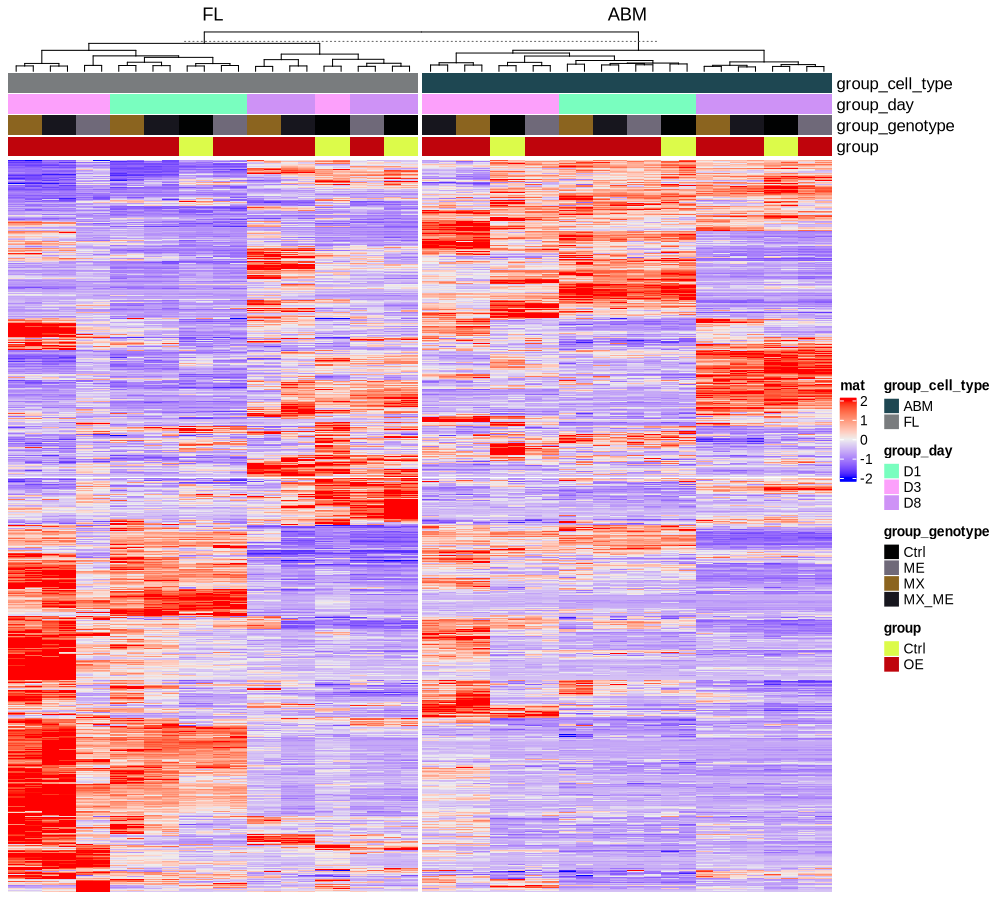

In [182]:
mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[sig_all, ]
dim(mtx_norm_counts)

dsn[, group := 'OE']
dsn[grep('Ctrl', sampleName), group := 'Ctrl']
dsn_sel = setDF(dsn[, .(group_cell_type, group_day, group_genotype, group)], rownames = dsn$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = T)


# focus on MNX vs Ctrl

In [ ]:
dds = readRDS('data/nb_rnaseq_mar20.rds')
mtx = counts(dds)
head(mtx)

## ABM day 8

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12782

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 213   4

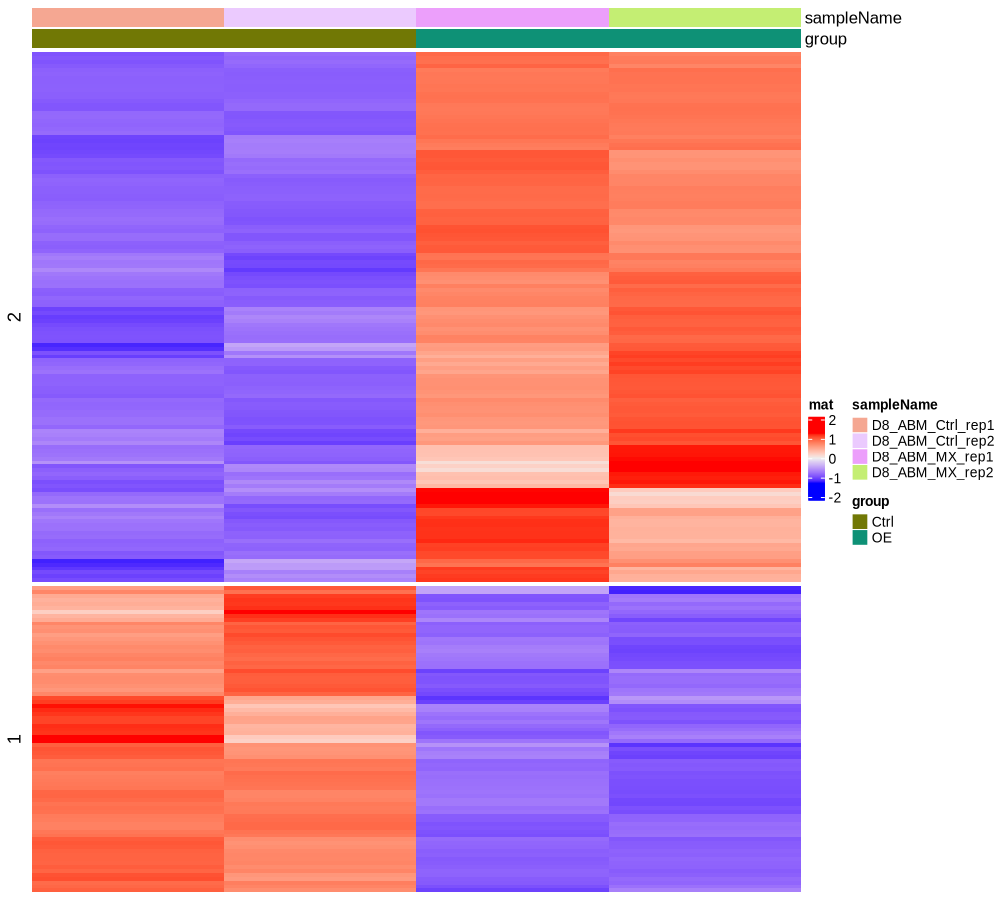

In [345]:
dsn_sel = dsn[group_day == 'D8', ][group_cell_type == 'ABM', ][group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_abm_d8 <- DESeq(dds_sel)
res_abm_d8 = as.data.table(results(dds_abm_d8) , keep.rownames = T)

res_sig_genes = res_abm_d8[padj < 0.05 & abs(log2FoldChange) > 1, rn]
cmp2_sig_abm_day8 = res_sig_genes

mtx_norm_counts = counts(dds_abm_d8, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
ht = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)
ht


Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


[1] 213   8

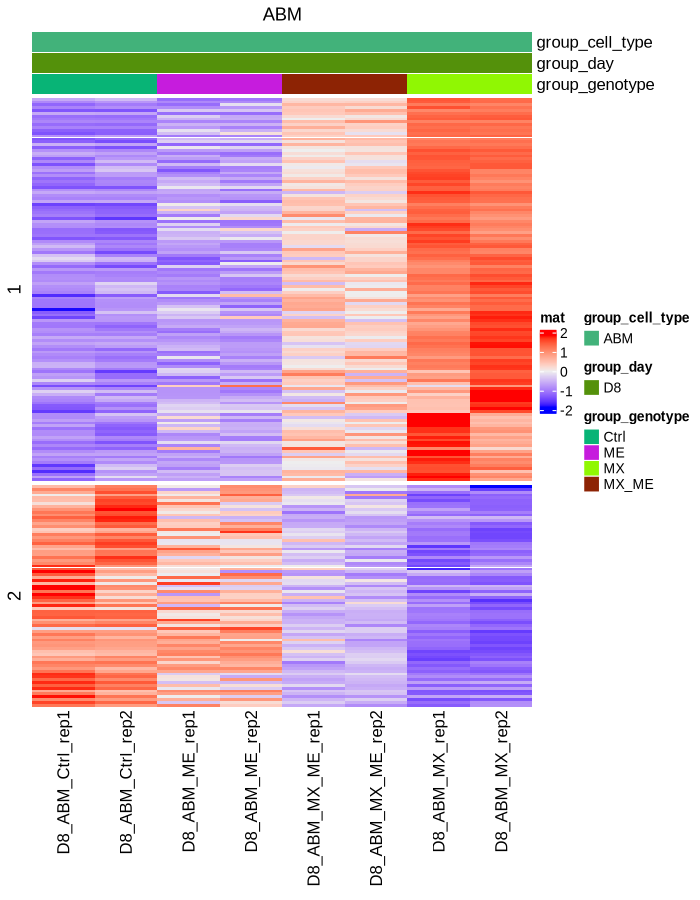

In [231]:
ordered_rows = unname(unlist(row_order(ht)))
cmp2_sig_all = unique(c(cmp2_sig_abm_day8))
cmp2_sig_all = cmp2_sig_all[ordered_rows]

dsn_sel = dsn[group_cell_type == 'ABM' & group_day == 'D8', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = F, km = 2)


## ABM day 3

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12981

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 930   4

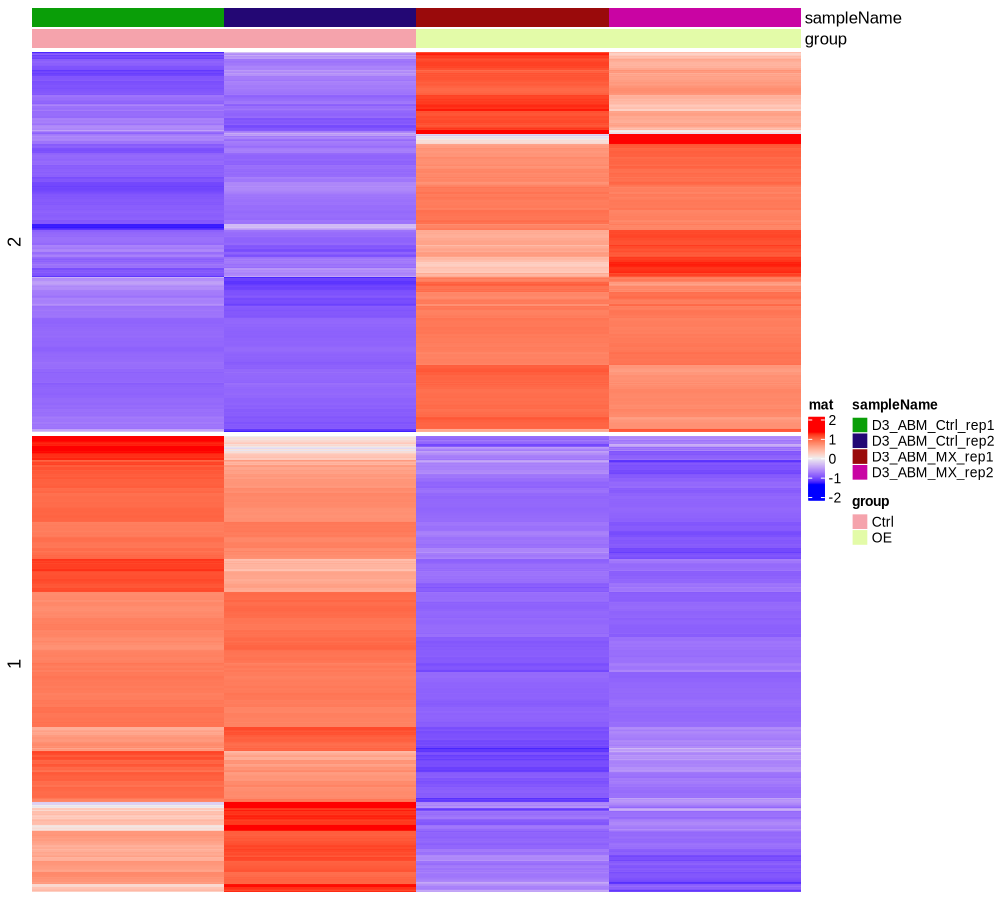

In [346]:
dsn_sel = dsn[group_day == 'D3', ][group_cell_type == 'ABM', ][group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_abm_d3 <- DESeq(dds_sel)
res_abm_d3 = as.data.table(results(dds_abm_d3) , keep.rownames = T)

res_sig_genes = res_abm_d3[padj < 0.05 & abs(log2FoldChange) > 1, rn]
cmp2_sig_abm_day3 = res_sig_genes

mtx_norm_counts = counts(dds_abm_d3, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
ht = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)
ht


Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


[1] 930   8

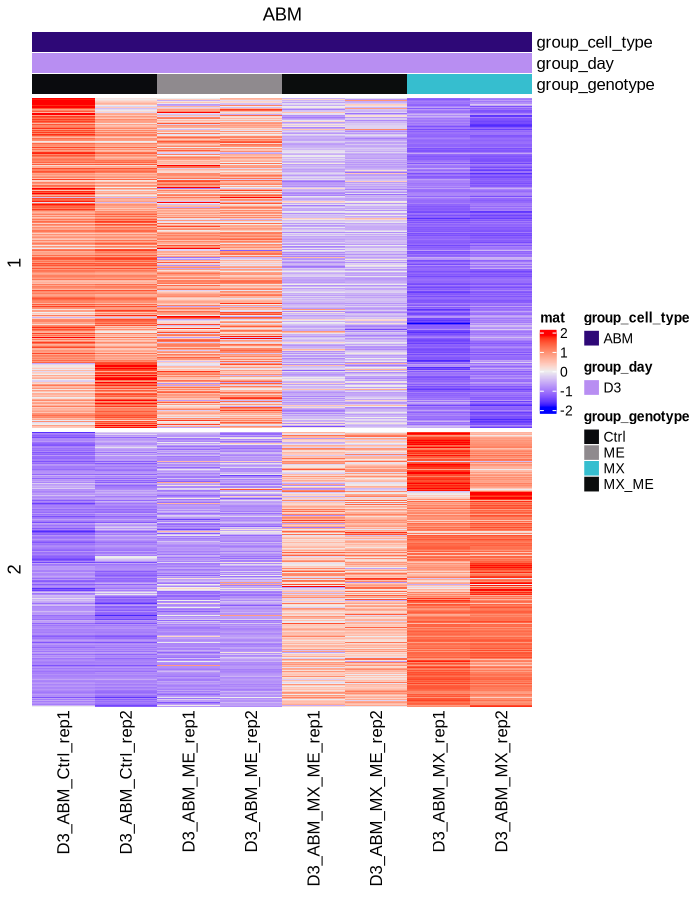

In [233]:
ordered_rows = unname(unlist(row_order(ht)))
cmp2_sig_all = unique(c(cmp2_sig_abm_day3))
cmp2_sig_all = cmp2_sig_all[ordered_rows]

dsn_sel = dsn[group_cell_type == 'ABM' & group_day == 'D3', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = F, km = 2)


## ABM day 1

In [347]:
dsn_sel = dsn[group_day == 'D1', ][group_cell_type == 'ABM', ][group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_abm_d1 <- DESeq(dds_sel)
res_abm_d1 = as.data.table(results(dds_abm_d1) , keep.rownames = T)

res_sig_genes = res_abm_d1[padj < 0.05 & abs(log2FoldChange) > 1, rn]
cmp2_sig_abm_day1 = res_sig_genes

mtx_norm_counts = counts(dds_abm_d1, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
ht = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)


Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12565

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 66  4

Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


[1] 66  8

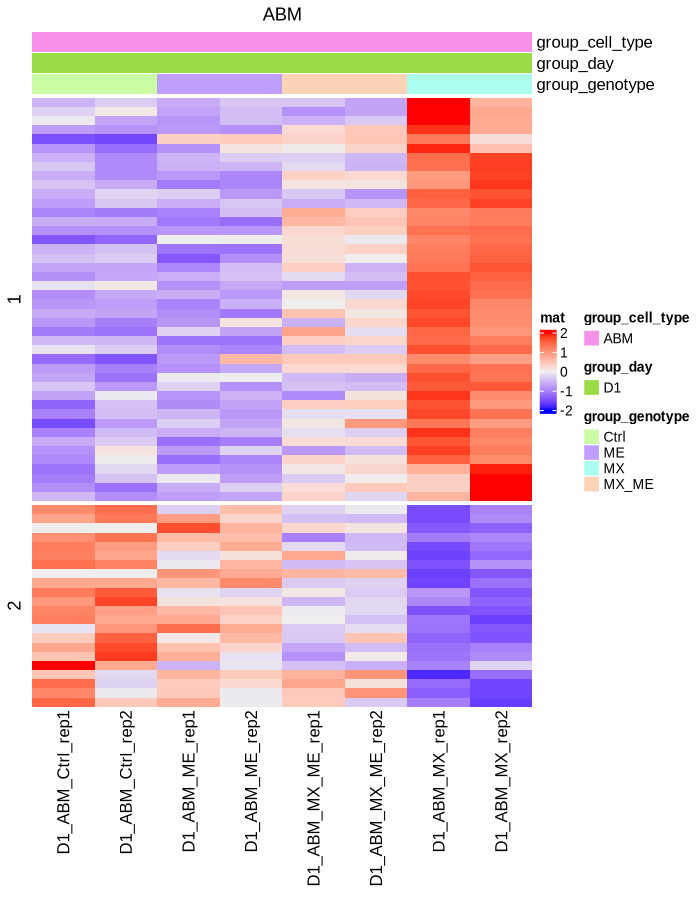

In [235]:
ordered_rows = unname(unlist(row_order(ht)))
cmp2_sig_all = unique(c(cmp2_sig_abm_day1))
cmp2_sig_all = cmp2_sig_all[ordered_rows]

dsn_sel = dsn[group_cell_type == 'ABM' & group_day == 'D1', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = F, km = 2)


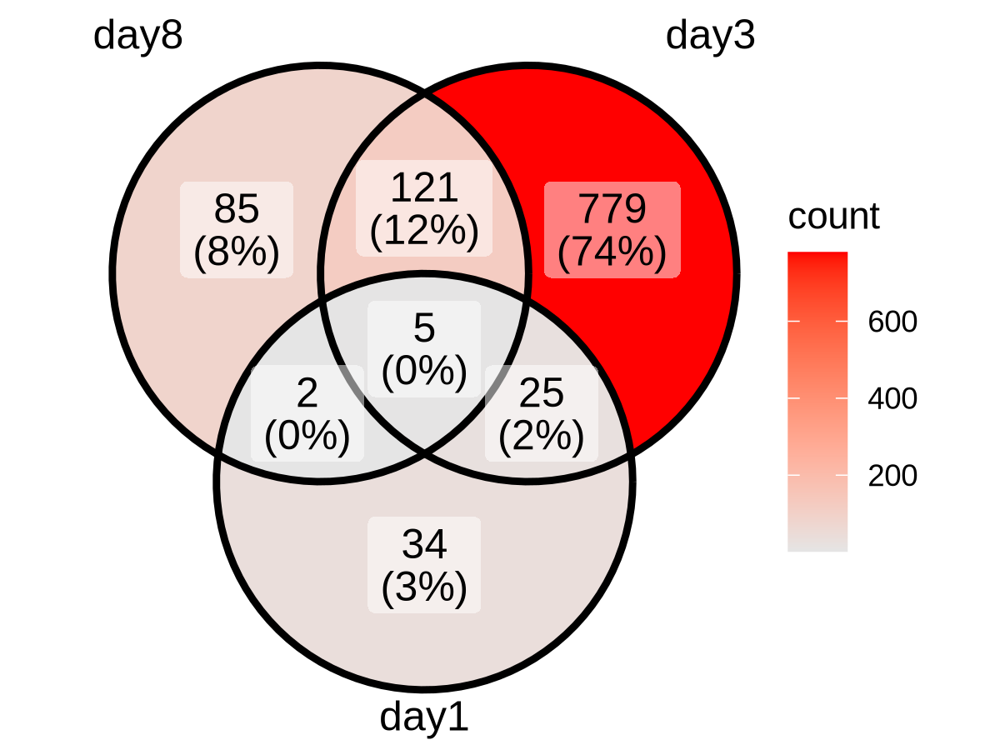

In [252]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
xx = list(day8 = cmp2_sig_abm_day8, day3 = cmp2_sig_abm_day3, day1 = cmp2_sig_abm_day1)
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red")

## FL day 8

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12983

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 1487    4

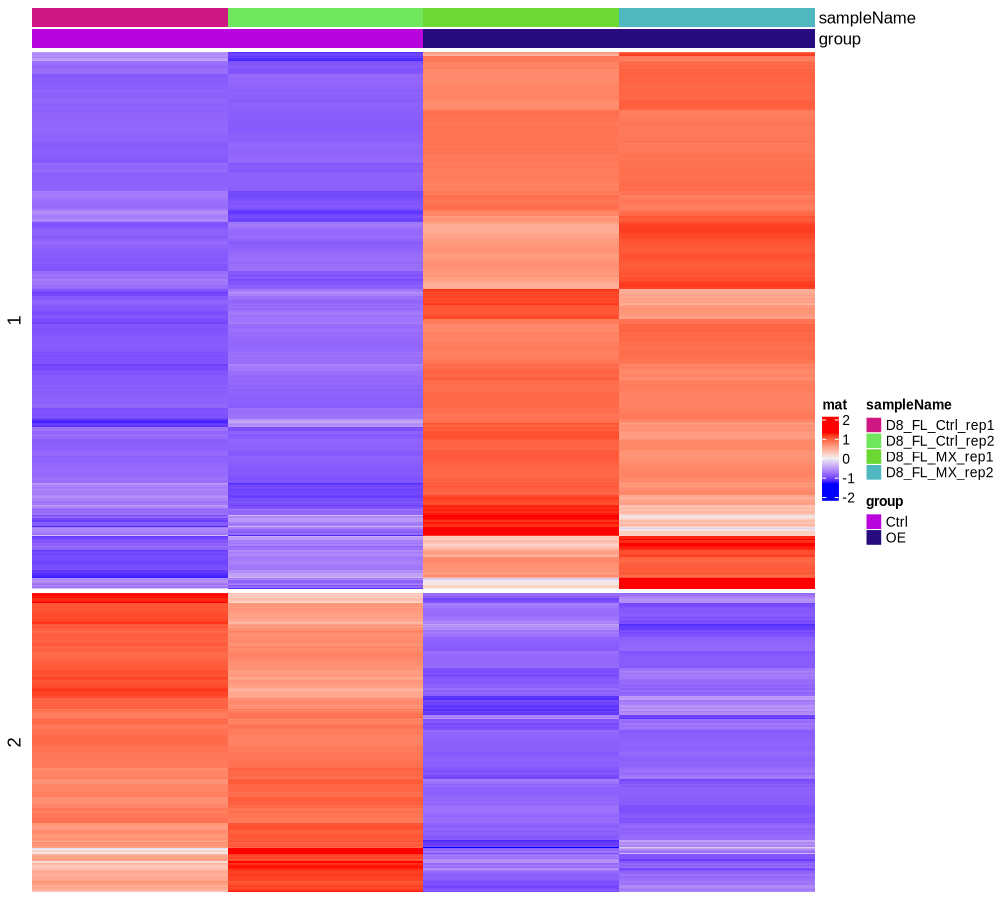

In [348]:
dsn_sel = dsn[group_day == 'D8', ][group_cell_type == 'FL', ][group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_fl_d8 <- DESeq(dds_sel)
res_fl_d8 = as.data.table(results(dds_fl_d8) , keep.rownames = T)

res_sig_genes = res_fl_d8[padj < 0.05 & abs(log2FoldChange) > 1, rn]
cmp2_sig_fl_day8 = res_sig_genes

mtx_norm_counts = counts(dds_fl_d8, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
ht = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)
ht


Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


[1] 1487    8

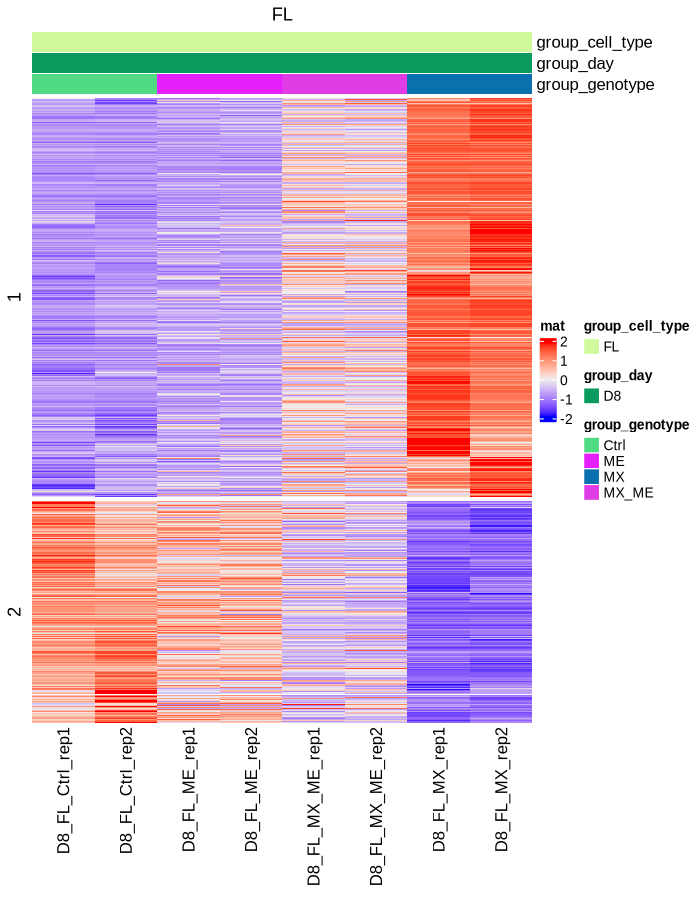

In [238]:
ordered_rows = unname(unlist(row_order(ht)))
cmp2_sig_all = unique(c(cmp2_sig_fl_day8))
cmp2_sig_all = cmp2_sig_all[ordered_rows]

dsn_sel = dsn[group_cell_type == 'FL' & group_day == 'D8', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = F, km = 2)


## FL day 3 

In [349]:
dsn_sel = dsn[group_day == 'D3', ][group_cell_type == 'FL', ][group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_fl_d3 <- DESeq(dds_sel)
res_fl_d3 = as.data.table(results(dds_fl_d3) , keep.rownames = T)

res_sig_genes = res_fl_d3[padj < 0.05 & abs(log2FoldChange) > 1, rn] 
cmp2_sig_fl_day3 = res_sig_genes

mtx_norm_counts = counts(dds_fl_d3, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
ht = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)


Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12993

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 1724    4

Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


[1] 1724    8

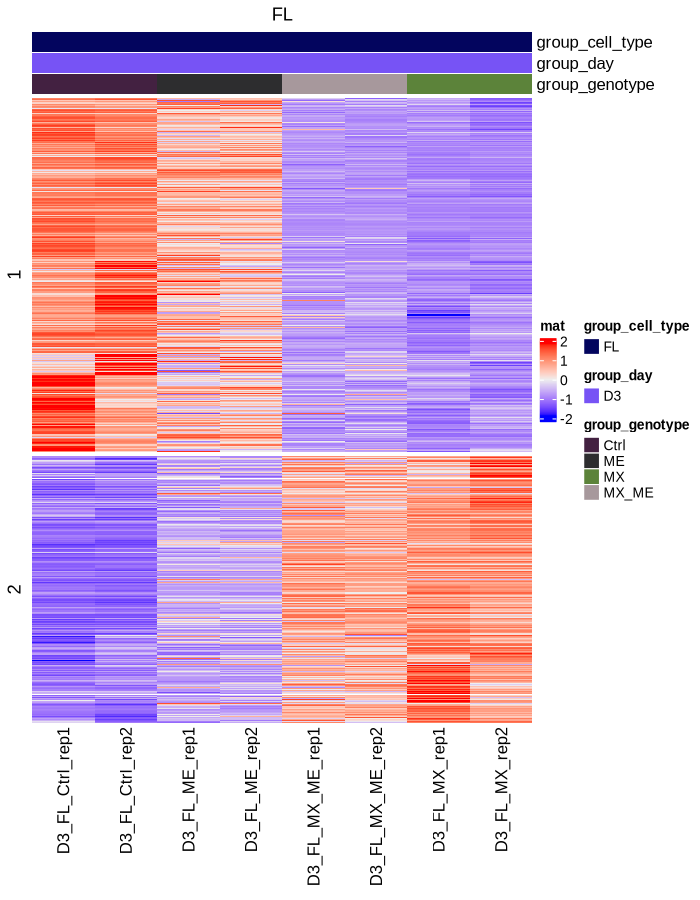

In [241]:
ordered_rows = unname(unlist(row_order(ht)))
cmp2_sig_all = unique(c(cmp2_sig_fl_day3))
cmp2_sig_all = cmp2_sig_all[ordered_rows]

dsn_sel = dsn[group_cell_type == 'FL' & group_day == 'D3', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = F, km = 2)


## FL day 1

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12899

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


[1] 802   4

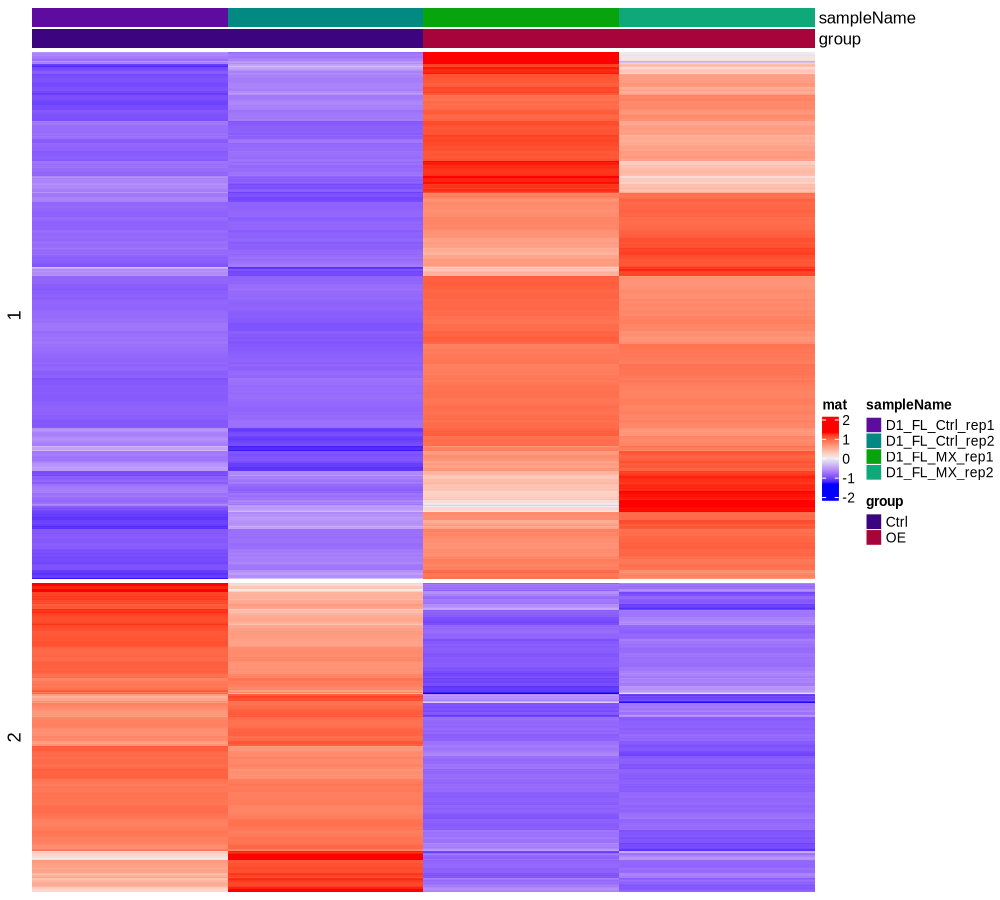

In [352]:
dsn_sel = dsn[group_day == 'D1', ][group_cell_type == 'FL', ][group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_fl_d1 <- DESeq(dds_sel)
res_fl_d1 = as.data.table(results(dds_fl_d1) , keep.rownames = T)

res_sig_genes = res_fl_d1[padj < 0.05 & abs(log2FoldChange) > 1, rn]
cmp2_sig_fl_day1 = res_sig_genes

mtx_norm_counts = counts(dds_fl_d1, normalized = T)
mtx_norm_counts = mtx_norm_counts[res_sig_genes, ]
dim(mtx_norm_counts)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
column_ha = HeatmapAnnotation(df = dsn_sel_df) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel_df)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
ht = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T,  show_row_dend = F, cluster_columns = F, km = 2)
ht


Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


[1] 802   8

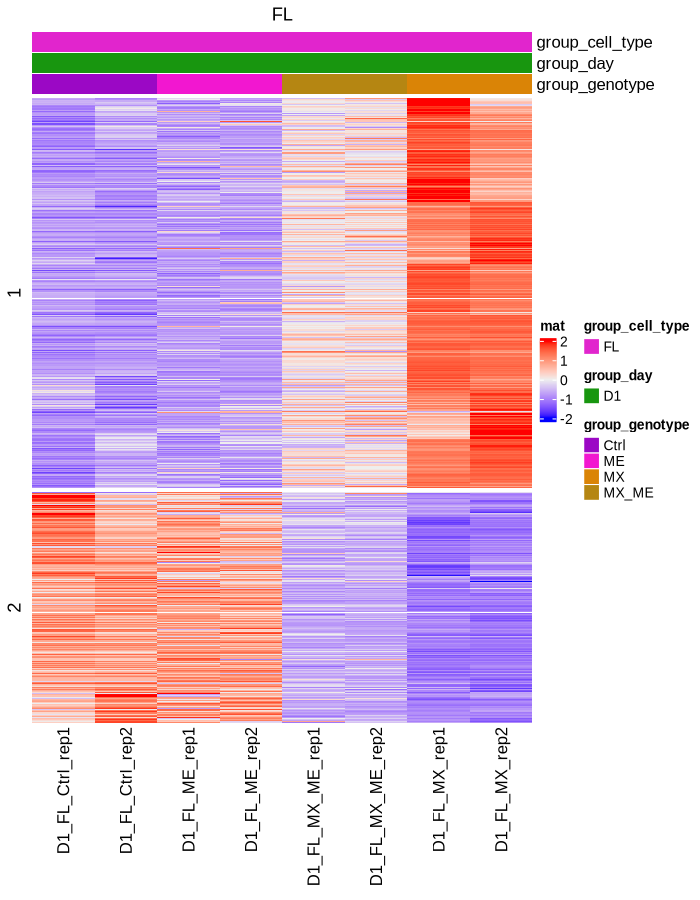

In [243]:
ordered_rows = unname(unlist(row_order(ht)))
cmp2_sig_all = unique(c(cmp2_sig_fl_day1))
cmp2_sig_all = cmp2_sig_all[ordered_rows]

dsn_sel = dsn[group_cell_type == 'FL' & group_day == 'D1', .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = F, km = 2)


## overlapped ven: ABM vs FL at day 3

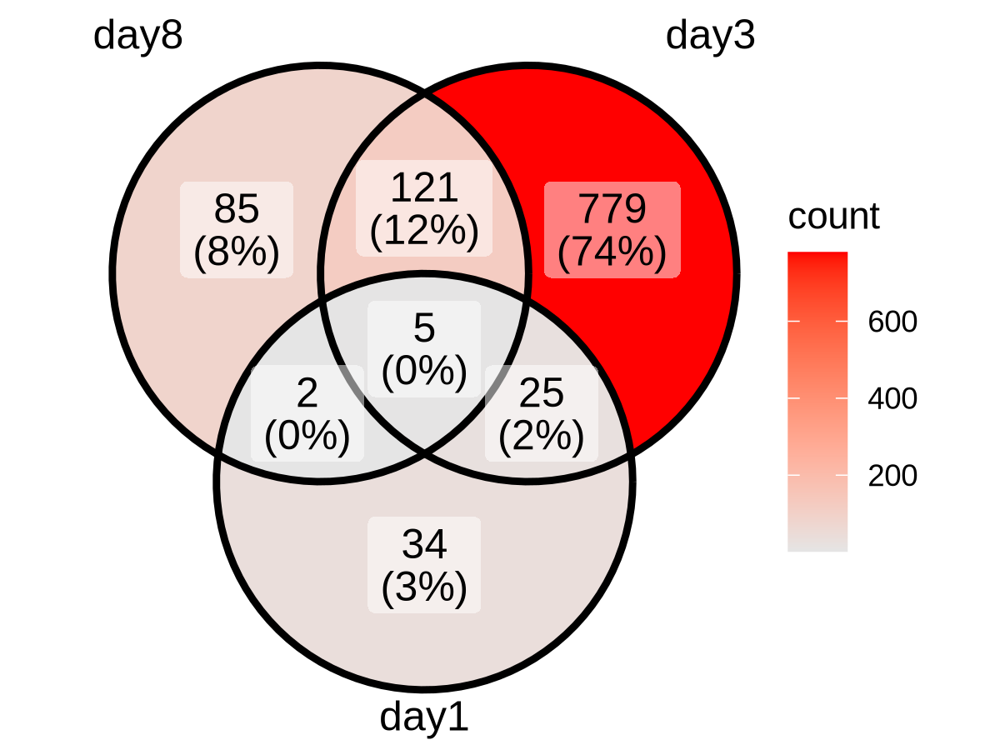

In [416]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
xx = list(day8 = cmp2_sig_abm_day8, day3 = cmp2_sig_abm_day3, day1 = cmp2_sig_abm_day1)
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red")


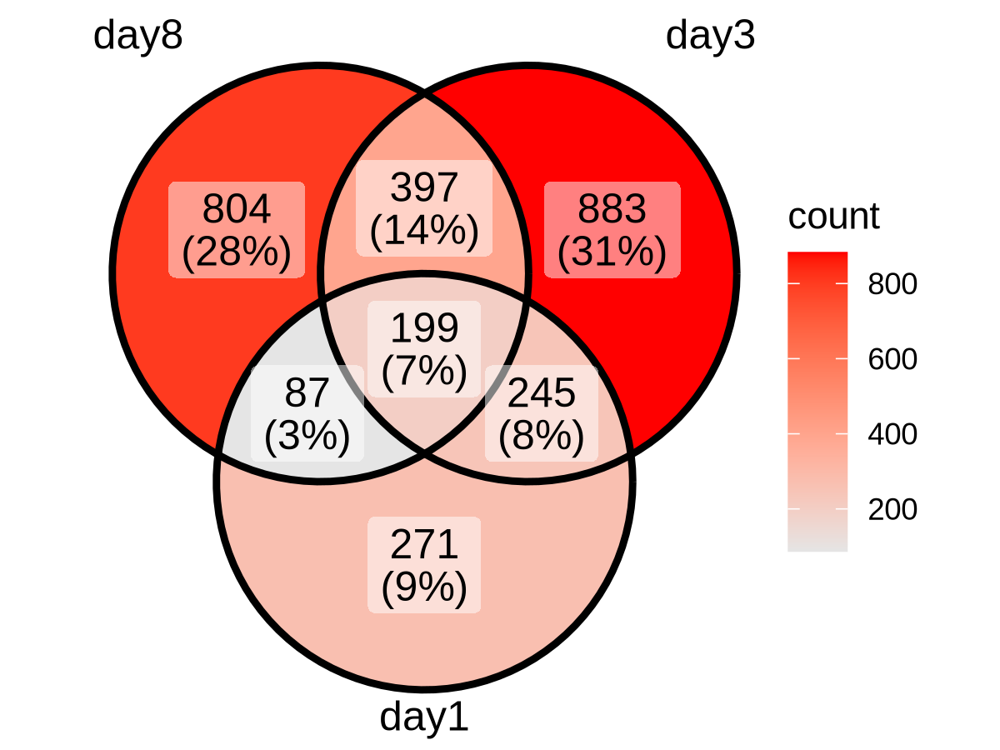

In [253]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
xx = list(day8 = cmp2_sig_fl_day8, day3 = cmp2_sig_fl_day3, day1 = cmp2_sig_fl_day1)
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red")

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


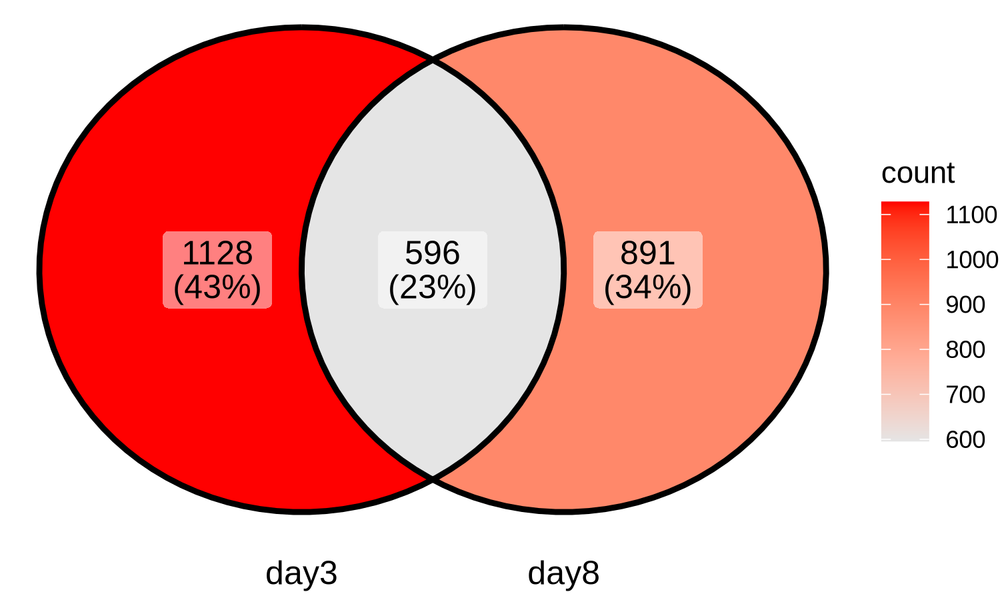

In [324]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)
xx = list(day3 = cmp2_sig_fl_day3, day8 = cmp2_sig_fl_day8)
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red") + coord_flip()


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


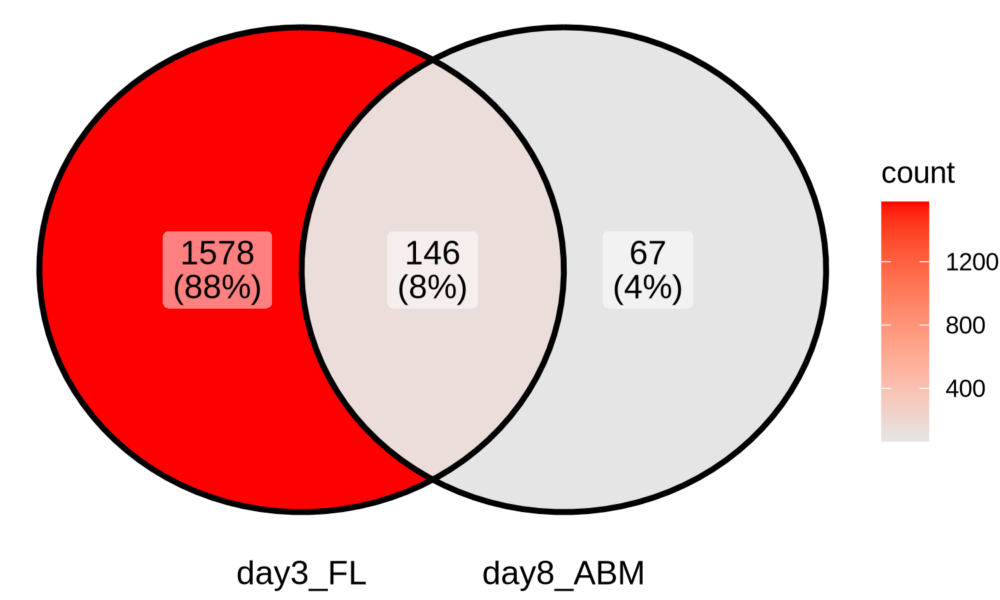

In [322]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)
xx = list(day3_FL = cmp2_sig_fl_day3, day8_ABM = cmp2_sig_abm_day8)
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red") + coord_flip()

#options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
#ggvenn(xx)


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


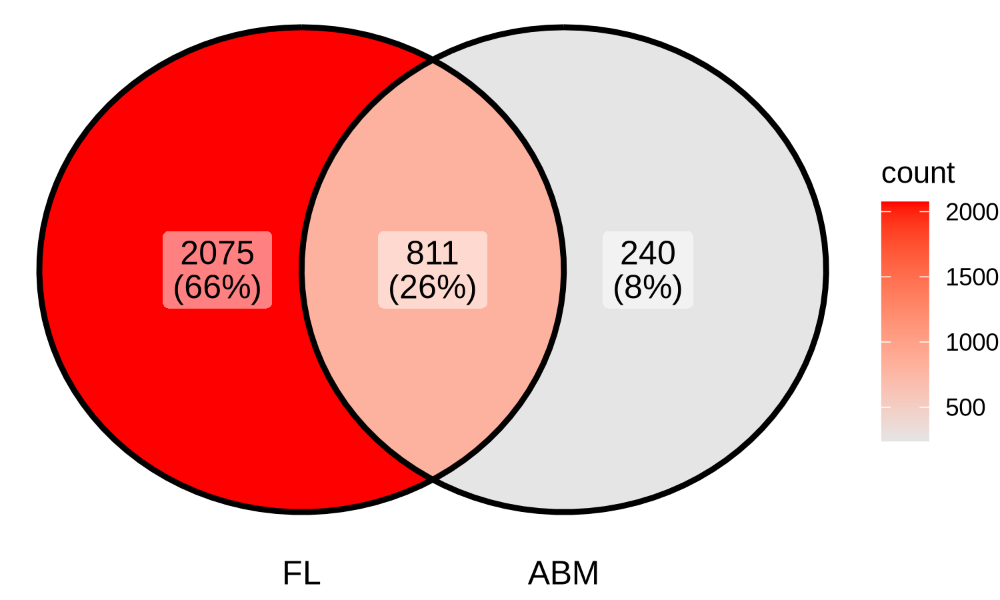

In [417]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)
xx = list(FL = c(cmp2_sig_fl_day3, cmp2_sig_fl_day8, cmp2_sig_fl_day1), ABM = c(cmp2_sig_abm_day8, cmp2_sig_abm_day3, cmp2_sig_abm_day1))
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red") + coord_flip()

## time course based on log2FC


,ABM_day1,ABM_day3,ABM_day8,FL_day1,FL_day3,FL_day8
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1100001G20Rik,0.41068489,-1.38404066,-0.6113021,-1.4915854,-1.1601894,1.9521223
1110007C09Rik,-0.08625510,0.78947201,0.1281875,1.4370325,0.6503350,-0.2512344
1110008P14Rik,0.47612884,0.19420663,-0.3242073,0.4305970,1.1922675,-0.2297705
1110028F11Rik,0.10754566,-2.72630221,NA,-2.0371755,-3.9096477,-1.0045210
1110038B12Rik,-0.06481061,0.01013852,0.1040965,0.1218166,-1.0279018,-1.6473958
1190002F15Rik,0.05956470,0.06325208,-0.2131172,0.4543125,0.8305259,1.2439831


[1] 3126    6

Warning message:
"The input is a data frame-like object, convert it to a matrix."


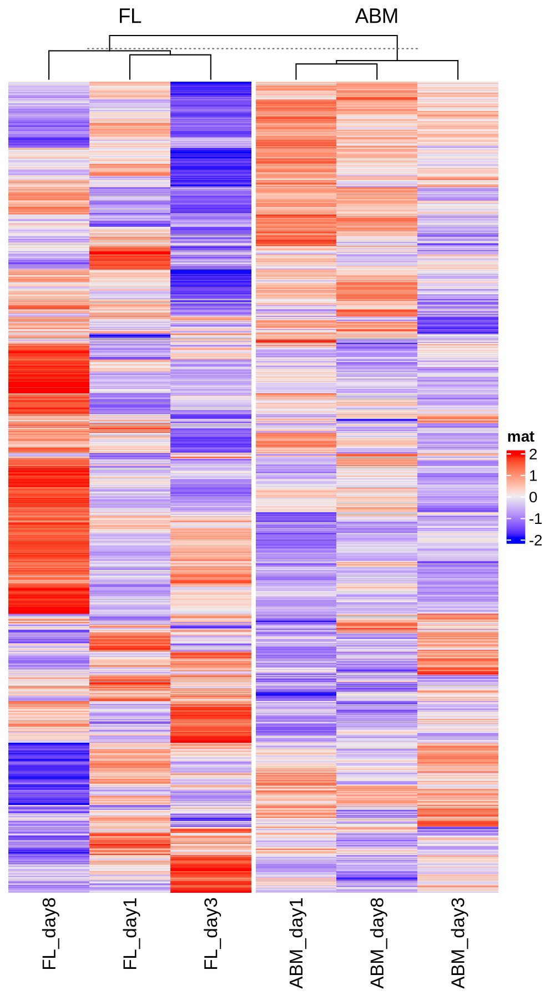

In [373]:
tmp = list(res_fl_d1, res_fl_d3, res_fl_d8, res_abm_d1, res_abm_d3, res_abm_d8)
names(tmp) = c('FL_day1', 'FL_day3', 'FL_day8', 'ABM_day1', 'ABM_day3', 'ABM_day8')
res_dt_mnx_vs_ctrl = rbindlist(tmp, idcol = T)

gene_sel = res_dt_mnx_vs_ctrl[padj < 0.05 & abs(log2FoldChange) > 1, rn]
mtx_log2fc = dcast(res_dt_mnx_vs_ctrl, rn ~ .id, value.var = 'log2FoldChange')
mtx_log2fc = mtx_log2fc[rn %in% gene_sel, ]
mtx_log2fc = setDF(mtx_log2fc[, 2:7], rownames = mtx_log2fc$rn)
head(mtx_log2fc)
dim(mtx_log2fc)

#column_ha = HeatmapAnnotation(df = dsn_sel) 
plotdat = scale_fun(mtx_log2fc)
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 5, repr.plot.height = 9, repr.plot.res = 200)
#col_split = paste0(dsn_sel$group_cell_type)
#Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F)
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = T, show_row_dend = F, cluster_columns = T, column_split = c('ABM', 'ABM', 'ABM', 'FL', 'FL', 'FL'))



## add together

[1] 2886

[1] 2886   48

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



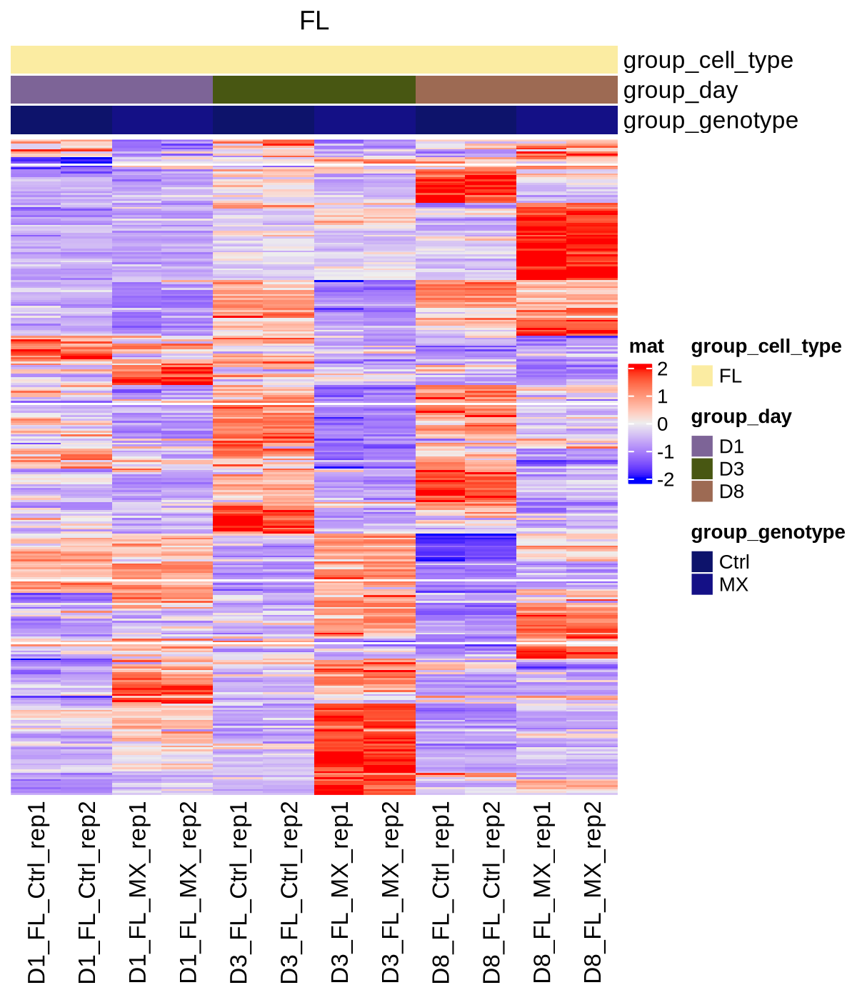

In [415]:
cmp2_sig_all = unique(c(cmp2_sig_fl_day1, cmp2_sig_fl_day3, cmp2_sig_fl_day8)) 
length(cmp2_sig_all)

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, ]
dim(mtx_norm_counts)

dsn_sel = dsn[group_cell_type == 'FL' & group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel = setDF(dsn_sel[, .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 6, repr.plot.height = 7, repr.plot.res = 200)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F)


[1] 1051

[1] 1051   48

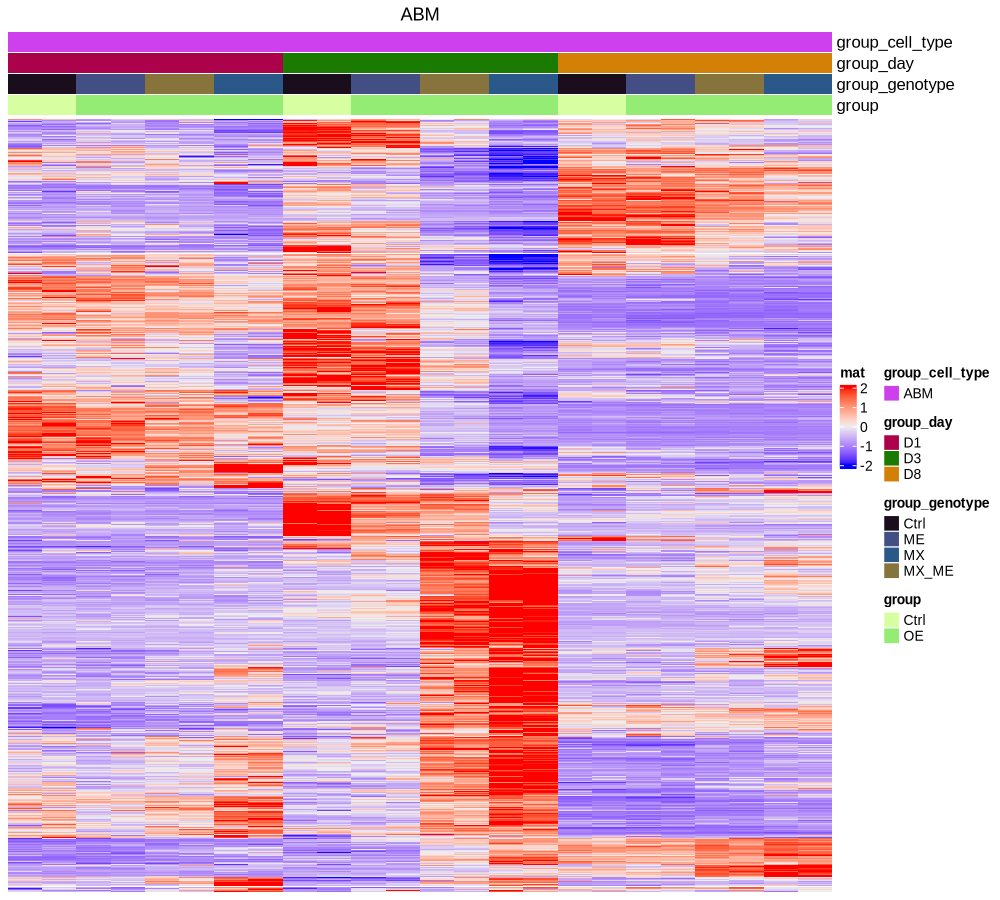

In [343]:
cmp2_sig_all = unique(c(cmp2_sig_abm_day1, cmp2_sig_abm_day3, cmp2_sig_abm_day8)) 
length(cmp2_sig_all)

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, ]
dim(mtx_norm_counts)

dsn_sel = dsn[group_cell_type == 'ABM', ]
dsn_sel = setDF(dsn_sel[, .(group_cell_type, group_day, group_genotype, group)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F)


In [695]:
tmp2 = rownames(mtx_norm_counts)
tmp2[grep('Cd70', tmp2)]

character(0)

[1] 12

[1]  9 48

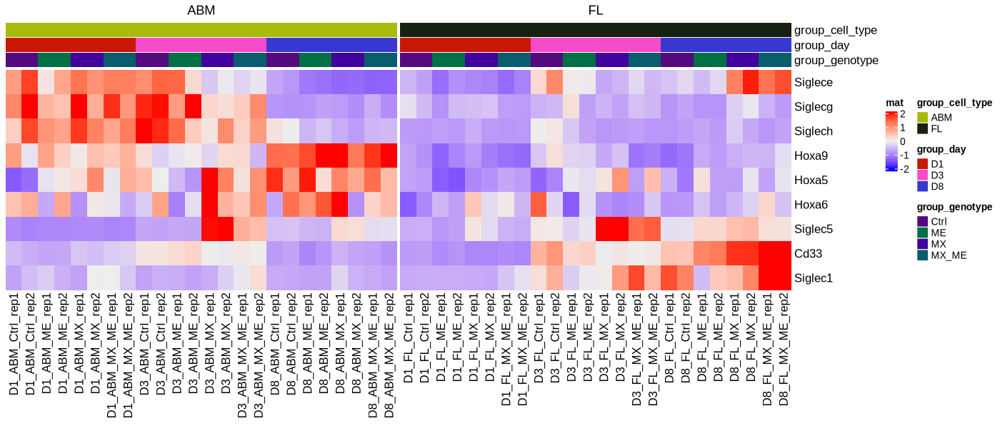

In [26]:
gene_sel = c('Siglec1', 'Siglec5', 'Siglece', 'Siglec6', 'Siglecg', 'Siglech', 'Cd70', 'Cd33', 'Hoxa5', 'Hoxb6', 'Hoxa6', 'Hoxa9')
length(gene_sel)

dsn_sel = copy(dsn[order(tag), ])
dsn_sel = setDF(dsn_sel[, .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
gene_sel = intersect(gene_sel, rownames(mtx_norm_counts))
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 14, repr.plot.height = 6, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = T, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F)


In [752]:
vs_ctrl_dt[rn %in% gene_sel, ][padj < 0.05, ][abs(log2FoldChange) > 1, ][grep('Hox', rn), ]


.id,rn,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,day,cell_type,genotype
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
res_d3_FL_me_ctrl,Hoxa5,23.05507,1.510615,0.5944347,2.541263,1.104528e-02,3.964931e-02,d3,FL,me
res_d1_FL_mx_ctrl,Hoxa6,10.95407,2.630917,1.0258948,2.564510,1.033217e-02,3.539724e-02,d1,FL,mx
res_d3_FL_mx_ctrl,Hoxa5,23.05507,2.068836,0.5784804,3.576328,3.484542e-04,1.019591e-03,d3,FL,mx
res_d3_FL_mx_ctrl,Hoxa6,10.95407,-2.165548,0.9379447,-2.308823,2.095340e-02,4.184634e-02,d3,FL,mx
res_d3_FL_mxme_ctrl,Hoxa5,23.05507,1.587942,0.5871588,2.704451,6.841740e-03,1.586062e-02,d3,FL,me
res_d3_FL_mxme_ctrl,Hoxa9,183.07180,-1.126480,0.2278768,-4.943372,7.678271e-07,3.313209e-06,d3,FL,me
res_d8_FL_mxme_ctrl,Hoxa9,183.07180,1.044082,0.2254973,4.630129,3.654374e-06,4.588929e-05,d8,FL,me
res_d1_ABM_me_ctrl,Hoxa5,23.05507,2.160332,0.7205546,2.998151,2.716230e-03,2.856499e-02,d1,ABM,me
res_d1_ABM_mx_ctrl,Hoxa5,23.05507,2.687623,0.7214215,3.725454,1.949642e-04,1.996361e-03,d1,ABM,mx


[1] 11

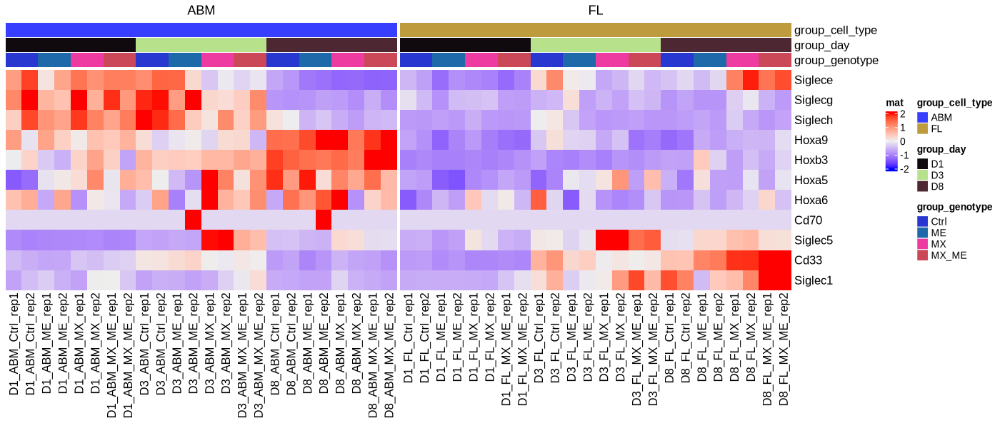

In [27]:
gene_sel = c('Siglec1', 'Siglec5', 'Siglece', 'Siglecg', 'Siglech', 'Cd70', 'Cd33', 'Hoxa5', 'Hoxb3', 'Hoxa6', 'Hoxa9')
length(gene_sel)

tmp = dsn[order(tag), ]
dsn_sel = setDF(tmp[, .(group_cell_type, group_day, group_genotype)], rownames = tmp$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds_all, normalized = T)
gene_sel = intersect(gene_sel, rownames(mtx_norm_counts))
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]

plotdat = scale_fun(mtx_norm_counts)
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 14, repr.plot.height = 6, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = T, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F)


[1] 11

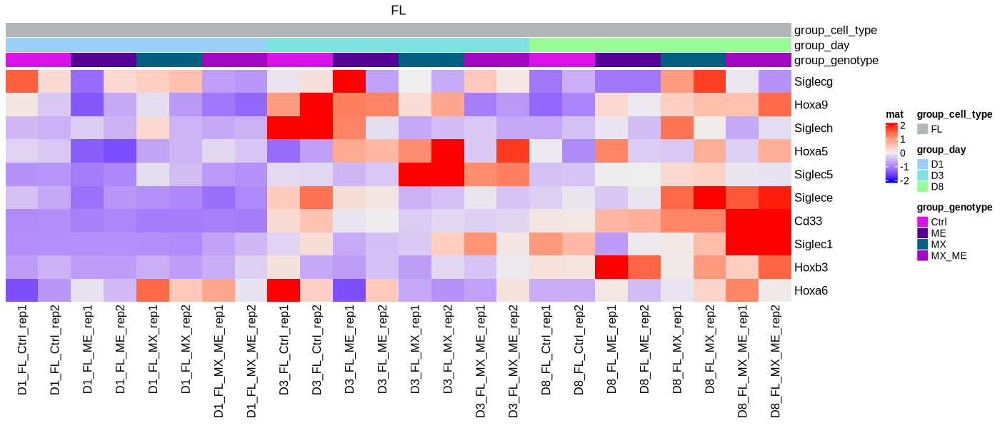

In [778]:
gene_sel = c('Siglec1', 'Siglec5', 'Siglece', 'Siglecg', 'Siglech', 'Cd70', 'Cd33', 'Hoxa5', 'Hoxb3', 'Hoxa6', 'Hoxa9')
length(gene_sel)

tmp = dsn[order(tag), ][group_cell_type == 'FL', ]
dsn_sel = setDF(tmp[, .(group_cell_type, group_day, group_genotype)], rownames = tmp$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds_all, normalized = T)
gene_sel = intersect(gene_sel, rownames(mtx_norm_counts))
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]

plotdat = scale_fun(mtx_norm_counts)
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 14, repr.plot.height = 6, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = T, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F)


## add together  2

[1] 60 48

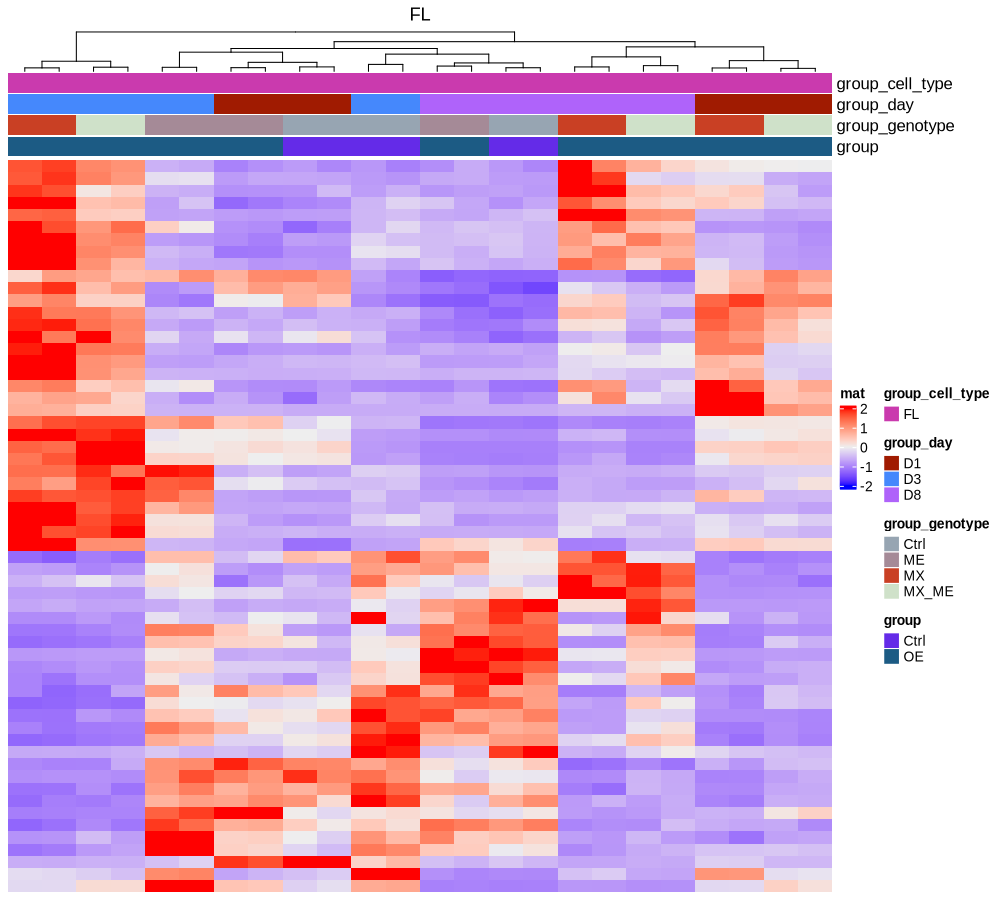

In [279]:
tmp1 = intersect(cmp2_sig_fl_day3, cmp2_sig_fl_day8)
tmp2 = intersect(cmp2_sig_abm_day3, cmp2_sig_abm_day8)
tmp3 = intersect(tmp1, tmp2)
cmp2_sig_all = tmp3

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, ]
dim(mtx_norm_counts)

dsn_sel = dsn[group_cell_type == 'FL', ]
dsn_sel = setDF(dsn_sel[, .(group_cell_type, group_day, group_genotype, group)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 
plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = F, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = T)


[1] 5222    8

Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."
Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


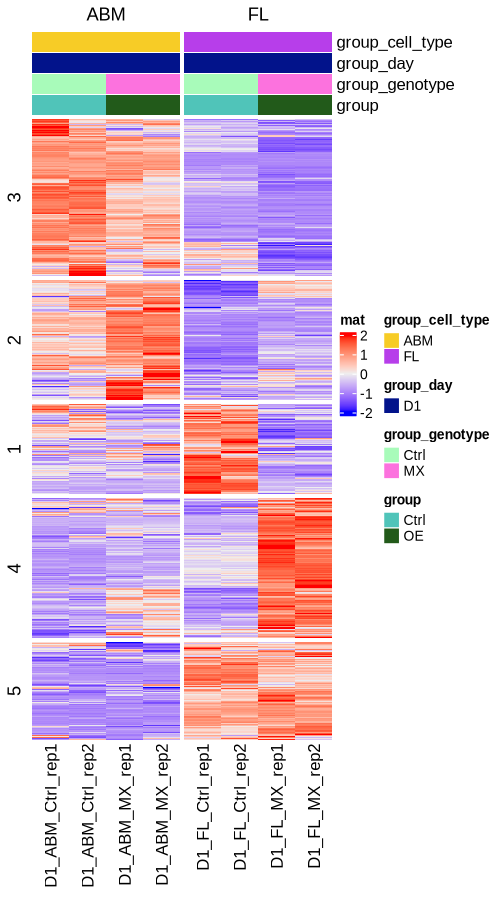

In [517]:
tmp1 = c(cmp2_sig_fl_day1, cmp2_sig_fl_day3, cmp2_sig_fl_day8)
tmp2 = c(cmp2_sig_abm_day1, cmp2_sig_abm_day3, cmp2_sig_abm_day8)
tmp3 = c(tmp1, tmp2)
cmp2_sig_all = tmp3

dsn_sel = dsn[group_genotype %in% c('Ctrl', 'MX') & group_day == 'D1', ]
dsn_sel = setDF(dsn_sel[, .(group_cell_type, group_day, group_genotype, group)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 5, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
ht_d1 = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, km = 5)
ht_d1

d1_up = rownames(plotdat)[row_order(ht_d1)[['4']]]
d1_dn = rownames(plotdat)[row_order(ht_d1)[['1']]]


[1] 5222    8

Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."
Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


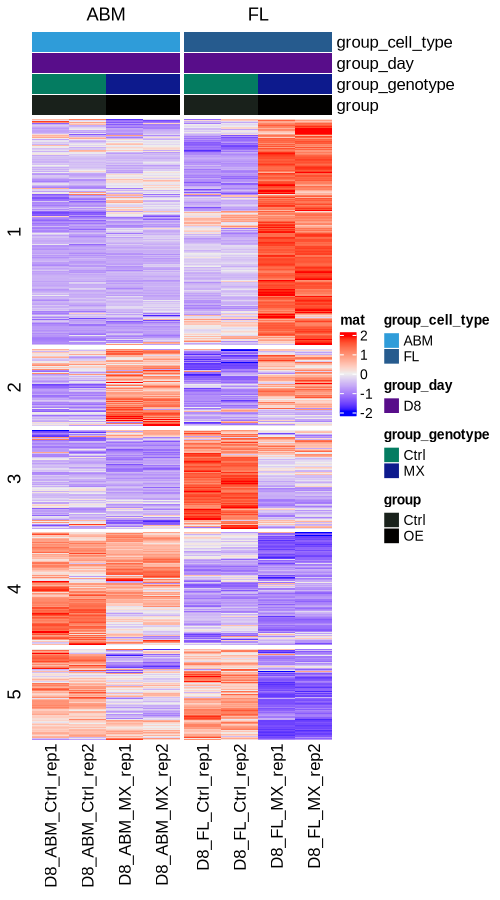

In [521]:
tmp1 = c(cmp2_sig_fl_day1, cmp2_sig_fl_day3, cmp2_sig_fl_day8)
tmp2 = c(cmp2_sig_abm_day1, cmp2_sig_abm_day3, cmp2_sig_abm_day8)
tmp3 = c(tmp1, tmp2)
cmp2_sig_all = tmp3

dsn_sel = dsn[group_genotype %in% c('Ctrl', 'MX') & group_day == 'D8', ]
dsn_sel = setDF(dsn_sel[, .(group_cell_type, group_day, group_genotype, group)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 5, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
ht_d8 = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, km = 5)
ht_d8

d8_up = rownames(plotdat)[row_order(ht_d1)[['1']]]
d8_dn = rownames(plotdat)[row_order(ht_d1)[['3']]]


[1] 5222    8

Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."
Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


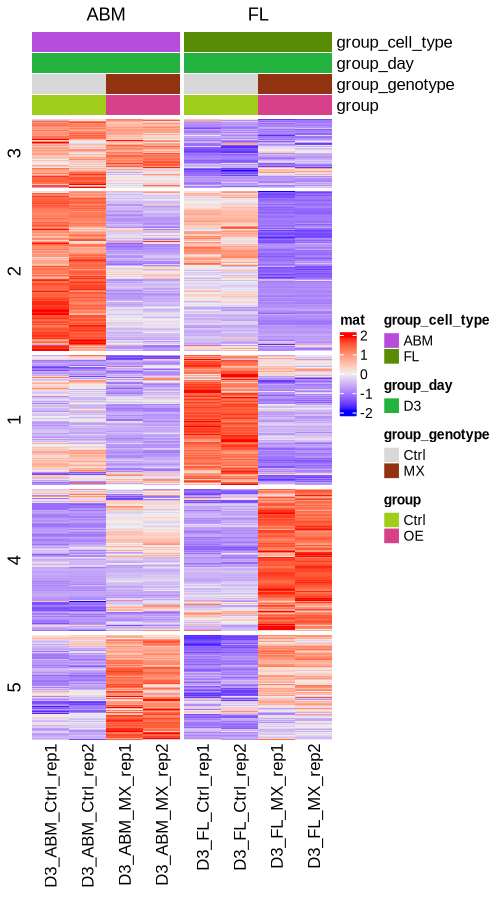

In [519]:
tmp1 = c(cmp2_sig_fl_day1, cmp2_sig_fl_day3, cmp2_sig_fl_day8)
tmp2 = c(cmp2_sig_abm_day1, cmp2_sig_abm_day3, cmp2_sig_abm_day8)
tmp3 = c(tmp1, tmp2)
cmp2_sig_all = tmp3

dsn_sel = dsn[group_genotype %in% c('Ctrl', 'MX') & group_day == 'D3', ]
dsn_sel = setDF(dsn_sel[, .(group_cell_type, group_day, group_genotype, group)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[cmp2_sig_all, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 5, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
ht_d3 = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, km = 5)
ht_d3

d3_up = rownames(plotdat)[row_order(ht_d1)[['4']]]
d3_dn = rownames(plotdat)[row_order(ht_d1)[['1']]]


In [532]:
fl_updn = list(d8_up = d8_up, d8_dn = d8_dn, 
               d3_up = d3_up, d3_dn = d3_dn, 
               d1_up = d1_up, d1_dn = d1_dn)
lapply(fl_updn, length)
saveRDS(fl_updn, file = 'data/fl_updn.rds')


$d8_up
[1] 781

$d8_dn
[1] 1359

$d3_up
[1] 1216

$d3_dn
[1] 781

$d1_up
[1] 1208

$d1_dn
[1] 781

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


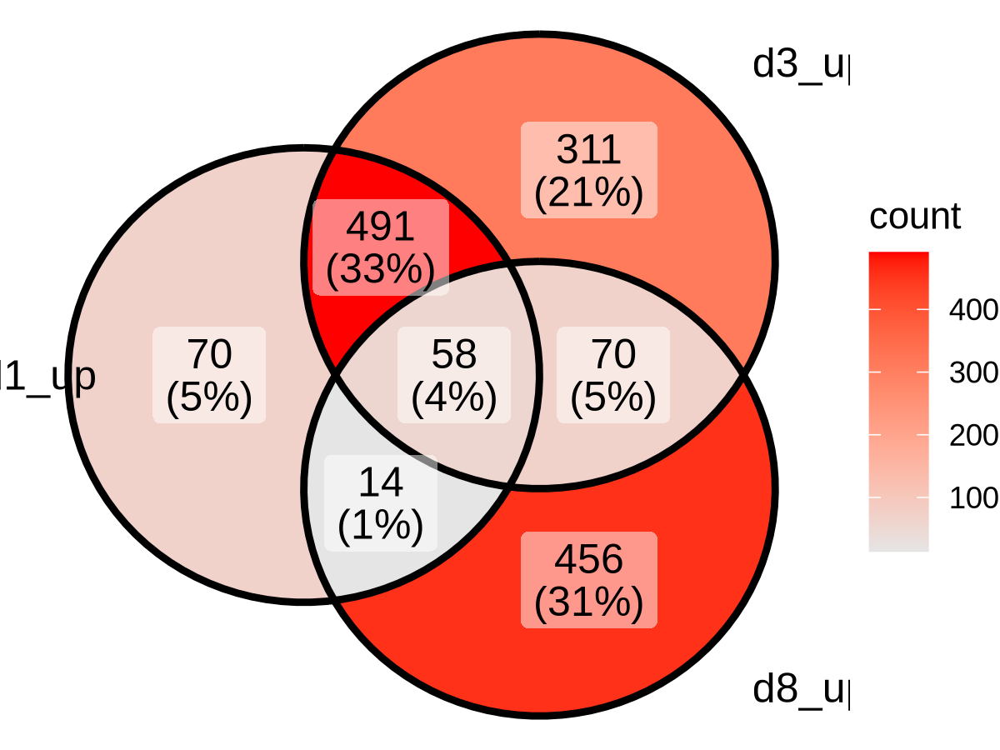

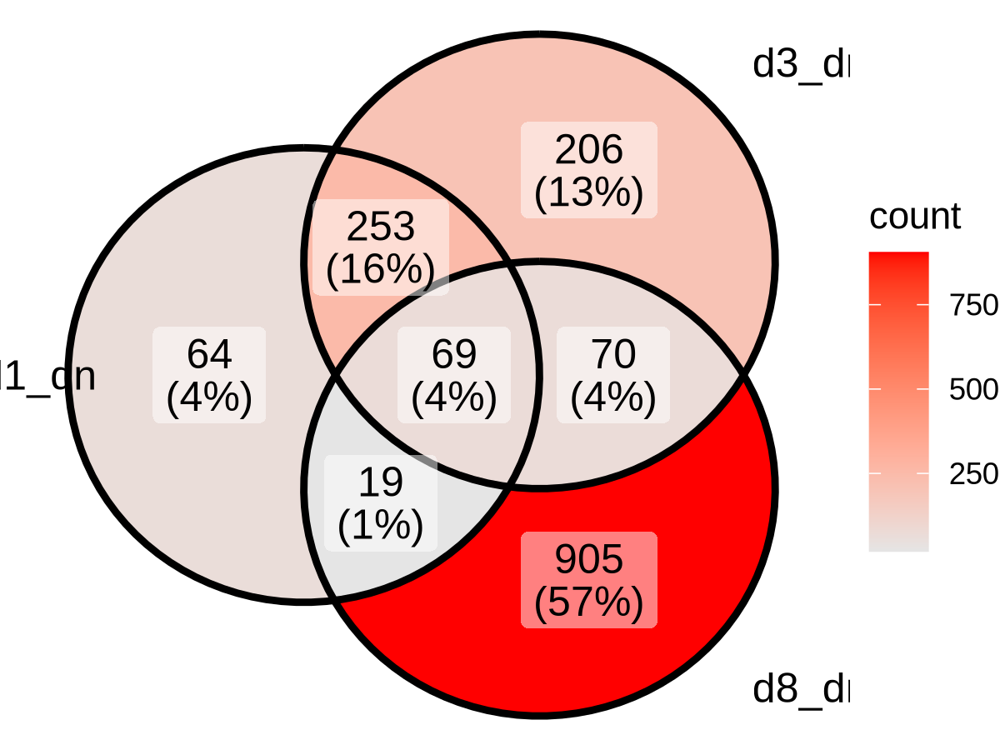

In [536]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)

xx = list(d8_up = d8_up, d3_up = d3_up, d1_up = d1_up)
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red") + coord_flip()

xx = list(d8_dn = d8_dn, d3_dn = d3_dn, d1_dn = d1_dn)
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red") + coord_flip()


[1] 2225   24

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



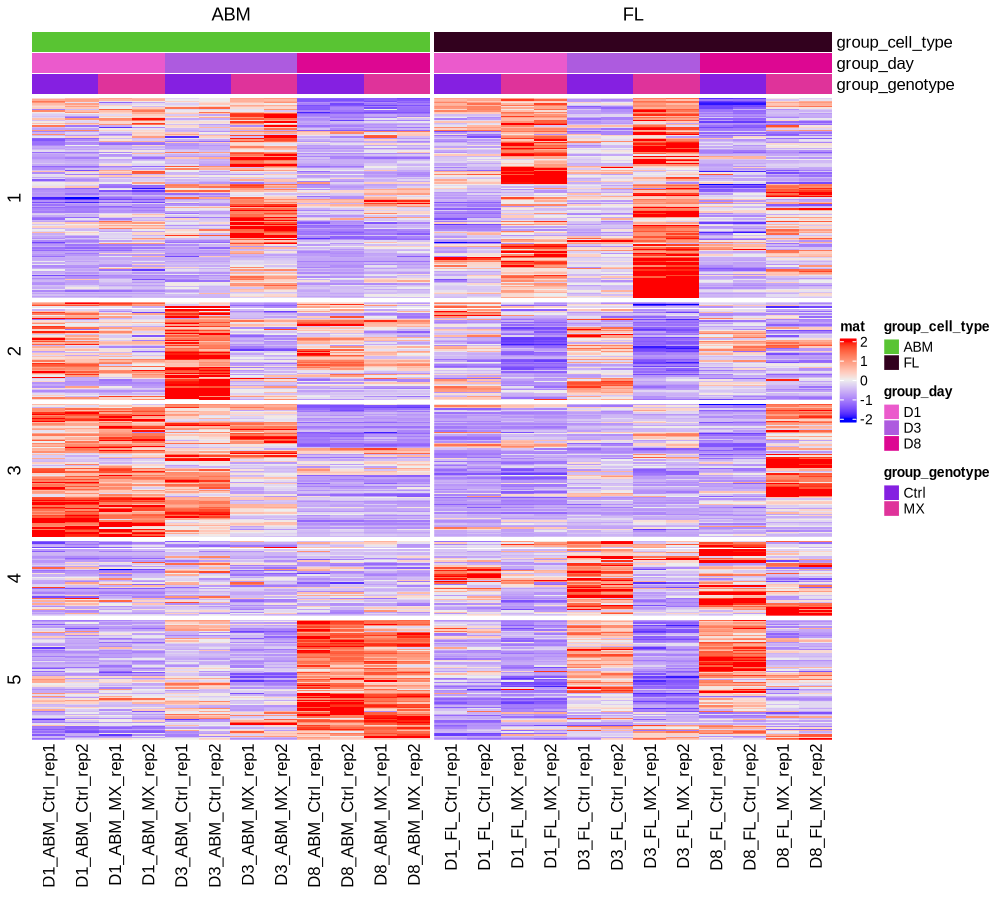

In [572]:
xx = unique(unlist(list(d8_up = d8_up, d3_up = d3_up, d1_up = d1_up, d8_dn = d8_dn, d3_dn = d3_dn, d1_dn = d1_dn)))

dsn_sel = dsn[group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel = setDF(dsn_sel[, .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[xx, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
ht_updn = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, km = 5)
ht_updn


#
# over-representation test
#
#...@organism 	 Mus musculus 
#...@ontology 	 MF 
#...@keytype 	 SYMBOL 
#...@gene 	 chr [1:549] "Fbxo44" "Cfb" "Ralgps1" "Mdk" "Arrdc2" "AA413626" "Dusp2" ...
#...pvalues adjusted by 'BH' with cutoff <0.01 
#...34 enriched terms found
'data.frame':	34 obs. of  9 variables:
 $ ID         : chr  "GO:0050839" "GO:0003779" "GO:0005178" "GO:0004725" ...
 $ Description: chr  "cell adhesion molecule binding" "actin binding" "integrin binding" "protein tyrosine phosphatase activity" ...
 $ GeneRatio  : chr  "22/501" "27/501" "13/501" "10/501" ...
 $ BgRatio    : chr  "306/28407" "448/28407" "153/28407" "92/28407" ...
 $ pvalue     : num  3.27e-08 3.76e-08 3.48e-06 5.27e-06 1.03e-05 ...
 $ p.adjust   : num  0.000014 0.000014 0.000866 0.000984 0.001232 ...
 $ qvalue     : num  1.04e-05 1.04e-05 6.41e-04 7.28e-04 9.12e-04 ...
 $ geneID     : chr  "Itgae/Tcam1/Cdh24/Isg15/Obscn/Cx3cl1/Lama5/Slc6a4/Src/Jup/F11r/Ptprf/Kdr/Itgal/Itgax/Actn1/Kirrel3/Bcam/Fgfr1/Esam/Olfm

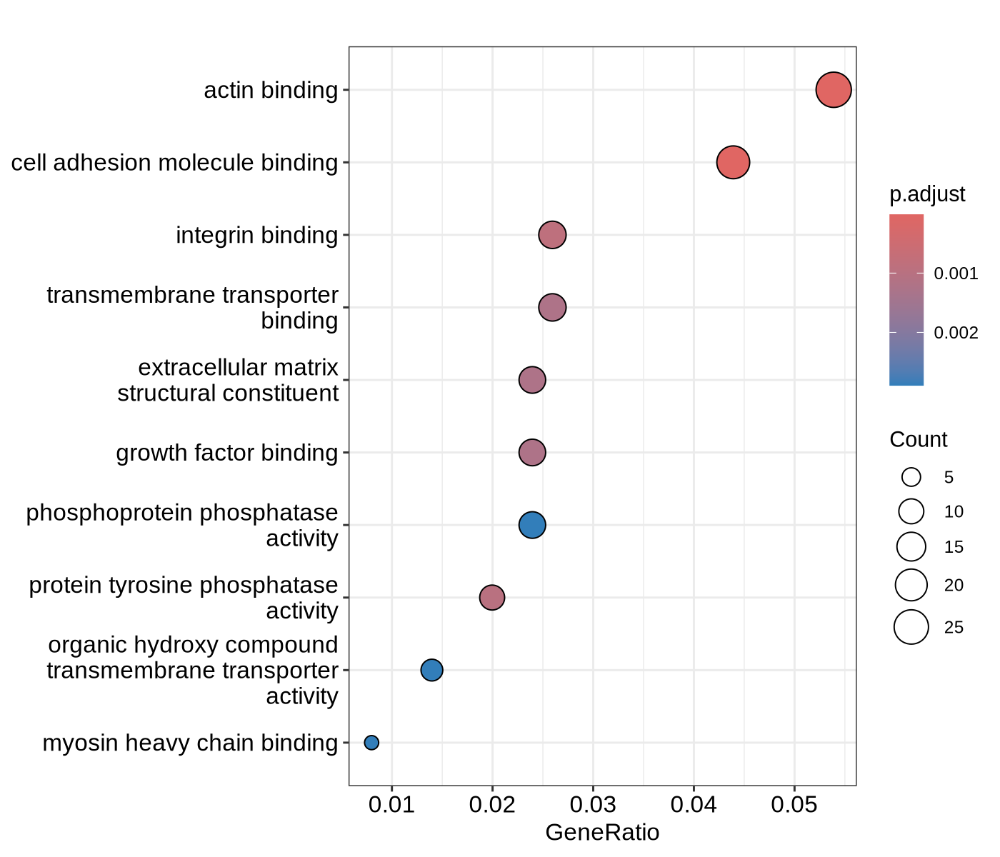

In [540]:
xx = intersect(d1_up, d3_up)
#xx = intersect(d1_up, intersect(d8_up, d3_up))
#ov = intersect(xx$FL, xx$ABM)
yy <- enrichGO(xx, 'org.Mm.eg.db', ont="MF", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
yy
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)

# One of "MF", "BP", and "CC" subontologies.


## FL day3 for MA PLOT

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12993

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message:
"Removed 12916 rows containing missing values (`geom_text_repel()`)."
Warning message:
"ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


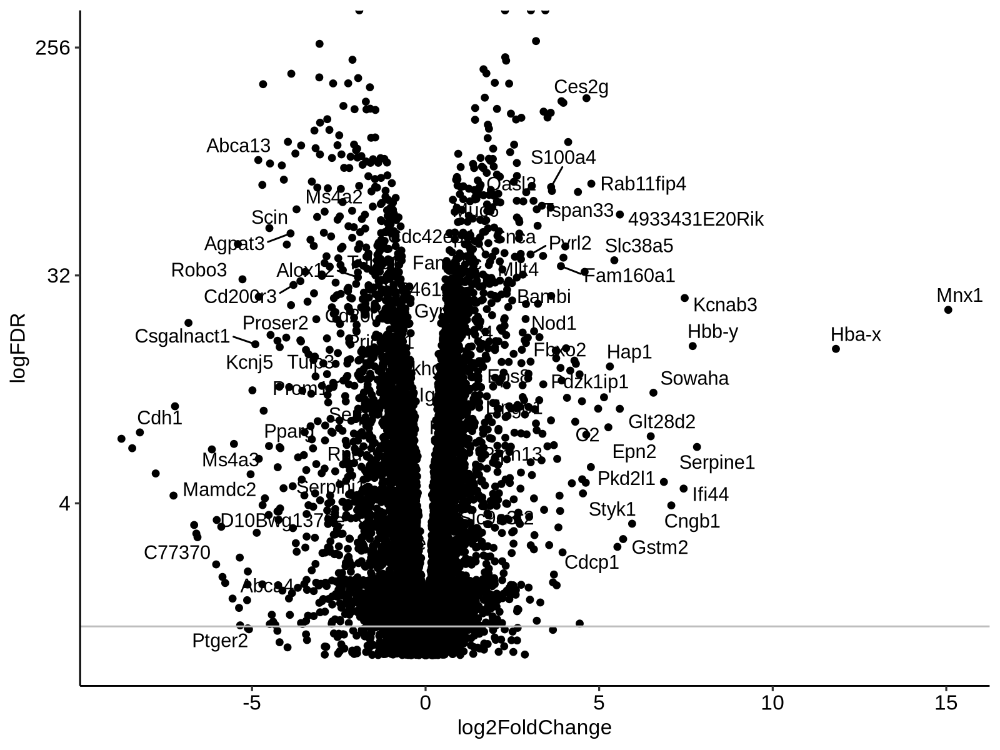

In [304]:
# tmp1 = intersect(cmp2_sig_fl_day1, intersect(cmp2_sig_fl_day3, cmp2_sig_fl_day8))
# tmp2 = intersect(cmp2_sig_fl_day1, intersect(cmp2_sig_abm_day3, cmp2_sig_abm_day8))

tmp1 = intersect(cmp2_sig_fl_day3, cmp2_sig_fl_day8)
tmp2 = intersect(cmp2_sig_abm_day3, cmp2_sig_abm_day8)
tmp3 = intersect(tmp1, tmp2)

dsn_sel = dsn[group_day == 'D3', ][group_cell_type == 'FL', ][group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_sel <- DESeq(dds_sel)
res = as.data.table(results(dds_sel) , keep.rownames = T)

options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)
plotdat = copy(res)
plotdat[rn %in% tmp3 & padj < 0.05 & abs(log2FoldChange) > 1, lbl := rn]
plotdat[log2FoldChange > 5 & padj < 0.05, lbl := rn]
plotdat[, logFDR := -log(padj, 10)] 
plotdat[logFDR < 1, logFDR := plotdat[logFDR < 1, logFDR] + 1]
ggplot(plotdat, aes(log2FoldChange, logFDR, label = lbl)) + geom_point() + theme_pubr() +
geom_hline(yintercept = -log(0.05, 10), color = 'grey') + geom_text_repel() + scale_y_continuous(trans = 'log2')



Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12899

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"
Warning message:
"Removed 12886 rows containing missing values (`geom_text_repel()`)."


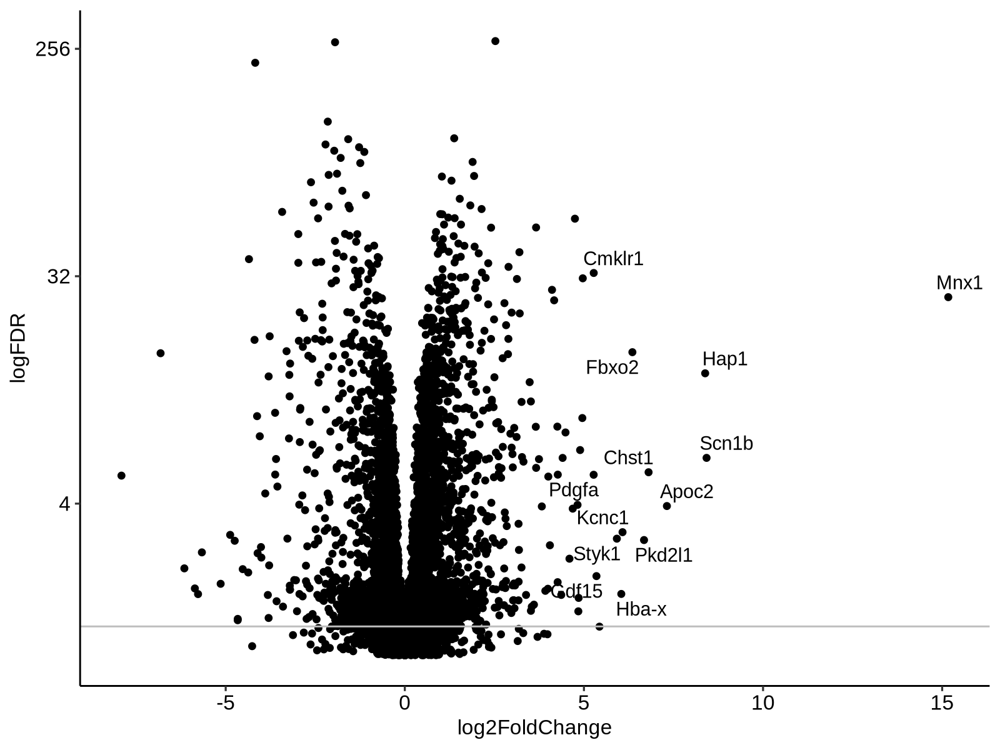

In [269]:
dsn_sel = dsn[group_day == 'D1', ][group_cell_type == 'FL', ][group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_sel <- DESeq(dds_sel)
res = as.data.table(results(dds_sel) , keep.rownames = T)

options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)
plotdat = copy(res)
plotdat[log2FoldChange < -10, lbl := rn]
plotdat[log2FoldChange > 5 & padj < 0.05, lbl := rn]
plotdat[, logFDR := -log(padj, 10)] 
plotdat[logFDR < 1, logFDR := plotdat[logFDR < 1, logFDR] + 1]
ggplot(plotdat, aes(log2FoldChange, logFDR, label = lbl)) + geom_point() + theme_pubr() +
geom_hline(yintercept = -log(0.05, 10), color = 'grey') + geom_text_repel() + scale_y_continuous(trans = 'log2')


## pathways enrichGO

In [ ]:
#ov = intersect(xx$FL, xx$ABM)
diff = setdiff(xx$FL, xx$ABM)
yy <- enrichGO(ov, 'org.Mm.eg.db', ont="CC", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
yy
# One of "MF", "BP", and "CC" subontologies.


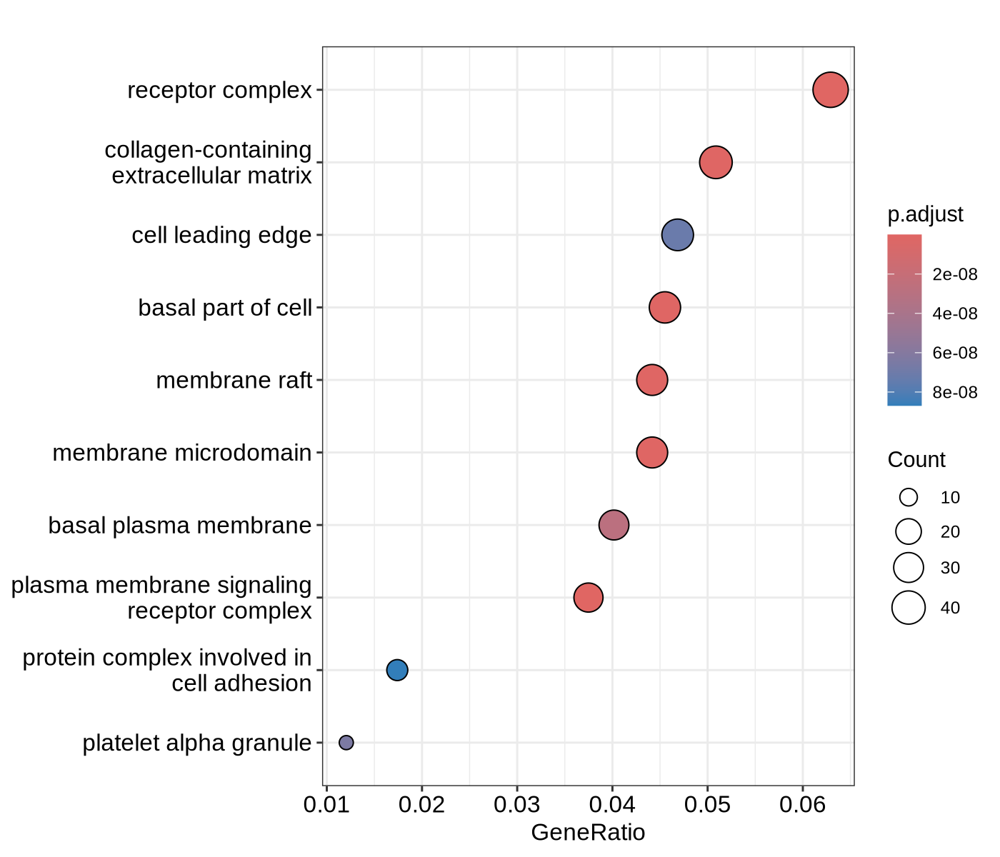

In [429]:
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)


## pathways GSEA

In [95]:
head(vs_ctrl_dt)
plotdat = vs_ctrl_dt[day == 'd3' & cell_type == 'FL' & genotype == 'mx', ]
nrow(plotdat)

.id,rn,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,day,cell_type,genotype
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
res_d1_FL_me_ctrl,0610005C13Rik,9.59956,1.50475835,0.84143923,1.7883150,0.07372521,0.3664920,d1,FL,me
res_d1_FL_me_ctrl,0610007P14Rik,376.75952,-0.20577531,0.18578074,-1.1076246,0.26802399,0.6663250,d1,FL,me
res_d1_FL_me_ctrl,0610009B22Rik,72.61005,0.12566146,0.34205861,0.3673682,0.71334439,0.9296093,d1,FL,me
res_d1_FL_me_ctrl,0610009L18Rik,25.25928,0.55278433,0.61719486,0.8956399,0.37044513,0.7533990,d1,FL,me
res_d1_FL_me_ctrl,0610009O20Rik,599.32294,-0.15580559,0.10350388,-1.5053116,0.13224399,0.4928538,d1,FL,me
res_d1_FL_me_ctrl,0610010F05Rik,993.26564,0.03853159,0.09458321,0.4073830,0.68372672,0.9172559,d1,FL,me


[1] 13135

$HALLMARK_ADIPOGENESIS
  [1] "Abca1"    "Abcb8"    "Acaa2"    "Acadl"    "Acadm"    "Acads"   
  [7] "Acly"     "Aco2"     "Acox1"    "Adcy6"    "Adig"     "Adipoq"  
 [13] "Adipor2"  "Agpat3"   "Aifm1"    "Ak2"      "Aldh2"    "Aldoa"   
 [19] "Angpt1"   "Angptl4"  "Aplp2"    "Apoe"     "Araf"     "Arl4a"   
 [25] "Atl2"     "Atp1b3"   "Atp5o"    "Baz2a"    "Bckdha"   "Bcl2l13" 
 [31] "Bcl6"     "C3"       "Cat"      "Cavin1"   "Cavin2"   "Ccng2"   
 [37] "Cd151"    "Cd302"    "Cd36"     "Cdkn2c"   "Chchd10"  "Chuk"    
 [43] "Cidea"    "Cmbl"     "Cmpk1"    "Col15a1"  "Col4a1"   "Coq3"    
 [49] "Coq5"     "Coq9"     "Cox6a1"   "Cox7b"    "Cox8a"    "Cpt2"    
 [55] "Crat"     "Cs"       "Cyc1"     "Cyp4b1"   "Dbt"      "Ddt"     
 [61] "Decr1"    "Dgat1"    "Dhcr7"    "Dhrs7"    "Dhrs7b"   "Dlat"    
 [67] "Dld"      "Dnajb9"   "Dnajc15"  "Dram2"    "Ech1"     "Echs1"   
 [73] "Elmod3"   "Elovl6"   "Enpp2"    "Ephx2"    "Esrra"    "Esyt1"   
 [79] "Etfb"     "Fabp4"    "Fah"      "Fzd4"     "G3bp2"    "Gadd45a" 
 [85] "Gbe1"     "Ghitm"    "Gpam"     "Gpat4"    "Gpd2"     "Gphn"    
 [91] "Gpx3"     "Gpx4"     "Grpel1"   "Hadh"     "Hibch"    "Hspb8"   
 [97] "Idh1"     "Idh3a"    "Idh3g"    "Ifngr1"   "Immt"     "Itga7"   
[103] "Itih5"    "Itsn1"    "Jagn1"    "Lama4"    "Lep"      "Lifr"    
[109] "Lipe"     "Lpcat3"   "Lpl"      "Ltc4s"    "Map4k3"   "Mccc1"   
[115] "Mdh2"     "Me1"      "Mgll"     "Mgst3"    "Miga2"    "Mrap"    
[121] "Mrpl15"   "Mtarc2"   "Mtch2"    "Mylk"     "Nabp1"    "Ndufa5"  
[127] "Ndufab1"  "Ndufb7"   "Ndufs3"   "Nkiras1"  "Nmt1"     "Omd"     
[133] "Orm1"     "Pdcd4"    "Pemt"     "Pex14"    "Pfkfb3"   "Pfkl"    
[139] "Pgm1"     "Phldb1"   "Phyh"     "Pim3"     "Plin2"    "Por"     
[145] "Pparg"    "Ppm1b"    "Ppp1r15b" "Prdx3"    "Preb"     "Ptcd3"   
[151] "Ptger3"   "Qdpr"     "Rab34"    "Reep5"    "Reep6"    "Retn"    
[157] "Retsat"   "Riok3"    "Rmdn3"    "Rnf11"    "Rreb1"    "Rtn3"    
[163] "Samm50"   "Scarb1"   "Scp2"     "Sdhb"     "Sdhc"     "Slc19a1" 
[169] "Slc1a5"   "Slc25a1"  "Slc25a10" "Slc27a1"  "Slc5a6"   "Pqlc3"   
[175] "Sncg"     "Sod1"     "Sorbs1"   "Sowahc"   "Sparcl1"  "Sqor"    
[181] "Sspn"     "Stat5a"   "Stom"     "Suclg1"   "Sult1a1"  "Taldo1"  
[187] "Tank"     "Tkt"      "Tob1"     "Tst"      "Ubc"      "Ubqln1"  
[193] "Uck1"     "Ucp2"     "Uqcr10"   "Uqcr11"   "Uqcrc1"   "Uqcrq"   
[199] "Vegfb"    "Ywhag"

pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_HEME_METABOLISM,6.529601e-06,0.0003264801,0.6105269,0.8684863,1.752136,177,"Ermap, A...."
HALLMARK_FATTY_ACID_METABOLISM,4.129140e-04,0.0103228489,0.4984931,0.8296036,1.602398,129,"Cpox, Al...."
HALLMARK_COAGULATION,1.359078e-03,0.0226512944,0.4550599,-0.8811573,-1.553209,88,"Thbs1, P...."
HALLMARK_UNFOLDED_PROTEIN_RESPONSE,1.964496e-03,0.0245561938,0.4317077,-0.8525497,-1.528361,106,"Atf4, Ch...."
HALLMARK_INTERFERON_ALPHA_RESPONSE,6.538321e-03,0.0653832092,0.4070179,0.8246480,1.540793,88,Lgals3bp....
HALLMARK_ALLOGRAFT_REJECTION,1.171790e-02,0.0953026095,0.3807304,-0.7608717,-1.402333,147,"Pf4, Ptp...."


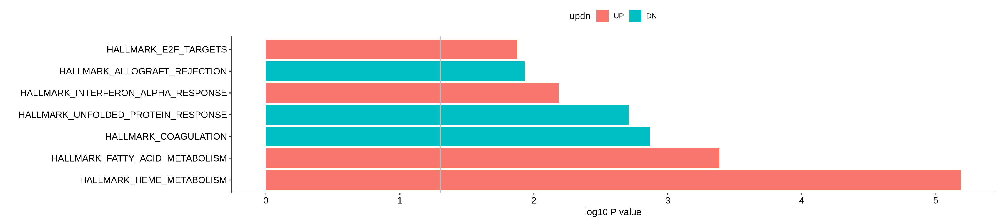

In [112]:
plotdat = vs_ctrl_dt[day == 'd3' & cell_type == 'FL' & genotype == 'mx', ]
plotdat[, ranking := -log2FoldChange*log10(padj)]
r_top = max(plotdat$ranking[is.finite(plotdat$ranking)])
r_bot = min(plotdat$ranking[is.finite(plotdat$ranking)])
xx = plotdat[ranking > r_top, ]
plotdat[ranking > r_top, ranking := r_top + 1:nrow(xx)]
xx = plotdat[ranking < r_bot, ]
plotdat[ranking < r_bot, ranking := r_bot - 1:nrow(xx)]
xx = plotdat[!is.na(ranking), ] 
ranked = plotdat$ranking
names(ranked) = plotdat$rn
ranked = sort(ranked, decreasing = TRUE)

#pathwaysDF <- msigdbr(species = "Mus musculus", category="C7") #, subcategory = 'IMMUNESIGDB') 
pathwaysDF <- msigdbr(species = "Mus musculus", category="C7") #, subcategory = 'VAX') 
pathwaysDF <- msigdbr(species = "Mus musculus", category="H") #, subcategory = 'immunesigdb') 
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)
pathways[1]

fgsea <- fgsea(pathways = pathways, stats = ranked, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log(pval, 10)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 

options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + geom_hline(yintercept = -log(0.05, 10), color = 'grey')  + ylab('log10 P value') + xlab('')


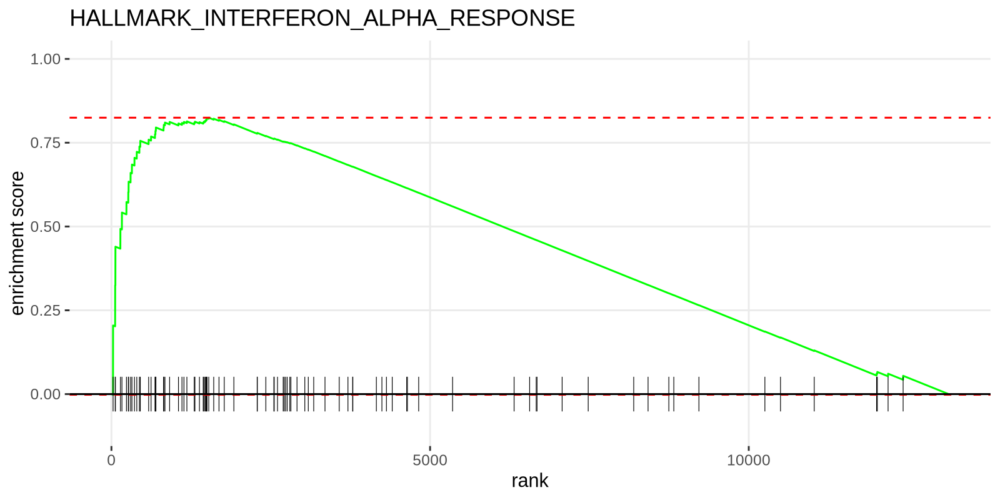

In [98]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 200)
plotEnrichment(pathway = pathways[['HALLMARK_INTERFERON_ALPHA_RESPONSE']], ranked) + 
  labs(title = 'HALLMARK_INTERFERON_ALPHA_RESPONSE') + ylim(-0.1, 1)


$HALLMARK_ADIPOGENESIS
  [1] "Abca1"    "Abcb8"    "Acaa2"    "Acadl"    "Acadm"    "Acads"   
  [7] "Acly"     "Aco2"     "Acox1"    "Adcy6"    "Adig"     "Adipoq"  
 [13] "Adipor2"  "Agpat3"   "Aifm1"    "Ak2"      "Aldh2"    "Aldoa"   
 [19] "Angpt1"   "Angptl4"  "Aplp2"    "Apoe"     "Araf"     "Arl4a"   
 [25] "Atl2"     "Atp1b3"   "Atp5o"    "Baz2a"    "Bckdha"   "Bcl2l13" 
 [31] "Bcl6"     "C3"       "Cat"      "Cavin1"   "Cavin2"   "Ccng2"   
 [37] "Cd151"    "Cd302"    "Cd36"     "Cdkn2c"   "Chchd10"  "Chuk"    
 [43] "Cidea"    "Cmbl"     "Cmpk1"    "Col15a1"  "Col4a1"   "Coq3"    
 [49] "Coq5"     "Coq9"     "Cox6a1"   "Cox7b"    "Cox8a"    "Cpt2"    
 [55] "Crat"     "Cs"       "Cyc1"     "Cyp4b1"   "Dbt"      "Ddt"     
 [61] "Decr1"    "Dgat1"    "Dhcr7"    "Dhrs7"    "Dhrs7b"   "Dlat"    
 [67] "Dld"      "Dnajb9"   "Dnajc15"  "Dram2"    "Ech1"     "Echs1"   
 [73] "Elmod3"   "Elovl6"   "Enpp2"    "Ephx2"    "Esrra"    "Esyt1"   
 [79] "Etfb"     "Fabp4"    "Fah"      "Fzd4"     "G3bp2"    "Gadd45a" 
 [85] "Gbe1"     "Ghitm"    "Gpam"     "Gpat4"    "Gpd2"     "Gphn"    
 [91] "Gpx3"     "Gpx4"     "Grpel1"   "Hadh"     "Hibch"    "Hspb8"   
 [97] "Idh1"     "Idh3a"    "Idh3g"    "Ifngr1"   "Immt"     "Itga7"   
[103] "Itih5"    "Itsn1"    "Jagn1"    "Lama4"    "Lep"      "Lifr"    
[109] "Lipe"     "Lpcat3"   "Lpl"      "Ltc4s"    "Map4k3"   "Mccc1"   
[115] "Mdh2"     "Me1"      "Mgll"     "Mgst3"    "Miga2"    "Mrap"    
[121] "Mrpl15"   "Mtarc2"   "Mtch2"    "Mylk"     "Nabp1"    "Ndufa5"  
[127] "Ndufab1"  "Ndufb7"   "Ndufs3"   "Nkiras1"  "Nmt1"     "Omd"     
[133] "Orm1"     "Pdcd4"    "Pemt"     "Pex14"    "Pfkfb3"   "Pfkl"    
[139] "Pgm1"     "Phldb1"   "Phyh"     "Pim3"     "Plin2"    "Por"     
[145] "Pparg"    "Ppm1b"    "Ppp1r15b" "Prdx3"    "Preb"     "Ptcd3"   
[151] "Ptger3"   "Qdpr"     "Rab34"    "Reep5"    "Reep6"    "Retn"    
[157] "Retsat"   "Riok3"    "Rmdn3"    "Rnf11"    "Rreb1"    "Rtn3"    
[163] "Samm50"   "Scarb1"   "Scp2"     "Sdhb"     "Sdhc"     "Slc19a1" 
[169] "Slc1a5"   "Slc25a1"  "Slc25a10" "Slc27a1"  "Slc5a6"   "Pqlc3"   
[175] "Sncg"     "Sod1"     "Sorbs1"   "Sowahc"   "Sparcl1"  "Sqor"    
[181] "Sspn"     "Stat5a"   "Stom"     "Suclg1"   "Sult1a1"  "Taldo1"  
[187] "Tank"     "Tkt"      "Tob1"     "Tst"      "Ubc"      "Ubqln1"  
[193] "Uck1"     "Ucp2"     "Uqcr10"   "Uqcr11"   "Uqcrc1"   "Uqcrq"   
[199] "Vegfb"    "Ywhag"

pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_COAGULATION,0.0006059402,0.03029701,0.4772708,-0.9175502,-1.505861,88,"Timp3, T...."
HALLMARK_COMPLEMENT,0.1350482315,0.72072072,0.1511488,-0.7335681,-1.246528,149,"Pik3cg, ...."
HALLMARK_E2F_TARGETS,0.0891364903,0.72072072,0.2529611,0.6385149,1.269819,193,"Mybl2, N...."
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,0.1237623762,0.72072072,0.1608014,-0.7722434,-1.273868,113,"Timp3, T...."
HALLMARK_ESTROGEN_RESPONSE_EARLY,0.1322751323,0.72072072,0.1999152,0.6536512,1.254825,152,"Tgm2, Cb...."
HALLMARK_G2M_CHECKPOINT,0.0826486929,0.72072072,0.2878051,0.6685208,1.323442,184,"Mt2, E2f...."


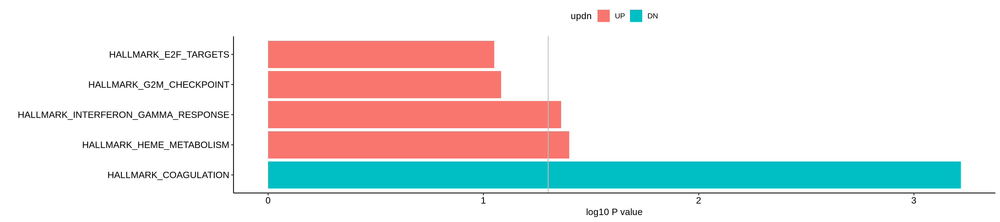

In [115]:
plotdat = vs_ctrl_dt[day == 'd3' & cell_type == 'ABM' & genotype == 'mx', ]
plotdat[, ranking := -log2FoldChange*log10(padj)]
r_top = max(plotdat$ranking[is.finite(plotdat$ranking)])
r_bot = min(plotdat$ranking[is.finite(plotdat$ranking)])
xx = plotdat[ranking > r_top, ]
plotdat[ranking > r_top, ranking := r_top + 1:nrow(xx)]
xx = plotdat[ranking < r_bot, ]
plotdat[ranking < r_bot, ranking := r_bot - 1:nrow(xx)]
xx = plotdat[!is.na(ranking), ] 
ranked = plotdat$ranking
names(ranked) = plotdat$rn
ranked = sort(ranked, decreasing = TRUE)

#pathwaysDF <- msigdbr(species = "Mus musculus", category="C7") #, subcategory = 'IMMUNESIGDB') 
pathwaysDF <- msigdbr(species = "Mus musculus", category="C7") #, subcategory = 'VAX') 
pathwaysDF <- msigdbr(species = "Mus musculus", category="H") #, subcategory = 'immunesigdb') 
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)
pathways[1]

fgsea <- fgsea(pathways = pathways, stats = ranked, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log(pval, 10)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[order(pval), ][1:5, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 

options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + geom_hline(yintercept = -log(0.05, 10), color = 'grey')  + ylab('log10 P value') + xlab('')


Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."


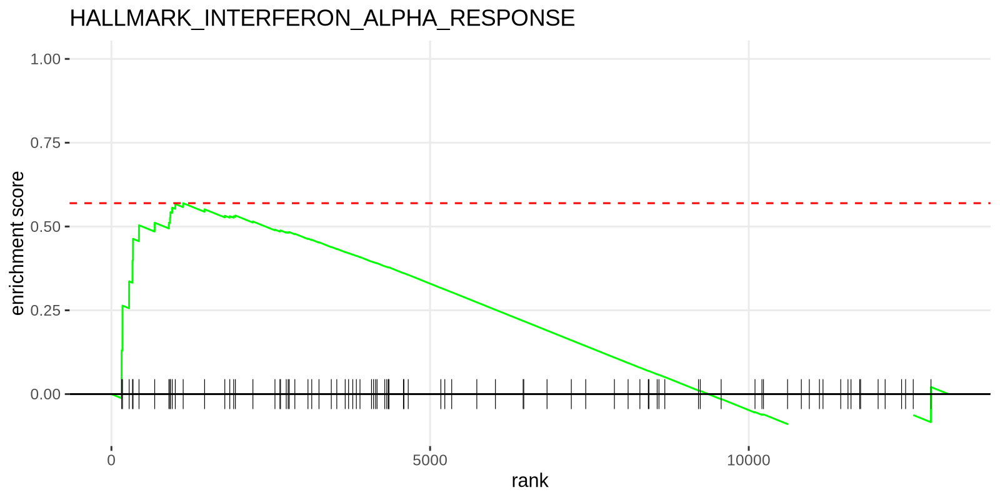

In [100]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 200)
plotEnrichment(pathway = pathways[['HALLMARK_INTERFERON_ALPHA_RESPONSE']], ranked) + 
  labs(title = 'HALLMARK_INTERFERON_ALPHA_RESPONSE') + ylim(-0.1, 1)


Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12993

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


$ANDERSON_BLOOD_CN54GP140_ADJUVANTED_WITH_GLA_AF_AGE_18_45YO_1DY_DN
 [1] "Acd"      "Acly"     "Aco2"     "Actb"     "Add1"     "Aff4"    
 [7] "Antxr2"   "Arap1"    "Arf1"     "Arf3"     "Arhgap1"  "Arhgap30"
[13] "Arid3a"   "Arpc4"    "Atp6ap1"  "Atp6v1b2" "Babam2"   "Banp"    
[19] "Cacna1s"  "Cap1"     "Cbl"      "Clasp1"   "Crebbp"   "Ctcf"    
[25] "Dpep2"    "Dpf2"     "Dpp8"     "Dvl3"     "Fbxl18"   "Flii"    
[31] "Foxj3"    "Fra10ac1" "Galnt10"  "Gba"      "Grk2"     "Grk6"    
[37] "Hars2"    "Hgs"      "Hnrnpk"   "Idh3b"    "Kat6a"    "Kmt2d"   
[43] "Lamp1"    "Laptm5"   "Lasp1"    "Map7d1"   "Mast3"    "Mideas"  
[49] "Msn"      "Mtmr3"    "Myh9"     "Ndrg3"    "Pgd"      "Ppp1ca"  
[55] "Prrc2c"   "Rab5b"    "Rabgef1"  "Raly"     "Rassf5"   "Rcsd1"   
[61] "Ric8a"    "Sap130"   "Sec16a"   "Sec23b"   "Sf3b2"    "Sh2d3c"  
[67] "Son"      "Sorl1"    "Spen"     "Srrm1"    "Stk24"    "Stk4"    
[73] "Stx2"     "Taf4"     "Tbc1d22a" "Uba1"     "Upf1"     "Vps8"    
[79] "Was"      "Wdr1"     "Wls"      "Ywhaz"    "Zan"      "Zfp106"  
[85] "Zfp341"

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
"There are ties in the preranked stats (0.01% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results."


pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
GSE37605_TREG_VS_TCONV_NOD_FOXP3_FUSION_GFP_DN,2.663916e-07,0.001343679,0.6749629,-0.9192689,-1.689487,144,"Thbs1, G...."
GSE21379_TFH_VS_NON_TFH_SAP_KO_CD4_TCELL_UP,3.442909e-06,0.008683016,0.6272567,0.8891660,1.665247,167,"Ank1, Gs...."
GSE2770_UNTREATED_VS_IL12_TREATED_ACT_CD4_TCELL_6H_UP,7.527532e-06,0.012656291,0.6105269,-0.8867210,-1.659942,161,"Trib3, L...."
GSE34205_HEALTHY_VS_RSV_INF_INFANT_PBMC_DN,2.189453e-05,0.027609006,0.5756103,0.8866738,1.647366,151,"Ank1, Kl...."
GSE25123_CTRL_VS_IL4_STIM_PPARG_KO_MACROPHAGE_UP,7.509518e-05,0.047351119,0.5384341,0.8729915,1.622031,158,"Ank1, Kl...."
GSE2706_R848_VS_R848_AND_LPS_2H_STIM_DC_UP,7.215577e-05,0.047351119,0.5384341,-0.8952007,-1.575852,106,"Thbs1, Z...."


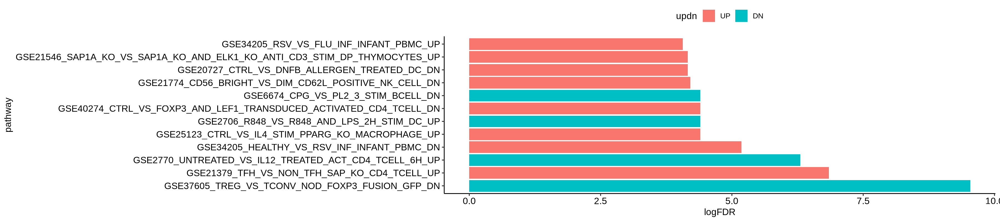

In [482]:
dsn_sel = dsn[group_day == 'D3', ][group_cell_type == 'FL', ][group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_sel <- DESeq(dds_sel)
res = as.data.table(results(dds_sel) , keep.rownames = T)

res[, ranking := -log2FoldChange*log10(padj)]
r_top = max(res$ranking[is.finite(res$ranking)])
r_bot = min(res$ranking[is.finite(res$ranking)])
tmp = res[ranking > r_top, ]
res[ranking > r_top, ranking := r_top + 1:nrow(tmp)]
tmp = res[ranking < r_bot, ]
res[ranking < r_bot, ranking := r_bot - 1:nrow(tmp)]
tmp = res[!is.na(ranking), ] 
ranked = tmp$ranking
names(ranked) = tmp$rn
ranked = sort(ranked, decreasing = TRUE)

#pathwaysDF <- msigdbr(species = "Mus musculus", category="C7") #, subcategory = 'IMMUNESIGDB') 
pathwaysDF <- msigdbr(species = "Mus musculus", category="C7") #, subcategory = 'VAX') 
#pathwaysDF <- msigdbr(species = "Mus musculus", category="H") #, subcategory = 'immunesigdb') 
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)
pathways[1]

fgsea <- fgsea(pathways = pathways, stats = ranked, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log2(padj)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 

options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr()

fgsea_fl_d3 = copy(fgseaRes)
ranked_fl_d3 = ranked



Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


[1] 12981

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


$GOLDRATH_EFF_VS_MEMORY_CD8_TCELL_DN
  [1] "Abca2"         "Abcc5"         "Abhd14a"       "Acadm"        
  [5] "Acp5"          "Acp6"          "Adam22"        "Adcy7"        
  [9] "Adgrg3"        "Akap9"         "Ankrd10"       "Arl4c"        
 [13] "Ash1l"         "B3galt6"       "Bckdhb"        "Bcl2"         
 [17] "Bcl2l11"       "Brd3"          "Grcc10"        "Rimoc1"       
 [21] "2310061I04Rik" "Car12"         "Cant1"         "Ccnd2"        
 [25] "Ccnl2"         "Ccr7"          "Cd7"           "Cd96"         
 [29] "Chchd7"        "Cipc"          "Coq9"          "Cox7a2l"      
 [33] "Crlf3"         "Cst7"          "Ctsw"          "Cyp4v3"       
 [37] "Dalrd3"        "Dbndd2"        "Dbp"           "Ddit3"        
 [41] "Ddx51"         "Dgka"          "Diaph2"        "Dnaaf10"      
 [45] "Dph5"          "Dusp12"        "Eif2ak4"       "Elp3"         
 [49] "Emb"           "Eml5"          "Eomes"         "Eps15l1"      
 [53] "Evl"           "Ezh1"          "Entrep3"       "Fam8a1"       
 [57] "Galnt11"       "Gbe1"          "Gmip"          "Gnl2"         
 [61] "Gstk1"         "Gtf2i"         "H2aj"          "Hsd17b11"     
 [65] "H2-Ke6"        "Hsf1"          "Iapp"          "Ice1"         
 [69] "Ifitm10"       "Il4ra"         "Il6ra"         "Il6st"        
 [73] "Il7r"          "Itm2c"         "Itpr2"         "Jun"          
 [77] "Kcnj8"         "Klf17"         "Klf2"          "Lamp1"        
 [81] "Ltb"           "Lysmd1"        "Lysmd2"        "Man2c1"       
 [85] "Map4k3"        "Mbp"           "Mcoln2"        "Mecp2"        
 [89] "Mettl3"        "Mfng"          "Mlycd"         "Mrpl23"       
 [93] "Mtfr1l"        "Nacc2"         "Nckap1"        "Ndufa7"       
 [97] "Necap1"        "Nedd4"         "Nedd4l"        "Notch4"       
[101] "Nsg2"          "Paqr7"         "Pdgfb"         "Pdk1"         
[105] "Pdrg1"         "Phldb1"        "Pisd"          "Plekha1"      
[109] "Plekha5"       "Polr1b"        "Polr3a"        "Ppox"         
[113] "Ppp1r14b"      "Prkacb"        "Prmt3"         "Prss12"       
[117] "Psme2"         "Ptpn22"        "Pura"          "Qdpr"         
[121] "Rabac1"        "Rad52"         "Rasa4"         "Rassf5"       
[125] "Rere"          "Rflnb"         "Rgs10"         "Rnase4"       
[129] "Rpl14"         "Rpl19"         "Rpl39"         "Rplp0"        
[133] "Rplp1"         "Rpp14"         "Rps16"         "Rps18"        
[137] "Rps19"         "Rps23"         "Rps7"          "Rps8"         
[141] "Rrp1b"         "Rtkn"          "Rttn"          "Sbds"         
[145] "Sell"          "Sema4b"        "Sesn1"         "Setd4"        
[149] "Sh3bp5"        "Shisa5"        "Siah1a"        "Sipa1l2"      
[153] "Sit1"          "Six6"          "Slc11a2"       "Slc12a7"      
[157] "Slc26a2"       "Sltm"          "Snrk"          "Spice1"       
[161] "Stat4"         "Supt6"         "Surf2"         "Susd6"        
[165] "Taf1a"         "Taf1c"         "Tcf7"          "Tdrp"         
[169] "Tesk1"         "Tk2"           "Tlk2"          "Tmc6"         
[173] "Tmed4"         "Tnip1"         "Traf1"         "Traf3ip2"     
[177] "Traf5"         "Trmt1"         "Tsen34"        "Tsr1"         
[181] "Ttc14"         "Ttc27"         "Ttc3"          "Txk"          
[185] "Ublcp1"        "Usp18"         "Vkorc1"        "Wdr13"        
[189] "Wdr43"         "Wdr75"         "Xpc"           "Xrcc5"        
[193] "Ypel3"         "Zbtb20"        "Zeb1"          "Zfp1"         
[197] "Zfp90"         "Zkscan3"       "Zfp110"        "Zfp369"       
[201] "Zfp692"

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
"There are ties in the preranked stats (0.01% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results."


pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
GSE37605_TREG_VS_TCONV_NOD_FOXP3_FUSION_GFP_DN,8.957046e-06,0.04363873,0.5933255,-0.9367104,-1.567492,144,"Thbs1, R...."
GSE19888_ADENOSINE_A3R_INH_PRETREAT_AND_ACT_BY_A3R_VS_A3R_INH_AND_TCELL_MEMBRANES_ACT_MAST_CELL_UP,2.540533e-04,0.33201579,0.4984931,-0.9017903,-1.532181,167,"Thbs1, P...."
GSE21033_CTRL_VS_POLYIC_STIM_DC_3H_DN,3.312161e-04,0.33201579,0.4984931,0.9074606,1.636797,173,"Csf2rb2,...."
GSE21546_UNSTIM_VS_ANTI_CD3_STIM_DP_THYMOCYTES_UP,3.032572e-04,0.33201579,0.4984931,-0.9231481,-1.521593,124,"Thbs1, R...."
GSE22229_RENAL_TRANSPLANT_IMMUNOSUPP_THERAPY_VS_HEALTHY_PBMC_DN,3.697551e-04,0.33201579,0.4984931,-0.8923768,-1.526887,185,"Itga1, A...."
GSE7400_CTRL_VS_CSF3_IN_VIVO_TREATED_PBMC_UP,4.088864e-04,0.33201579,0.4984931,-0.8984574,-1.528715,171,"Rab27b, ...."


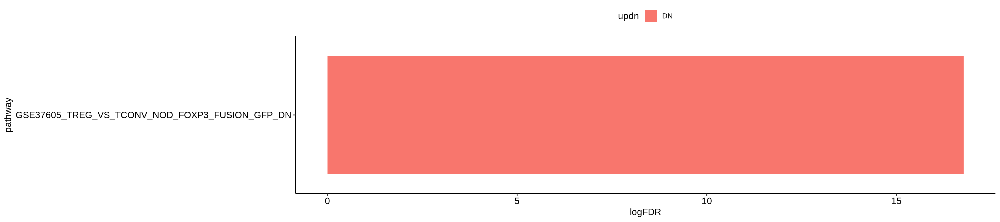

In [483]:
dsn_sel = dsn[group_day == 'D3', ][group_cell_type == 'ABM', ][group_genotype %in% c('Ctrl', 'MX'), ]
dsn_sel_df = setDF(dsn_sel[, .(sampleName, group)], rownames = dsn_sel$sampleName)

setkey(dsn, 'sampleName')
tmp = dsn[dsn_sel$sampleName, .(sampleName, fileName, condition)]
dds_sel <- DESeqDataSetFromMatrix(countData = mtx[, rownames(dsn_sel_df)], colData = dsn_sel_df, design = ~ group)

keep <- rowSums(counts(dds_sel) >= 10) >= floor(ncol(dds_sel) * .3)
dds_sel <- dds_sel[keep,]
nrow(dds_sel)

dds_sel <- DESeq(dds_sel)
res = as.data.table(results(dds_sel) , keep.rownames = T)

res[, ranking := -log2FoldChange*log10(padj)]
r_top = max(res$ranking[is.finite(res$ranking)])
r_bot = min(res$ranking[is.finite(res$ranking)])
tmp = res[ranking > r_top, ]
res[ranking > r_top, ranking := r_top + 1:nrow(tmp)]
tmp = res[ranking < r_bot, ]
res[ranking < r_bot, ranking := r_bot - 1:nrow(tmp)]
tmp = res[!is.na(ranking), ] 
ranked = tmp$ranking
names(ranked) = tmp$rn
ranked = sort(ranked, decreasing = TRUE)

pathwaysDF <- msigdbr(species = "Mus musculus", category="C7", subcategory = 'IMMUNESIGDB') 
#pathwaysDF <- msigdbr(species = "Mus musculus", category="H") #, subcategory = 'immunesigdb') 
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)
pathways[1]

fgsea <- fgsea(pathways = pathways, stats = ranked, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log2(pval)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 

options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr()

fgsea_abm_d3 = copy(fgseaRes)
ranked_abm_d3 = ranked


In [493]:
head(plotdat)

.id,pathway,pval,padj,log2err,ES,NES,size,leadingEdge,logFDR,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<dbl>,<fct>
ABM_D3,GSE37605_TREG_VS_TCONV_NOD_FOXP3_FUSION_GFP_DN,8.957046e-06,0.04363873,0.5933255,-0.9367104,-1.567492,144,"Thbs1, R....",16.768546,DN
ABM_D3,GSE20727_CTRL_VS_DNFB_ALLERGEN_TREATED_DC_DN,8.747045e-02,0.96464269,0.2343926,0.7885657,1.394839,130,Rab11fip....,3.515060,UP
ABM_D3,GSE21379_TFH_VS_NON_TFH_SAP_KO_CD4_TCELL_UP,2.770781e-01,0.96464269,0.1301056,0.6232165,1.127580,168,"Ank1, Kl....",1.851635,UP
ABM_D3,GSE21546_SAP1A_KO_VS_SAP1A_KO_AND_ELK1_KO_ANTI_CD3_STIM_DP_THYMOCYTES_UP,3.197970e-01,0.96464269,0.1204334,0.6012967,1.084565,173,"Myo1d, A....",1.644772,UP
ABM_D3,GSE21774_CD56_BRIGHT_VS_DIM_CD62L_POSITIVE_NK_CELL_DN,2.756892e-01,0.96464269,0.1301056,0.6234513,1.120059,161,"Myo1d, K....",1.858885,UP
ABM_D3,GSE25123_CTRL_VS_IL4_STIM_PPARG_KO_MACROPHAGE_UP,1.125000e-01,0.96464269,0.2114002,0.7482185,1.343584,156,"Ank1, Tf....",3.152003,UP


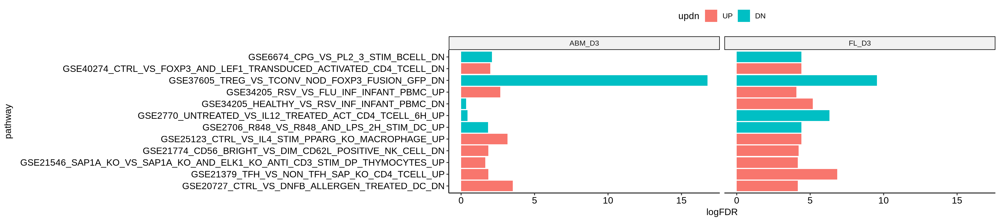

In [496]:
fgsea_dt = rbindlist(list(ABM_D3 = fgsea_abm_d3, FL_D3 = fgsea_fl_d3), idcol = T)
plotdat = fgsea_dt[pathway %in% fgsea_dt[padj < 0.1, pathway], ]
#plotdat[.id == 'FL_D3', logFDR := -logFDR]
options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + facet_wrap(~ .id)



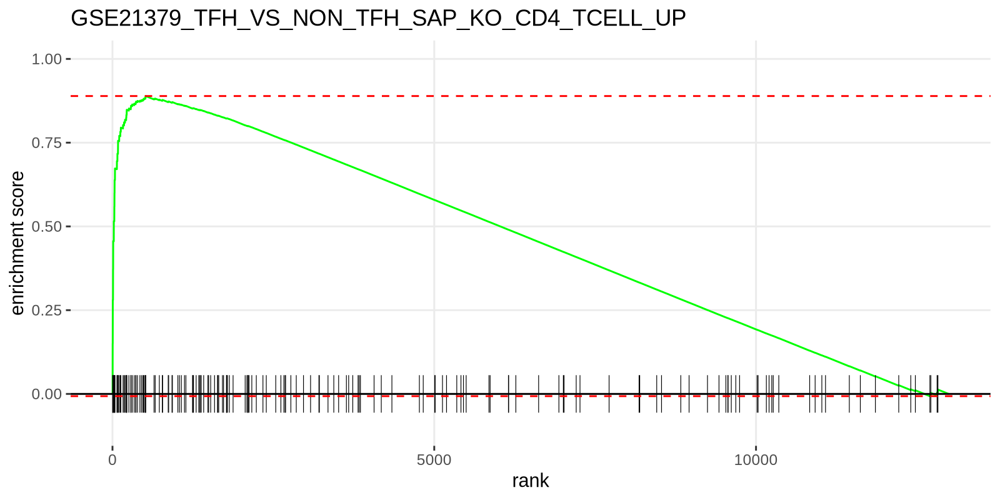

In [477]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 200)
plotEnrichment(pathway = pathways[['GSE21379_TFH_VS_NON_TFH_SAP_KO_CD4_TCELL_UP']], ranked_fl_d3) + 
  labs(title = 'GSE21379_TFH_VS_NON_TFH_SAP_KO_CD4_TCELL_UP') + ylim(-0.1, 1)


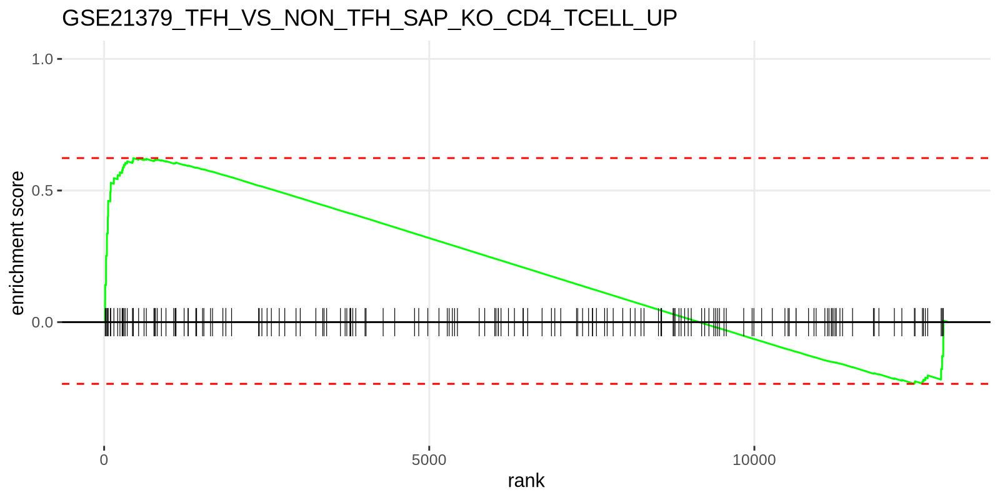

In [480]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 200)
plotEnrichment(pathway = pathways[['GSE21379_TFH_VS_NON_TFH_SAP_KO_CD4_TCELL_UP']], ranked_abm_d3) + 
  labs(title = 'GSE21379_TFH_VS_NON_TFH_SAP_KO_CD4_TCELL_UP') + ylim(-0.4, 1) 


In [457]:
fgsea_fl_d3[2, leadingEdge]

[[1]]
 [1] "Ank1"    "Gstm5"   "Cpox"    "Klf1"    "Blvrb"   "Nqo1"    "Add2"   
 [8] "Ssx2ip"  "Prdx2"   "Car2"    "Kel"     "Gclm"    "Fech"    "Gfi1b"  
[15] "Atp1b2"  "Hk1"     "Ptpn3"   "Mmp14"   "Slc43a1" "Tnfaip2" "Necap2" 
[22] "Abcb6"   "Abcb10"  "Abca3"   "Glrx5"   "Ccng1"   "Optn"    "Stx2"   
[29] "Xpnpep1" "Mgll"    "Ugcg"    "Narf"    "Arel1"   "Acp1"    "Car1"   
[36] "Reep6"   "Prdx6"   "Cox17"   "Klf3"

In [473]:
fgsea_abm_d3[pathway == 'GSE21379_TFH_VS_NON_TFH_SAP_KO_CD4_TCELL_UP', ]
fgsea_fl_d3[pathway == 'GSE21379_TFH_VS_NON_TFH_SAP_KO_CD4_TCELL_UP', ]

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,logFDR,updn
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<dbl>,<fct>
GSE21379_TFH_VS_NON_TFH_SAP_KO_CD4_TCELL_UP,0.308094,0.9668445,0.1250334,0.6232165,1.110309,168,"Ank1, Kl....",1.698558,UP


pathway,pval,padj,log2err,ES,NES,size,leadingEdge,logFDR,updn
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<dbl>,<fct>
GSE21379_TFH_VS_NON_TFH_SAP_KO_CD4_TCELL_UP,2.267662e-06,0.005284277,0.6272567,0.889166,1.685839,167,"Ank1, Gs....",18.75036,UP


# maSigPro

In [386]:
dsn2 = dsn[, .(sampleName, group_day, rep, group_cell_type, group_genotype)]
dsn2[, Time := as.numeric(sub('D', '', group_day))]
dsn2[, Replicate := as.numeric(sub('rep', '', rep))]
dsn2[, Control := 0]
dsn2[group_genotype == 'Ctrl', Control := 1]
dsn2[, ME := 0]
dsn2[group_genotype == 'ME', ME := 1]
dsn2[, MX := 0]
dsn2[group_genotype == 'MX', MX := 1]
dsn2[, MX_ME := 0]
dsn2[group_genotype == 'MX_ME', MX_ME := 1]
dsn2 = dsn2[, .(sampleName, Time, Replicate, Control, ME, MX, MX_ME)]
dsn2 = setDF(dsn2[, 2:ncol(dsn2)], rownames = dsn2$sampleName)
head(dsn2)


,Time,Replicate,Control,ME,MX,MX_ME
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
D1_ABM_Ctrl_rep1,1,1,1,0,0,0
D1_ABM_Ctrl_rep2,1,2,1,0,0,0
D1_ABM_ME_rep1,1,1,0,1,0,0
D1_ABM_ME_rep2,1,2,0,1,0,0
D1_ABM_MX_ME_rep1,1,1,0,0,0,1
D1_ABM_MX_ME_rep2,1,2,0,0,0,1


In [548]:
dds = readRDS('data/nb_rnaseq_mar20.rds')
mtx_norm = counts(dds, normalized = T)
head(mtx_norm)

,D8_ABM_MX_ME_rep1,D8_ABM_Ctrl_rep1,D8_FL_MX_ME_rep1,D3_FL_MX_rep1,D1_ABM_MX_rep1,D1_FL_MX_ME_rep1,D3_FL_Ctrl_rep1,D1_ABM_Ctrl_rep1,D8_ABM_ME_rep1,D1_FL_Ctrl_rep1,⋯,D1_FL_Ctrl_rep2,D8_FL_MX_ME_rep2,D3_FL_MX_rep2,D1_ABM_Ctrl_rep2,D8_ABM_ME_rep2,D1_FL_MX_rep2,D3_ABM_MX_rep2,D3_FL_MX_ME_rep2,D3_ABM_ME_rep2,D8_FL_MX_rep2
0610005C13Rik,4.149125,2.284768,6.074606,6.883525,18.00036,15.965762,14.19999,20.689849,2.231784,3.320694,⋯,5.269944,3.185809,9.262981,18.14634,5.609575,9.559176,10.14969,10.97596,10.53430,12.20188
0610007P14Rik,362.011113,364.420455,223.747974,326.279093,514.01014,464.147523,253.01807,581.196674,351.505937,560.090312,⋯,528.970636,270.156614,303.362623,348.40969,319.745753,344.865672,302.92913,368.79228,415.69968,433.84462
0610009B22Rik,80.907928,102.814549,47.584411,97.746058,26.00051,61.582227,54.21816,101.568351,76.996539,59.772484,⋯,58.628128,86.654008,74.103847,44.76097,93.960375,60.296344,49.96769,83.41730,44.56819,119.98515
0610009L18Rik,22.820185,30.844365,25.310857,31.664216,36.00071,7.982881,21.94545,3.761791,40.172107,14.389672,⋯,15.151089,23.574988,24.701282,43.55121,26.645479,16.177068,28.88757,26.34231,51.05084,20.33647
0610009O20Rik,650.375267,668.294566,476.856543,578.216115,458.00904,597.575681,641.58154,543.578767,624.899443,820.211307,⋯,698.926332,412.880863,635.286104,529.87307,605.834058,708.114376,530.12597,791.00091,486.19845,550.44037
0610010F05Rik,970.895135,995.016353,1006.359668,697.989453,1050.02072,1060.582793,1204.41766,1139.822604,1017.693379,1220.908328,⋯,1228.555711,980.592051,661.531216,1157.73637,1022.344973,919.151578,678.46756,734.65764,851.65763,933.44382


In [392]:
design = make.design.matrix(dsn2, degree = 1)

In [ ]:
fit <- p.vector(mtx_norm, design, Q = 0.05, MT.adjust = "BH", min.obs = 20)
fit

In [550]:
names(fit)

[1] "SELEC"         "p.vector"      "p.adjusted"    "G"            
 [5] "g"             "FDR"           "i"             "dis"          
 [9] "dat"           "min.obs"       "Q"             "groups.vector"
[13] "edesign"       "family"

In [551]:
#dim(fit$SELEC)  # original matrix
#head(fit$p.vector) #  p value in matrix 
#head(fit$p.adjusted) #  p value
head(fit$family) #  p value

$family
[1] "gaussian"

$link
[1] "identity"

$linkfun
function (mu) 
mu
<environment: namespace:stats>

$linkinv
function (eta) 
eta
<environment: namespace:stats>

$variance
function (mu) 
rep.int(1, length(mu))
<bytecode: 0x55559381afc0>
<environment: 0x55566bf81948>

$dev.resids
function (y, mu, wt) 
wt * ((y - mu)^2)
<bytecode: 0x55559381b1f0>
<environment: 0x55566bf81948>

In [ ]:
tstep <- T.fit(fit, step.method = "backward", alfa = 0.05)
sigs <- get.siggenes(tstep, rsq = 0.6, vars = "groups")
sigs_see = see.genes(sigs$sig.genes$MXvsControl, show.fit = T, dis = design$dis, cluster.method = "hclust" ,cluster.data = 1, k = 4)


[1] 1184   48

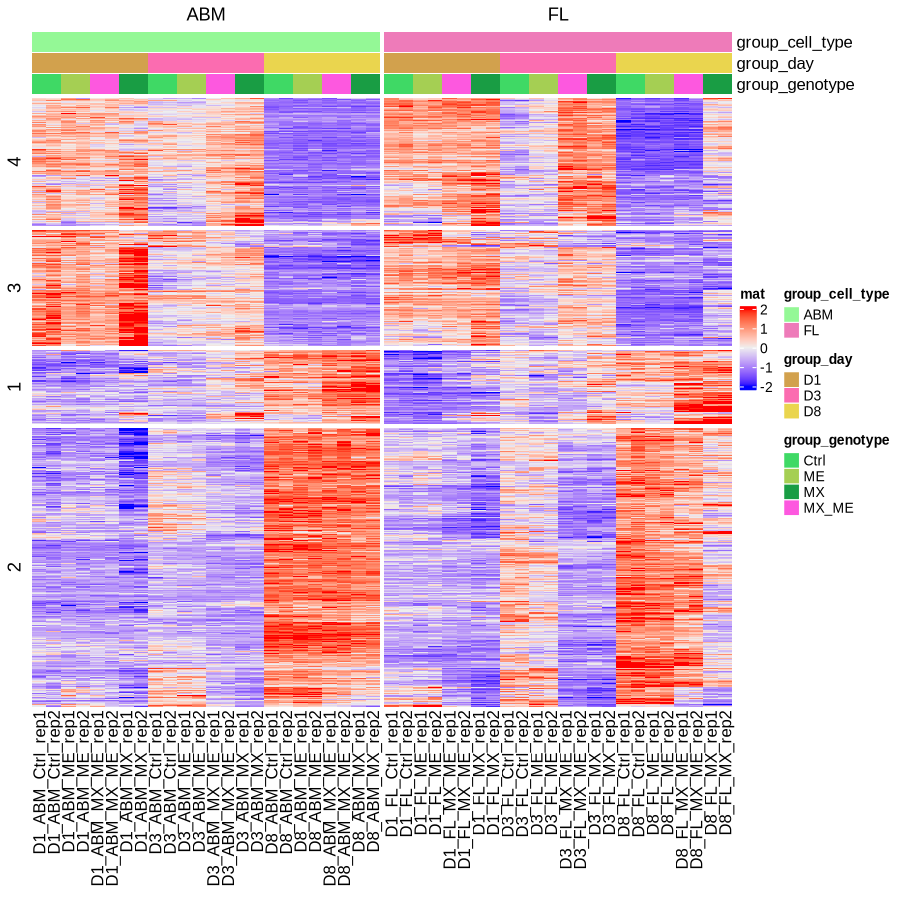

In [713]:
# how ME genes looks like in other samples 
gene_sel = names(sigs_see$cut)

dsn_sel = dsn[, .(group_cell_type, group_day, group_genotype, sampleName)]
dsn_sel = setDF(dsn_sel[,  .(group_cell_type, group_day, group_genotype)], rownames = dsn_sel$sampleName)
column_ha = HeatmapAnnotation(df = dsn_sel) 

mtx_norm_counts = counts(dds, normalized = T)
mtx_norm_counts = mtx_norm_counts[gene_sel, rownames(dsn_sel)]
dim(mtx_norm_counts)

plotdat = scale_fun(mtx_norm_counts[, rownames(dsn_sel)])
plotdat = plotdat[!is.na(plotdat[,1]), ]
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 9, repr.plot.height = 9, repr.plot.res = 100)
col_split = paste0(dsn_sel$group_cell_type)
tmp = Heatmap(plotdat, name = "mat", top_annotation = column_ha, show_column_names = T, show_row_names = F, show_column_dend = T, column_split = col_split, show_row_dend = F, cluster_columns = F, cluster_rows = T, km = 4)
tmp


In [715]:
lapply(row_order(tmp), length)

Warning message:
"The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`."


$`4`
[1] 258

$`3`
[1] 227

$`1`
[1] 146

$`2`
[1] 553

In [788]:
head(vs_ctrl_dt)

.id,rn,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,day,cell_type,genotype
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
res_d1_FL_me_ctrl,0610005C13Rik,9.59956,1.50475835,0.84143923,1.7883150,0.07372521,0.3664920,d1,FL,me
res_d1_FL_me_ctrl,0610007P14Rik,376.75952,-0.20577531,0.18578074,-1.1076246,0.26802399,0.6663250,d1,FL,me
res_d1_FL_me_ctrl,0610009B22Rik,72.61005,0.12566146,0.34205861,0.3673682,0.71334439,0.9296093,d1,FL,me
res_d1_FL_me_ctrl,0610009L18Rik,25.25928,0.55278433,0.61719486,0.8956399,0.37044513,0.7533990,d1,FL,me
res_d1_FL_me_ctrl,0610009O20Rik,599.32294,-0.15580559,0.10350388,-1.5053116,0.13224399,0.4928538,d1,FL,me
res_d1_FL_me_ctrl,0610010F05Rik,993.26564,0.03853159,0.09458321,0.4073830,0.68372672,0.9172559,d1,FL,me


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


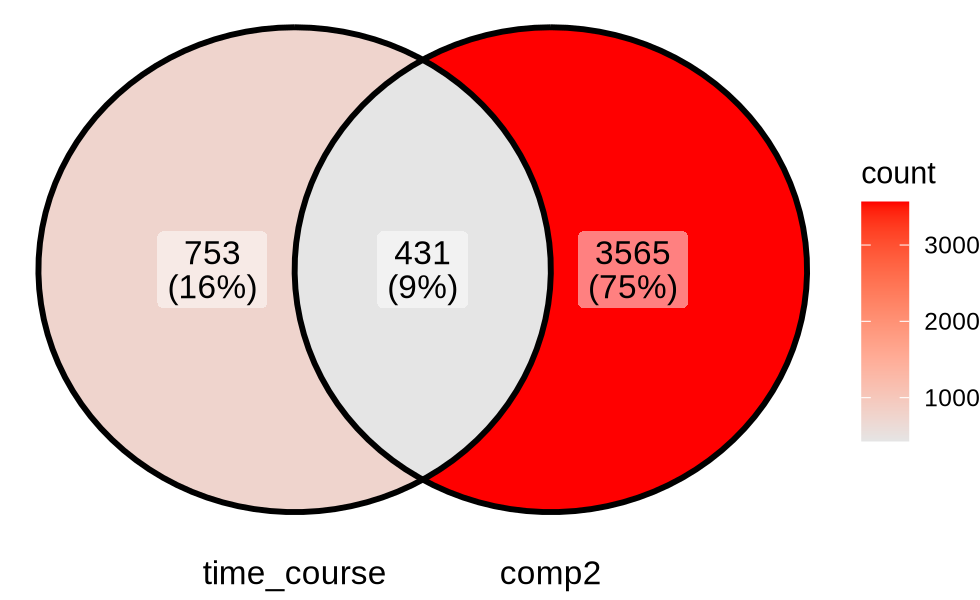

In [796]:
options(repr.plot.width = 4.9, repr.plot.height = 3, repr.plot.res = 200)
xx = list(time_course = names(sigs_see$cut), comp2 = unique(vs_ctrl_dt[padj < 0.05 & abs(log2FoldChange) > 1, rn]))
ggVennDiagram(xx) + scale_fill_gradient(low="grey90",high = "red") + coord_flip()

[1] 1184

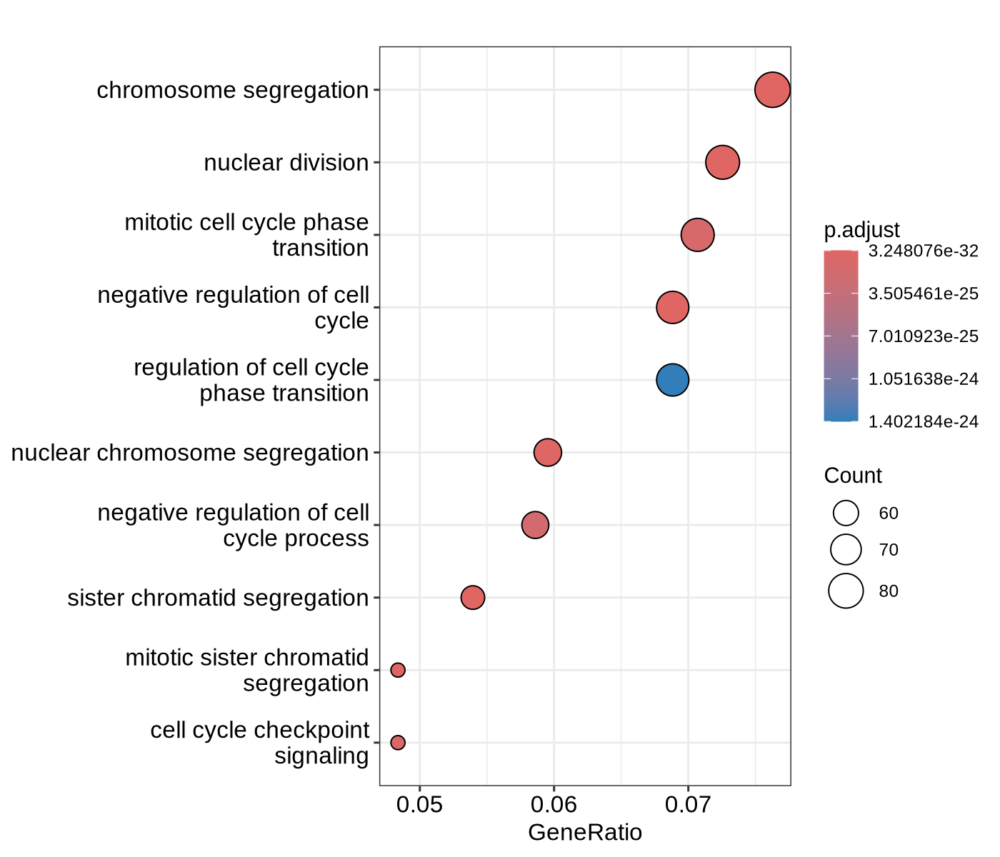

In [716]:
#xx = intersect(d1_up, intersect(d8_up, d3_up))
#ov = intersect(xx$FL, xx$ABM)
xx = names(sigs_see$cut)
length(xx)
yy <- enrichGO(xx, 'org.Mm.eg.db', ont="BP", pvalueCutoff=0.01, readable = T, keyType = 'SYMBOL')
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
dotplot(yy)

# One of "MF", "BP", and "CC" subontologies.


# vs clinical data

In [1]:
res_mnx1_vs_pAML = readRDS('data/res_mnx1_vs_pAML.rds')
head(res_mnx1_vs_pAML)


Warning message in gzfile(file, "rb"):
“cannot open compressed file 'data/res_mnx1_vs_pAML.rds', probable reason 'No such file or directory'”


ERROR: Error in gzfile(file, "rb"): cannot open the connection


In [2]:
getwd()

[1] "/research/rgs01/home/clusterHome/whu78/script/BisiWang"